# Hydrogen Scenarios -- First Fully Solved Run

Author: Katherine Shaw

Date: July 8th

Trials: 
- need BAU case
- hydrogen with TYNDP transmission expansion
- hydrogen with unlimited transmission expansion
- hydrogen delay by 10 years
- hydrogen delay by 20 years 


Evaluation Metrics:
- bev utilization 


Notes on potentially useful evaluation metrics from Bobby's paper: 

In [2]:
#Packages 
import pypsa
import matplotlib.pyplot as plt 
import cartopy 
import geopandas
import networkx
import linopy
import cartopy.crs as ccrs
import atlite 
import geopandas as gpd 
import xarray
import pandas as pd 
from datetime import datetime
import numpy as np
from pypsa.plot import add_legend_patches
import random
import plotly.graph_objects as go

## Overall view of colors matched to carriers 
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

#importing auxillary functions
import Auxillary_Functions as af

In [515]:
def bus_connections(network, bus_name): 
    if bus_name in network.buses.index.values:

        connected_generators = network.generators[network.generators.bus == bus_name]
        connected_loads = network.loads[network.loads.bus == bus_name]
        connected_storage_units = network.storage_units[network.storage_units.bus == bus_name]
        connected_links_in = network.links[network.links.bus1 == bus_name]
        connected_links_out = network.links[network.links.bus0 == bus_name]
        connected_lines = network.lines[(network.lines.bus0 == bus_name) | (network.lines.bus1 == bus_name)]
        connected_transformers = network.transformers[(network.transformers.bus0 == bus_name) | (network.transformers.bus1 == bus_name)]
        connected_stores = network.stores[network.stores.bus == bus_name]
        if any(connected_generators.index.values):
            print("The generators connected to this bus are:    " + str(connected_generators.index.values))
        if any(connected_loads.index.values):
            print("The loads connected to this bus are:     " + str(connected_loads.index.values))
        if any(connected_storage_units.index.values):
            print("The storage units connected to this bus are:   " + str(connected_storage_units.index.values))
        if any(connected_stores.index.values):
            print("The stores connected to this bus are:   " + str(connected_stores.index.values))
        if any(connected_links_in.index.values):
            print("The incoming links to this bus are from the bus:  " +  str(connected_links_in.bus0.values))
        if any(connected_links_in.index.values):
            print("The incoming links are:  " +  str(connected_links_in.index))
        if any(connected_links_out.index.values):
            print("The outgoing links from this bus are to the bus:  " +  str(connected_links_out.bus1.values))
        if any(connected_lines.index.values):
            print("The lines connected to this bus are connected to:   "  + str(connected_lines.bus1.values))
        if any(connected_transformers.index.values):
            print(connected_transformers.index.values)
        return None    
    else:      
        return str("This bus does not exist in the network")

# Loading the Networks

This string of networks are for a time resolution of 26 hours, significantly speeding up their solving time, and thus need to be re-run with a finer time resolution after the intial results come back (if they are somewhat interesting )

In [3]:
#Hydrogen unlimited, new config file [July 9]
Scenario3_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3/networks/base_s_39___2020.nc')
Scenario3_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3/networks/base_s_39___2030.nc')
Scenario3_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3/networks/base_s_39___2040.nc')
Scenario3_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3/networks/base_s_39___2050.nc')
Scenario3_list = [Scenario3_2020, Scenario3_2030, Scenario3_2040, Scenario3_2050]


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [4]:
Scenario2_1_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/copt1.82_notyndp/networks/base_s_39___2020.nc')
Scenario2_1_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/copt1.82_notyndp/networks/base_s_39___2030.nc')
Scenario2_1_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/copt1.82_notyndp/networks/base_s_39___2040.nc')
Scenario2_1_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/copt1.82_notyndp/networks/base_s_39___2050.nc')
Scneario2_1_list = [Scenario2_1_2020, Scenario2_1_2030, Scenario2_1_2040, Scenario2_1_2050]


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


#### Helpful evaluation functions for this

In [48]:
#2020
def co2_constraint_satisfaction(network_list):
    for net in network_list:
        network_test = net
        constraint_value_co2 = network_test.global_constraints.loc['CO2Limit'].constant #tons of co2 allowed
        timestamp = net.snapshots[-1]
        value_co2_atmosphere_store_last_snapshot = network_test.stores_t.e['co2 atmosphere'][timestamp]
        if constraint_value_co2+1 < value_co2_atmosphere_store_last_snapshot: #the plus one is to account for rounding errors (give it an integer option)
            print("The CO2 constraint has been violated")
        else:
            print("The CO2 constraint remains satisfied. " + f"The value of the CO2 constraint is {constraint_value_co2:e}, and the value of the CO2 store at the last snapshot is {value_co2_atmosphere_store_last_snapshot:e} tons of CO2")

In [6]:
co2_constraint_satisfaction(Scenario3_list)

The CO2 constraint remains satisfied. The value of the CO2 constraint is 3.314820e+09, and the value of the CO2 store at the last snapshot is 3.314820e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.071763e+09, and the value of the CO2 store at the last snapshot is 2.071763e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 4.603917e+08, and the value of the CO2 store at the last snapshot is 4.603917e+08 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.301959e+08, and the value of the CO2 store at the last snapshot is 2.301959e+08 tons of CO2


In [7]:
#to be honest I probably need to check that all constraints are satisfied

In [7]:
def hydrogen_capacity_graphs(network_list): 
    hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
    hydrogen_tech_tuple_list = [('Link', tech) for tech in hydrogen_tech_list]
    networks1 = network_list
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns
    axes = axes.flatten()  # make it easier to iterate

    for i, tech in enumerate(hydrogen_tech_tuple_list):
        carrier_type, technology = tech
        mean_value = []
        mean_value_optimal = []
        for net in networks1:
            if technology in net.statistics().loc[carrier_type].index:
                stats = net.statistics().loc[carrier_type, technology]
                mean_value.append(stats['Installed Capacity'])
                mean_value_optimal.append(stats['Optimal Capacity'])
            else:
                mean_value.append(0)
                mean_value_optimal.append(0)
    
        ax = axes[i]
        ax.scatter([2020, 2030, 2040, 2050], mean_value, label='Installed Capacity', alpha=0.5)
        ax.scatter([2020, 2030, 2040, 2050], mean_value_optimal, label='Optimal Capacity', alpha=0.5)
        ax.set_title(f'{technology}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Capacity, MW')
        ax.legend()

    plt.tight_layout()
    plt.show()

In [134]:
0.01472 * .75

0.011040000000000001

[0.0, 0.0, 0.0, 573064.80082]
optimal value
[0.02427, 0.01343, 573064.90214, 573064.80701]
[0.0, 13912.70608, 19292.14638, 5379.4403]
optimal value
[13914.26658, 19327.31968, 19292.23378, 12754.27798]
[0.0, 1382.1105, 25360.9776, 23978.8671]
optimal value
[1388.41248, 25361.34199, 25361.0472, 24143.28844]
[0.0, 38.76124, 38.76124, 189521.45646]
optimal value
[40.87883, 40.6016, 189529.25404, 260776.39982]
[0.0, 0.0, 0.0, 60470.64761]
optimal value
[3.74489, 1.47693, 60470.70571, 66547.81109]
[0.0, 0.0, 0.0, 0.0]
optimal value
[0.03514, 0.01472, 0.03806, 0.00679]


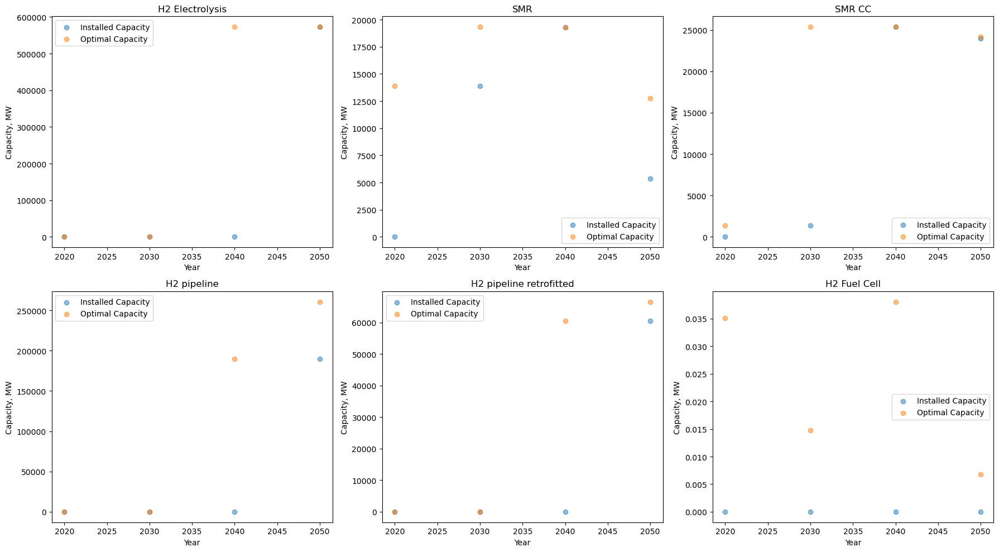

In [127]:
hydrogen_capacity_graphs(Scenario3_list)

In [ ]:
def Sankey_biomass_hydrogen(network_choice):
    network = network_choice  # Use the 2050 network for this example
    #create the dataframe for the sankey 
    Sankey_data = pd.DataFrame(columns=['link name']) #, 'source', 'target',  'link_dispatch_from_source', 'link_arriving_at_target'])

    #identify the source buses, the links you want to evaluate start at these buses  
    # the same types of carriers should be the same color, and then the country level buses should be combined into one bus 
        #hydrogen buses 
    hydrogen_carriers = ['H2']
    hydrogen_buses = network.buses[network.buses.carrier.isin(hydrogen_carriers)].index
    #print(hydrogen_buses)
        #biomass buses 
    biomass_carrier = ['biogas', 'solid biomass','solid biomass for industry', 'unsustainable bioliquids', 'unsustainable biogas']
    biomass_buses = network.buses[network.buses.carrier.isin(biomass_carrier)].index
    #print(biomass_buses) 
    buses_options = biomass_buses.append(hydrogen_buses).copy()

    all_links = network.links[network.links.bus0.isin(buses_options)].index.copy()
    Sankey_data['link name'] = all_links.values
    #identifying the source buses 
    Sankey_data['source'] = Sankey_data['link name'].map((network.links.loc[all_links, 'bus0']))
    #identifying the target buses
    Sankey_data['target'] = Sankey_data['link name'].map((network.links.loc[all_links, 'bus1']))
    #recording the dispatch from the source bus
    dispatch_series = (network.links_t.p0[all_links].sum() * network.snapshot_weightings.objective[0]).copy()
    Sankey_data['link_dispatch_from_source'] = Sankey_data['link name'].map(dispatch_series) 
    #recording the energy arriving at the target bus 
    dispatch_series = (network.links_t.p1[all_links].sum() * network.snapshot_weightings.objective[0] * -1).copy()
    Sankey_data['link_arriving_at_target'] = Sankey_data['link name'].map(dispatch_series) 

    #isolating the links that have negative dispatch or arrival values
    negative_dispatch = Sankey_data[Sankey_data['link_dispatch_from_source'] < 0]
    negative_arrival = Sankey_data[Sankey_data['link_arriving_at_target'] < 0]
    negative_links = pd.concat([negative_dispatch, negative_arrival]).drop_duplicates().copy() #these are the links that are contributing power to the bus, not taking power from the bus, so they should be colored differently in the sankey diagram

    Sankey_data = Sankey_data.drop(negative_links.index, inplace = False)

    # Carrier info
    Sankey_data['carrier'] = Sankey_data['link name'].map(network.links.loc[all_links, 'carrier'])


    #aggregating sources, targets, and flows to carrier types (so I don't get one line for each country)
    to_remove = ['AL0 0', 'AT0 0', 'BA0 0', 'BE0 0', 'BG0 0',
    'CH0 0', 'CZ0 0', 'DE0 0', 'DK0 0', 'DK1 0',
    'EE0 0', 'ES0 0', 'ES6 0', 'FI1 0', 'FR0 0',
    'FR5 0', 'GB2 0', 'GB3 0', 'GR0 0', 'HR0 0',
    'HU0 0', 'IE3 0', 'IT0 0', 'IT4 0', 'LT0 0',
    'LU0 0', 'LV0 0', 'ME0 0', 'MK0 0', 'NL0 0',
    'NO1 0', 'PL0 0', 'PT0 0', 'RO0 0', 'RS0 0',
    'SE1 0', 'SI0 0', 'SK0 0', 'XK0 0']

    # Function to remove matching substrings
    def clean_value(val):
        for pattern in to_remove:
            val = val.replace(pattern, '')
        val =  val.strip()
        return val if val else 'electric network'

    Sankey_data['aggregate source'] = Sankey_data['source'].apply(clean_value)
    Sankey_data['aggregate targets'] = Sankey_data['target'].apply(clean_value)

    # Aggregate with carrier preserved (take first carrier in each group)
    agg_flows = Sankey_data.groupby(['aggregate source', 'aggregate targets']).agg({
        'link_dispatch_from_source': 'sum',
        'carrier': 'first'  # or another strategy if multiple carriers per link group
    }).reset_index()


    # Deduplicated node labels
    all_labels = pd.unique(agg_flows['aggregate source'].tolist() + agg_flows['aggregate targets'].tolist())
    label_to_id = {label: i for i, label in enumerate(all_labels)}


    #for construction of the sankey diagram 

    agg_flows['source_id'] = agg_flows['aggregate source'].map(label_to_id)
    agg_flows['target_id'] = agg_flows['aggregate targets'].map(label_to_id)
    agg_flows


    # Add custom hover text
    agg_flows['custom_text'] = (
        'Carrier: ' + agg_flows['carrier'] +
        '<br>From: ' + agg_flows['aggregate source'] +
        '<br>To: ' + agg_flows['aggregate targets'] +
        '<br>Flow: ' + agg_flows['link_dispatch_from_source MWh'].round(2).astype(str)
    )

    # Sankey Plot
    fig = go.Figure(data=[go.Sankey(
        node=dict(
            label=list(all_labels),
            pad=15,
            thickness=20,
            line=dict(color='black', width=0.5)
        ),
        link=dict(
            source=agg_flows['source_id'],
            target=agg_flows['target_id'],
            value=agg_flows['link_dispatch_from_source'],
            customdata=agg_flows['custom_text'],
            hovertemplate='%{customdata}<extra></extra>'
        )
    )])

    fig.update_layout(title_text="Energy Flow Sankey Diagram with Carrier Info", font_size=12)
    fig.show()

Sankey_biomass_hydrogen(Scenario3_2040)


NameError: name 'Scenario3_2040' is not defined

In [11]:
#so the question isn't really about h2 productino of electricity, because that's negligable, but how it can mop up excess energy from renewables


Question1: WHEN is the most hydrogen being produced, and it is utilizing curtailment/enocuraging perhaps the buildout of renewables (whereas the gaol of flex is to reduce renewables) 
(basically would the delay of hydrogen supply also reduce the renewbale buildout? -- if it's using the electricity non-opportunistically)

In [227]:
#wind and solar production -- time series 
network_choice = Scenario3_2020
generator_carriers = network_choice.generators.carrier.unique()

#creating the dispatch profiles for the generators
###The limit of the generator output is set at p_nom*p_max_pu, but this is static interpretation so can only be used for thermal generators 
generator_maximum = network_choice.generators.copy()
generator_maximum = generator_maximum.loc[:,['p_nom_opt', 'p_max_pu']]
generator_maximum['max_dispatch'] = generator_maximum['p_nom_opt'] * generator_maximum['p_max_pu']
generator_maximum_grouped = generator_maximum.groupby(network_choice.generators.carrier).sum().copy()
### For renewable generators, p_max_pu has to come from a time series, finding this maximum
renewable_p_max_pu  = network_choice.generators_t.p_max_pu.T.copy()
renewable_p_max_pu_timeseries = renewable_p_max_pu.multiply(network_choice.generators['p_nom_opt'], axis = 0).T  #p_nom multiplied by p_max_pu
renewable_p_max_pu_timeseries = renewable_p_max_pu_timeseries.dropna(axis=1, how='all') #dropping all the columns where the entire column was filled with NA, were artifacts of the multiplication that were thermal generators
    #checking that all the columns of the time series are the all the generators in rewnwable_p_max_pu from n.generators_t.p_max_pu
renewable_p_max_pu_timeseries = renewable_p_max_pu_timeseries.T.groupby(network_choice.generators.carrier).sum().copy()
renewable_p_max_pu_timeseries = renewable_p_max_pu_timeseries.T
non_zero_columns = ~ (renewable_p_max_pu_timeseries == 0).all()
renewable_p_max_timeseries = renewable_p_max_pu_timeseries.loc[:, non_zero_columns].copy()

#combining into carriers
#wind 
offwind_carriers = ["offwind-ac", 'offwind-dc', 'offwind-float']
valid_columns = list(set(offwind_carriers).intersection(renewable_p_max_timeseries.columns))
renewable_p_max_timeseries['Offwind_total'] = (renewable_p_max_timeseries.loc[:, valid_columns].sum(axis=1))

#solar 
solar_carriers = ['solar', 'solar rooftop', 'solar-hsat']
valid_columns = list(set(solar_carriers).intersection(renewable_p_max_timeseries.columns))
renewable_p_max_timeseries['Solar_total'] = (renewable_p_max_timeseries.loc[:, valid_columns].sum(axis=1))



carrier,offwind-ac,offwind-dc,offwind-float,onwind,ror,rural solar thermal,solar,solar rooftop,solar-hsat,urban central solar thermal,urban decentral solar thermal,Offwind_total,Solar_total
snapshot,,,,,,,,,,,,,
2019-01-01 00:00:00,14912.308636,0.015705,0.011482,91216.265988,9584.354072,0.006572,7778.013597,0.012511,27606.654285,0.003613,0.006389,14912.335823,35384.680393
2019-01-02 02:00:00,11238.315577,0.015281,0.011455,76047.889928,9589.541487,0.005866,9440.088149,0.012757,27218.192066,0.002988,0.005812,11238.342313,36658.292972
2019-01-03 04:00:00,8257.679457,0.014156,0.012391,44130.727292,9421.078428,0.004940,9389.632401,0.012120,26198.082108,0.003144,0.004769,8257.706004,35587.726629
2019-01-04 06:00:00,12858.529025,0.015365,0.011892,65816.490706,9351.797895,0.004335,6932.076904,0.011360,26981.072284,0.002469,0.004232,12858.556282,33913.160548
2019-01-05 08:00:00,8443.128611,0.012685,0.007925,41992.950121,9372.588843,0.005759,7082.504837,0.012624,34240.351894,0.002165,0.005673,8443.149220,41322.869355
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-26 16:00:00,10717.597434,0.013374,0.010603,29727.743898,28497.835023,0.003993,7023.338254,0.010608,27268.006975,0.001725,0.003894,10717.621411,34291.355837
2019-12-27 18:00:00,9982.230401,0.014254,0.011688,33711.802134,26142.107028,0.004880,8860.047449,0.011230,26277.300768,0.002679,0.004725,9982.256343,35137.359448
2019-12-28 20:00:00,16109.267568,0.015890,0.013507,57340.986159,22501.463525,0.005037,9890.459015,0.011263,23968.933403,0.003197,0.004929,16109.296965,33859.403682


In [239]:
grouped_generators = network_choice.generators_t.p.copy()
grouped_generators = grouped_generators.T.groupby(network_choice.generators.carrier).sum()
grouped_generators = grouped_generators.T
grouped_generators['Offwind_total'] = grouped_generators['offwind-ac'] + grouped_generators['offwind-dc'] + grouped_generators['offwind-float']
grouped_generators['Solar_total'] = grouped_generators['solar'] + grouped_generators['solar-hsat'] + grouped_generators['solar rooftop']
grouped_generators


carrier,biogas,coal,gas,geothermal,lignite,nuclear,offwind-ac,offwind-dc,offwind-float,oil primary,...,solar-hsat,solid biomass,unsustainable biogas,unsustainable bioliquids,unsustainable solid biomass,urban central heat vent,urban central solar thermal,urban decentral solar thermal,Offwind_total,Solar_total
snapshot,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,0.000067,94062.031643,463731.267388,97.999840,181866.306058,92491.641853,14899.270104,0.011734,0.007892,640759.558140,...,27606.648716,253.446971,22584.083353,21683.871413,165223.415317,-797.297383,0.002928,0.004539,14899.289730,35384.117000
2019-01-02 02:00:00,0.000067,140452.827853,464137.998818,97.999840,181866.557098,92491.642161,11238.306350,0.011727,0.007989,665173.343976,...,27218.186246,253.447085,22584.083374,21778.178067,168995.055131,-461.104794,0.002438,0.004248,11238.326066,36658.268330
2019-01-03 04:00:00,0.000067,249218.902059,465046.238362,97.999881,181866.835445,92491.642511,8257.670765,0.010665,0.008746,776962.189901,...,26198.076540,253.447053,22584.083382,21993.033038,171209.983478,-1000.539717,0.002739,0.003518,8257.690175,35587.703940
2019-01-04 06:00:00,0.000067,173615.489387,462285.738867,97.999876,181866.270462,92491.642712,12858.519909,0.011810,0.008310,768137.674657,...,26981.067199,253.447020,22584.083406,21937.458617,168722.041628,-250.092250,0.002146,0.003251,12858.540029,33913.140600
2019-01-05 08:00:00,0.000067,189138.923764,461585.877828,97.999838,181866.197957,92491.642512,8443.120695,0.009464,0.005247,636164.132979,...,34240.346682,253.447068,22584.083396,21705.880437,167588.119546,-249.826834,0.001807,0.004161,8443.135406,41322.847801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-12-26 16:00:00,0.000065,128091.950117,456935.520650,97.999839,181866.294189,92491.642462,10717.588798,0.009935,0.007417,720307.658118,...,27268.001887,253.447117,22584.083345,21811.858809,167689.389366,-626.001823,0.001393,0.002730,10717.606151,34291.334593
2019-12-27 18:00:00,0.000067,142305.416492,459414.065606,97.999839,181099.748761,91695.945893,9982.220318,0.010547,0.007954,642086.253457,...,26277.295637,253.447000,22584.083345,21713.636230,167992.608272,-476.602763,0.002092,0.003304,9982.238819,35137.336979
2019-12-28 20:00:00,0.000067,128370.581081,459270.562496,97.999840,181099.881199,91373.987406,16089.303309,0.011614,0.009223,613247.031885,...,23968.928107,253.447051,22584.083352,21698.294038,165969.955722,-528.227007,0.002528,0.003446,16089.324146,33859.381652


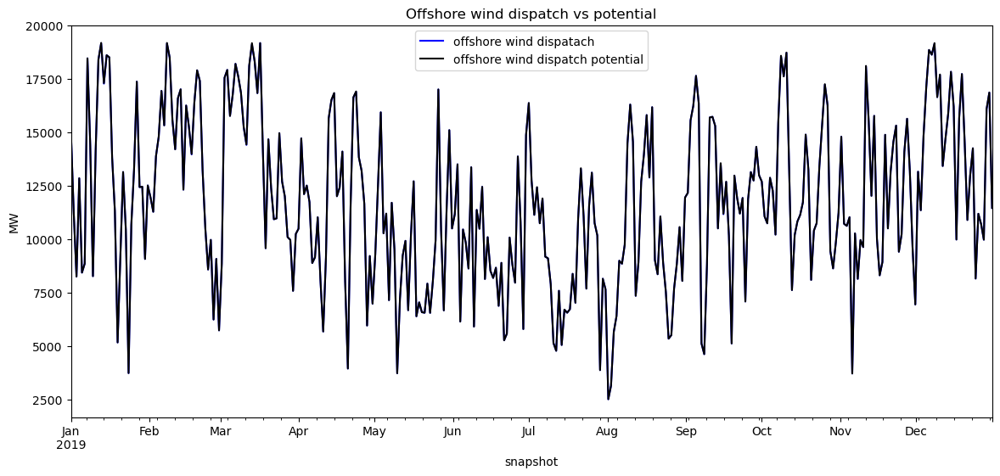

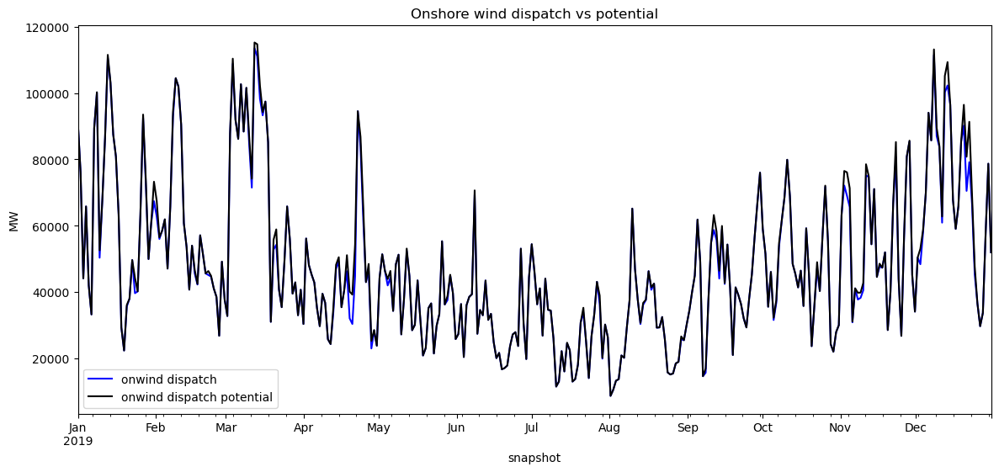

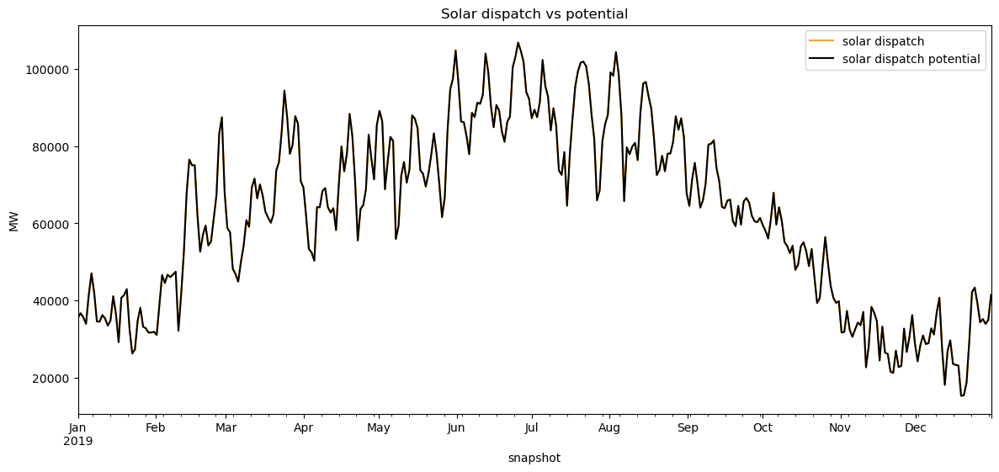

In [241]:
#Graphing the dispatch versus the maximum power output

#offshore wind Wind 
fig, ax = plt.subplots(figsize = (14,6))
grouped_generators['Offwind_total'].plot(color = 'blue', label = 'offshore wind dispatach')
renewable_p_max_timeseries['Offwind_total'].plot(color = 'k', label = 'offshore wind dispatch potential')
plt.ylabel('MW')
plt.title('Offshore wind dispatch vs potential')
plt.legend()
plt.show()
#onshore wind 
fig, ax = plt.subplots(figsize = (14,6))
grouped_generators['onwind'].plot(color = 'blue', label = 'onwind dispatch')
renewable_p_max_timeseries['onwind'].plot(color = 'k', label = 'onwind dispatch potential')
plt.ylabel('MW')
plt.title('Onshore wind dispatch vs potential')
plt.legend()
plt.show()
#Solar
fig, ax = plt.subplots(figsize = (14,6))
grouped_generators['Solar_total'].plot(color = 'orange', label = 'solar dispatch') #for some reason the p_max_pu timeseries starts solar hsat in 2030 and solar rooftop in 2040, so can only change this to solar_total if network_choice is 2040 or 2050
renewable_p_max_timeseries['Solar_total'].plot(color = 'k', label = 'solar dispatch potential')
plt.ylabel('MW')
plt.title("Solar dispatch vs potential")
plt.legend()
plt.show()

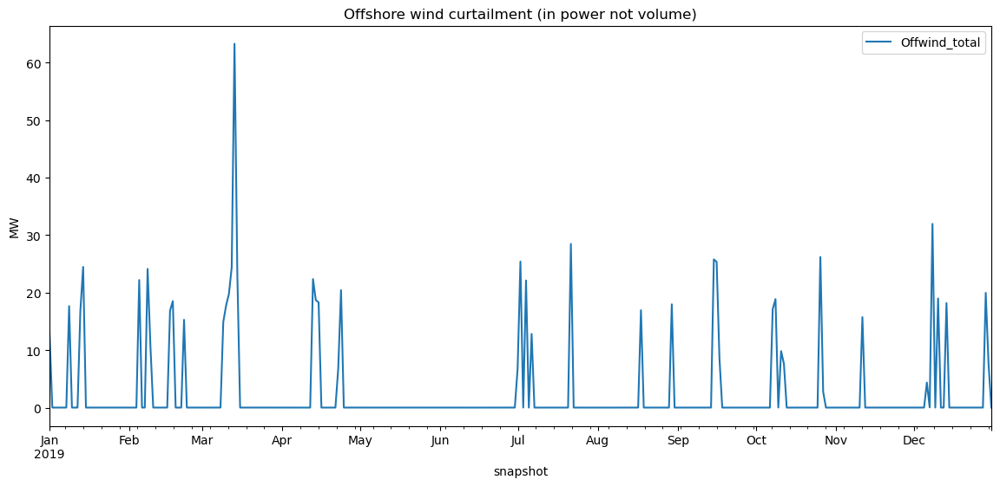

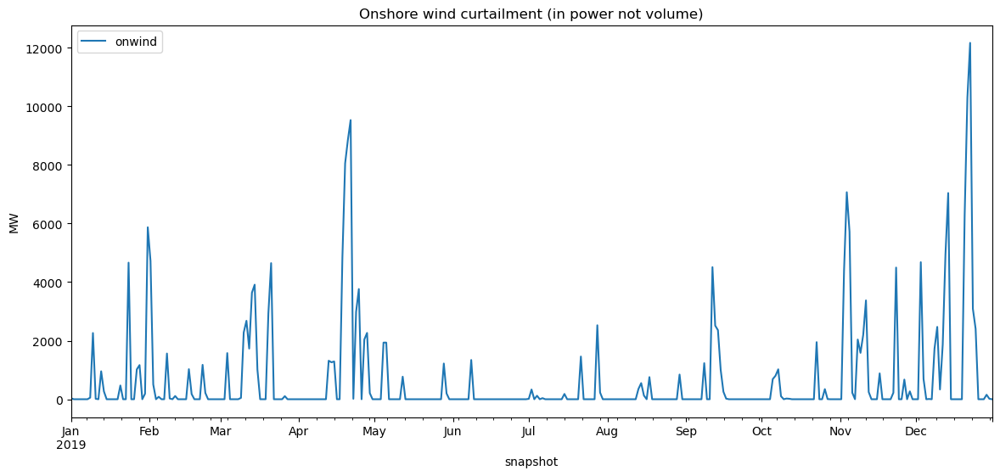

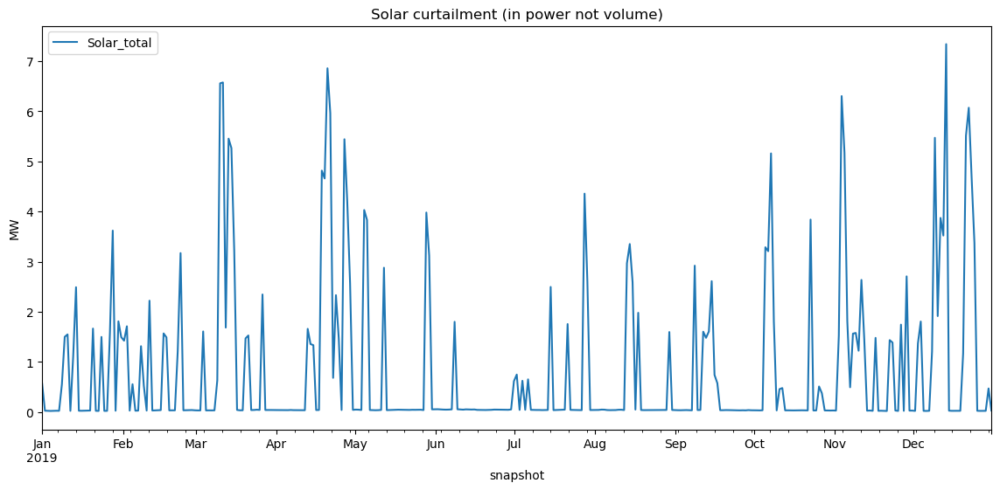

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_83610/4293561204.py:34: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



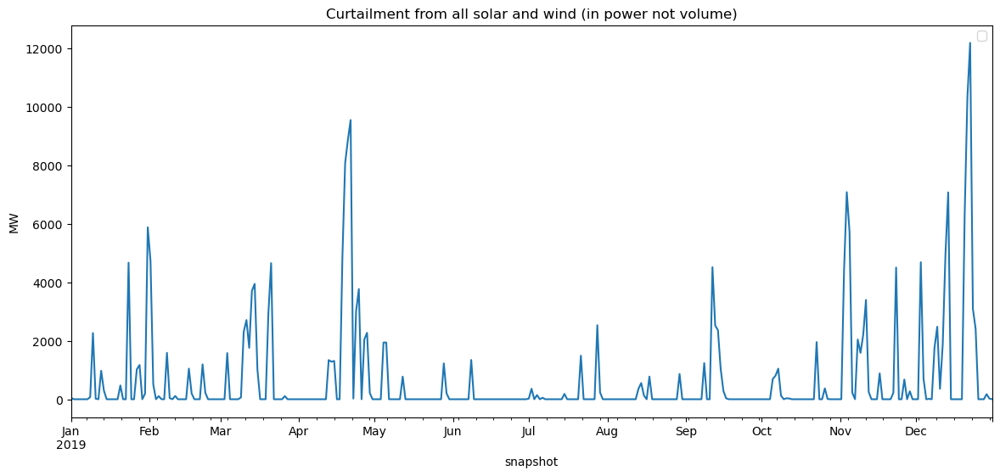

In [245]:
#now creating the graphs of curtailment only-to find times of max curtailment

#offshore wind 
fig, ax = plt.subplots(figsize = (14,6))
curtailment1 = renewable_p_max_timeseries['Offwind_total'] - grouped_generators['Offwind_total']
curtailment1.plot()
plt.ylabel('MW')
plt.title('Offshore wind curtailment (in power not volume)')
plt.legend()
plt.show()
#onshore wind 
fig, ax = plt.subplots(figsize = (14,6))
curtailment2 = renewable_p_max_timeseries['onwind'] - grouped_generators['onwind']
curtailment2.plot()
plt.ylabel('MW')
plt.title('Onshore wind curtailment (in power not volume)')
plt.legend()
plt.show()
#solar 
fig, ax = plt.subplots(figsize = (14,6))
curtailment3 = renewable_p_max_timeseries['Solar_total'] - grouped_generators['Solar_total']
curtailment3.plot()
plt.ylabel('MW')
plt.title('Solar curtailment (in power not volume)')
plt.legend()
plt.show()

#Total of all solar and wind lost power
fig, ax = plt.subplots(figsize = (14,6))
curtailment_total = curtailment3 + curtailment1 + curtailment2
curtailment_total.plot()
plt.ylabel('MW')
plt.title('Curtailment from all solar and wind (in power not volume)')
plt.legend()
plt.show()

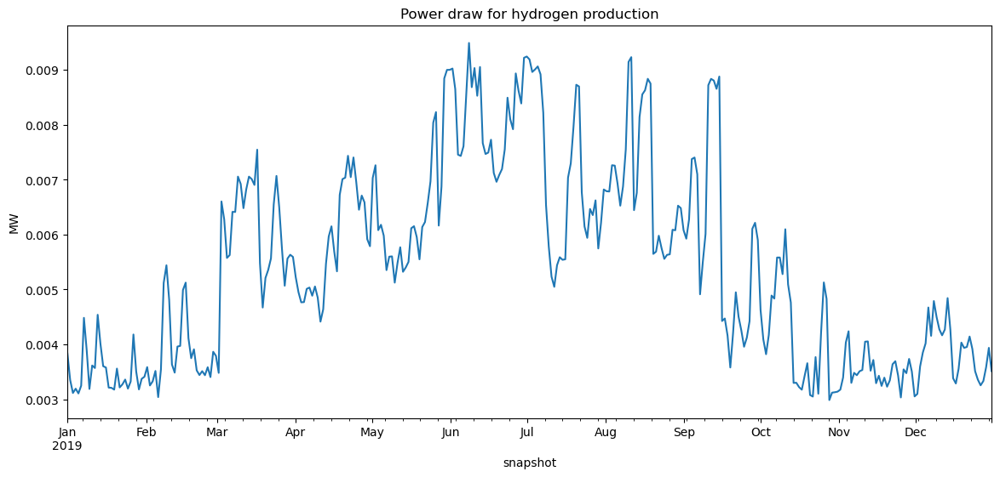

In [272]:
#Hydrogen production
network_choice = Scenario3_2030 
network_choice.links.carrier.unique() #'H2 Electrolysis', 'H2 Fuel Cell','Sabatier', 'SMR CC','SMR',
relevant_links = network_choice.links[network_choice.links.carrier == 'H2 Electrolysis'].index
h2_electrolysis_energy_draw = network_choice.links_t.p0[relevant_links]
fig, ax = plt.subplots(figsize = (14,6))
h2_electrolysis_energy_draw.sum(axis = 1).plot(label = 'power draw for H2 production via Electrolysis') #more corolated with solar?
plt.ylabel('MW')
plt.title('Power draw for hydrogen production')
plt.show()
#not all hydrogen peaks corrolate with curtailment peaks


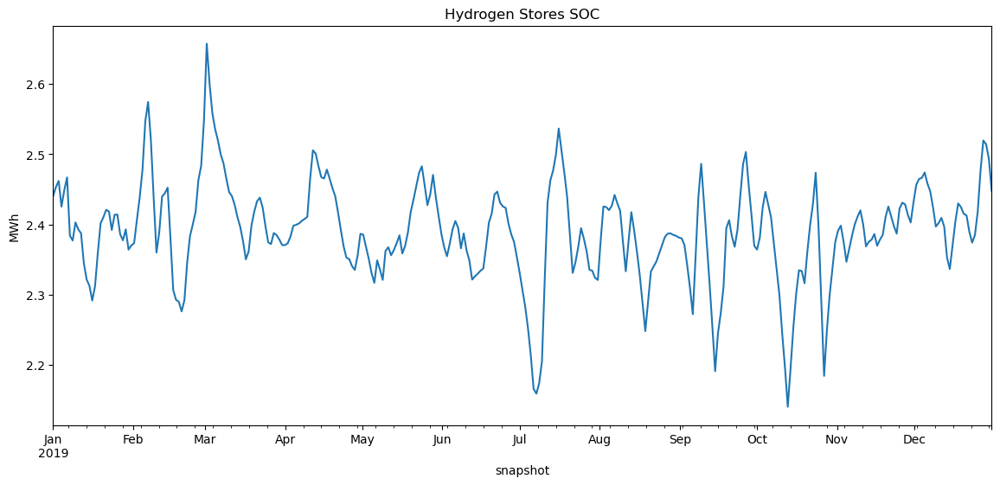

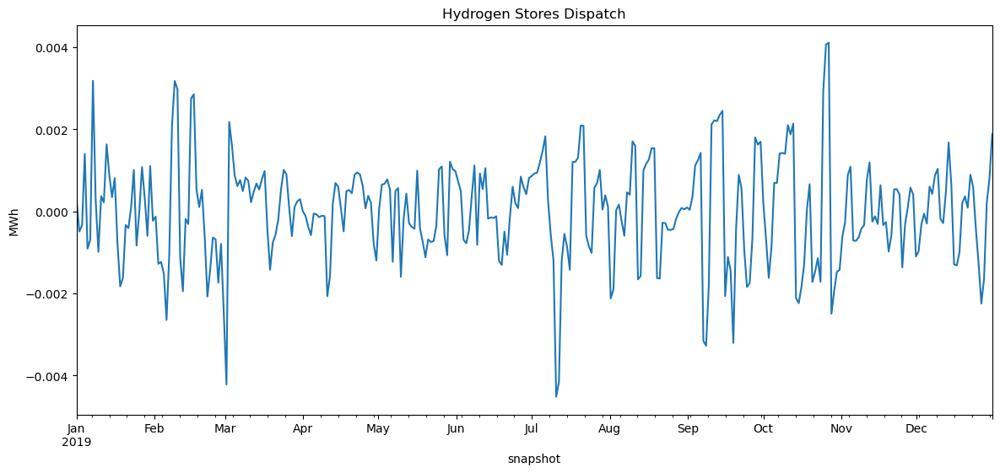

In [275]:
#hydrogen_stores _ soc
network_choice = Scenario3_2030 
relevant_links = network_choice.stores[network_choice.stores.carrier == 'H2 Store'].index
h2_electrolysis_energy_draw = network_choice.stores_t.e[relevant_links]
fig, ax = plt.subplots(figsize = (14,6))
h2_electrolysis_energy_draw.sum(axis = 1).plot(label = 'Hydrogen Store SOC') #more corolated with solar?
plt.ylabel('MWh')
plt.title('Hydrogen Stores SOC')
plt.show()

#hydrogen_stores _ soc
network_choice = Scenario3_2030 
relevant_links = network_choice.stores[network_choice.stores.carrier == 'H2 Store'].index
h2_electrolysis_energy_draw = network_choice.stores_t.p[relevant_links]
fig, ax = plt.subplots(figsize = (14,6))
h2_electrolysis_energy_draw.sum(axis = 1).plot(label = 'Hydrogen Store dispatch') #more corolated with solar?
plt.ylabel('MWh')
plt.title('Hydrogen Stores Dispatch')
plt.show()

In [ ]:
#the amount of hydrogen going into the stores from electrolysis is probably the best indicator of it producing at the excess.
#what fraction of the electrolysis hydrogen is going to stores, OR what percentage of electrolysis is going to hydrogen buses

<Axes: xlabel='snapshot'>

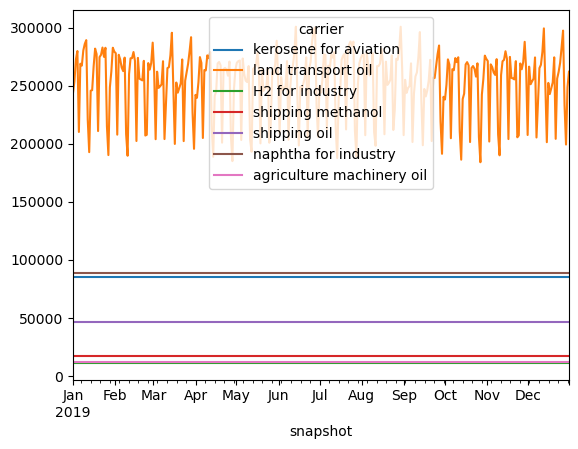

In [283]:
#are the loads that rely on hydrogen constant? 
network_choice.loads.carrier.unique() #'land transport oil', 'H2 for industry', 'shipping methanol', 'shipping oil', 'naphtha for industry',  'agriculture machinery oil',
H2_relevant_loads = ['kerosene for aviation','land transport oil', 'H2 for industry', 'shipping methanol', 'shipping oil', 'naphtha for industry',  'agriculture machinery oil']
grouped_loads = network_choice.loads_t.p.T.groupby(network_choice.loads.carrier).sum()
grouped_loads.loc[H2_relevant_loads].T.plot()

The stores connected to this bus are:   ['EU oil Store']
The incoming links to this bus are from the bus:  ['EU oil primary' 'AL0 0 unsustainable bioliquids'
 'AT0 0 unsustainable bioliquids' 'BA0 0 unsustainable bioliquids'
 'BE0 0 unsustainable bioliquids' 'BG0 0 unsustainable bioliquids'
 'CH0 0 unsustainable bioliquids' 'CZ0 0 unsustainable bioliquids'
 'DE0 0 unsustainable bioliquids' 'DK0 0 unsustainable bioliquids'
 'DK1 0 unsustainable bioliquids' 'EE0 0 unsustainable bioliquids'
 'ES0 0 unsustainable bioliquids' 'ES6 0 unsustainable bioliquids'
 'FI1 0 unsustainable bioliquids' 'FR0 0 unsustainable bioliquids'
 'FR5 0 unsustainable bioliquids' 'GB2 0 unsustainable bioliquids'
 'GB3 0 unsustainable bioliquids' 'GR0 0 unsustainable bioliquids'
 'HR0 0 unsustainable bioliquids' 'HU0 0 unsustainable bioliquids'
 'IE3 0 unsustainable bioliquids' 'IT0 0 unsustainable bioliquids'
 'IT4 0 unsustainable bioliquids' 'LT0 0 unsustainable bioliquids'
 'LU0 0 unsustainable bioliquids' 'LV0

## Scenario 3.1

In [288]:
#75% reduction in capacity from ulimited scenario in the year 2030 (that's our delay is that can expand only after 2030)
Scenario3_1_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3.1_75pct_reductions_in2030/networks/base_s_39___2020.nc')
Scenario3_1_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3.1_75pct_reductions_in2030/networks/base_s_39___2030.nc')
Scenario3_1_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3.1_75pct_reductions_in2030/networks/base_s_39___2040.nc')
Scenario3_1_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Scenario3.1_75pct_reductions_in2030/networks/base_s_39___2050.nc')
Scneario3_1_list = [Scenario3_1_2020, Scenario3_1_2030, Scenario3_1_2040, Scenario3_1_2050]

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [289]:
co2_constraint_satisfaction(Scneario3_1_list)

The CO2 constraint remains satisfied. The value of the CO2 constraint is 3.314820e+09, and the value of the CO2 store at the last snapshot is 3.314820e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.071763e+09, and the value of the CO2 store at the last snapshot is 2.071763e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 4.603917e+08, and the value of the CO2 store at the last snapshot is 4.603917e+08 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.301959e+08, and the value of the CO2 store at the last snapshot is 2.301959e+08 tons of CO2


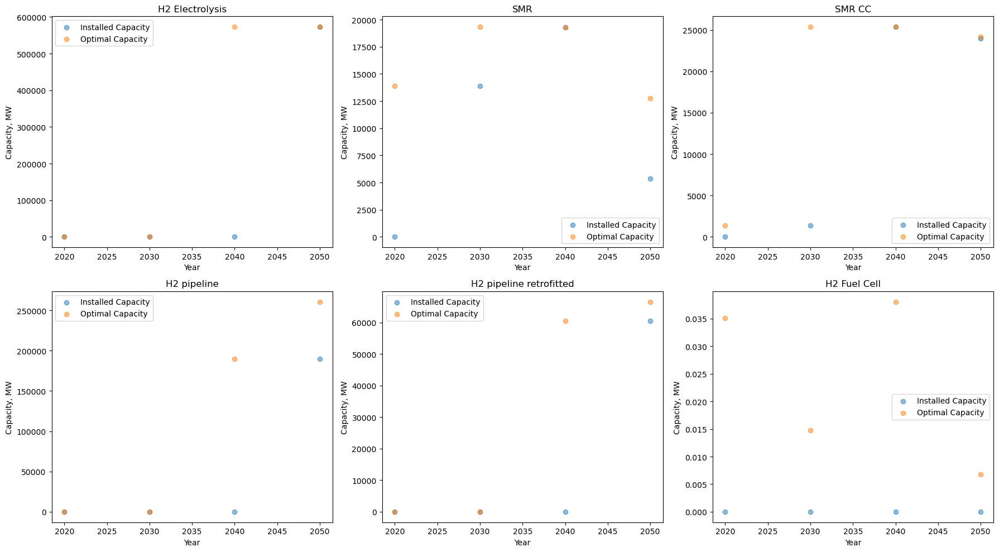

In [411]:
hydrogen_capacity_graphs(Scenario3_list)

In [322]:
Scenario3_list

[Unnamed PyPSA Network
 ---------------------
 Components:
  - Bus: 973
  - Carrier: 110
  - Generator: 1003
  - GlobalConstraint: 10
  - Line: 71
  - Link: 3828
  - Load: 659
  - StorageUnit: 56
  - Store: 351
 Snapshots: 337,
 Unnamed PyPSA Network
 ---------------------
 Components:
  - Bus: 1023
  - Carrier: 113
  - Generator: 994
  - GlobalConstraint: 10
  - Line: 71
  - Link: 3774
  - Load: 704
  - StorageUnit: 56
  - Store: 424
 Snapshots: 337,
 Unnamed PyPSA Network
 ---------------------
 Components:
  - Bus: 984
  - Carrier: 110
  - Generator: 798
  - GlobalConstraint: 9
  - Line: 71
  - Link: 3352
  - Load: 704
  - StorageUnit: 56
  - Store: 453
 Snapshots: 337,
 Unnamed PyPSA Network
 ---------------------
 Components:
  - Bus: 905
  - Carrier: 107
  - Generator: 736
  - GlobalConstraint: 8
  - Line: 71
  - Link: 3644
  - Load: 625
  - StorageUnit: 56
  - Store: 501
 Snapshots: 337]

### EV battery usage? 

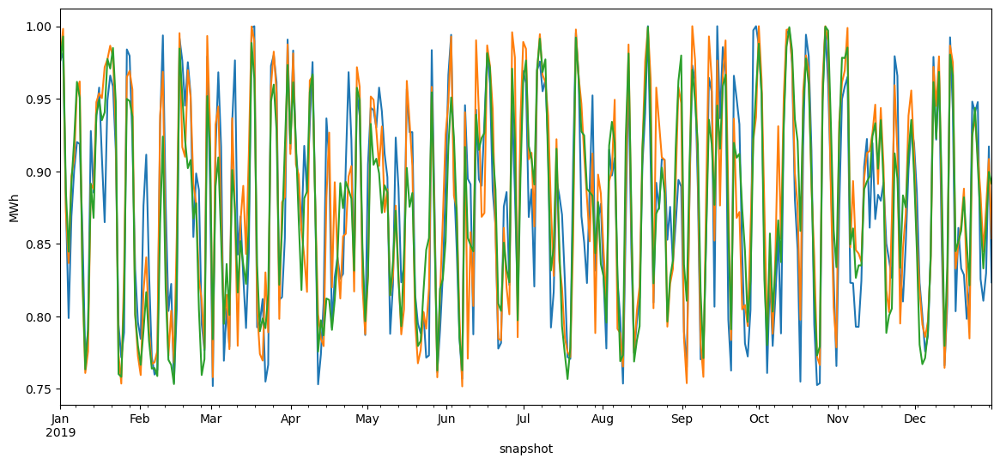

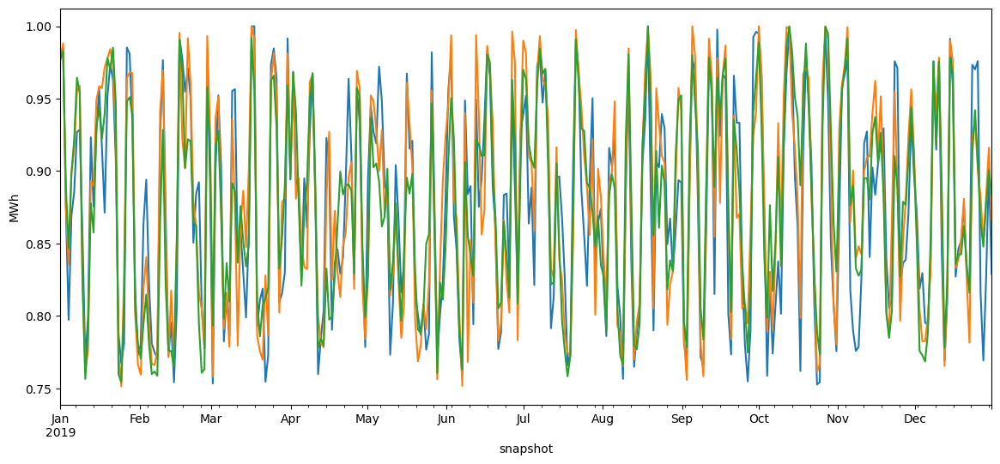

In [385]:
 #'BEV charger', 'V2G', #'EV battery
carrier_type = 'Link'
tech = 'BEV charger' 
installed_cap = []
optimal_cap = [] 
fig, ax = plt.subplots(figsize = (14,6))
for net in Scenario3_list:
    if 'EV battery' in net.stores.carrier.unique():
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        EV_stores_soc.plot()
        plt.ylabel('MWh')

fig, ax = plt.subplots(figsize = (14,6))
for net in Scneario3_1_list:
    if 'EV battery' in net.stores.carrier.unique():
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        EV_stores_soc.plot()
        plt.ylabel('MWh')


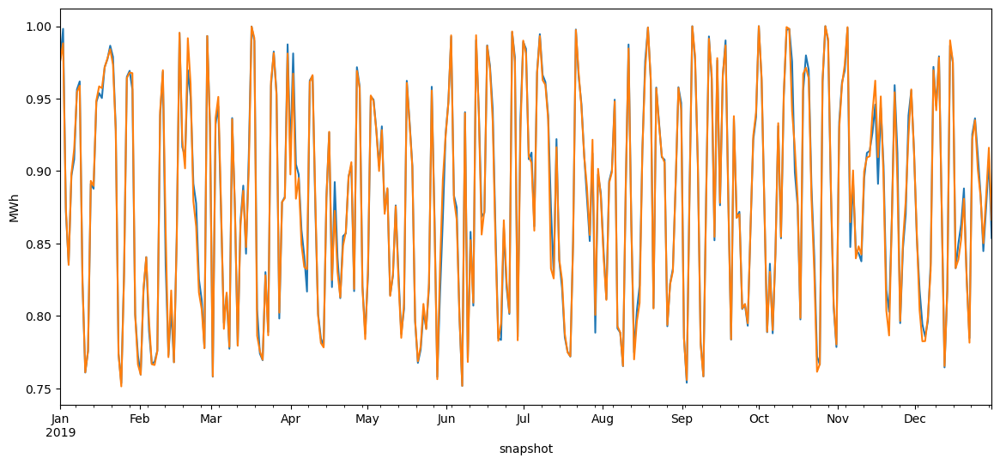

In [389]:
fig, ax = plt.subplots(figsize = (14,6))
for net in [Scenario3_2040, Scenario3_1_2040]:
    if 'EV battery' in net.stores.carrier.unique():
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        EV_stores_soc.plot()
        plt.ylabel('MWh')


In [380]:
Scenario3_2030.stores.loc[(Scenario3_2030.stores[Scenario3_2030.stores.carrier == 'EV battery'].index)]['e_nom'].sum()

3942057.1083456823

In [394]:
Scenario3_1_1_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_1_1_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_1_1_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_1_1_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


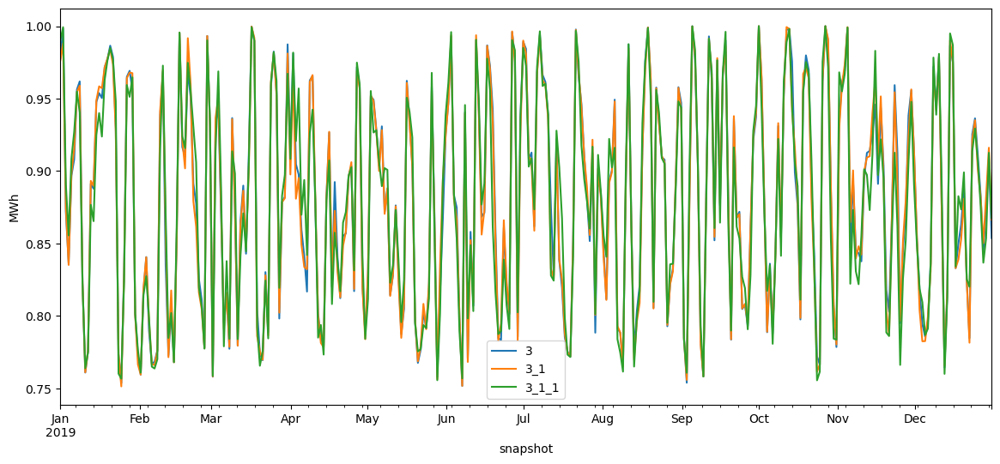

In [404]:
fig, ax = plt.subplots(figsize = (14,6))
network_list = [Scenario3_2040, Scenario3_1_2040, Scenario3_1_1_2040]
i = 0
for net in network_list:
    if 'EV battery' in net.stores.carrier.unique():
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        year_list = ['3', '3_1', '3_1_1']
        EV_stores_soc.plot(label =  year_list[i])
        i += 1
        plt.ylabel('MWh')
plt.legend()

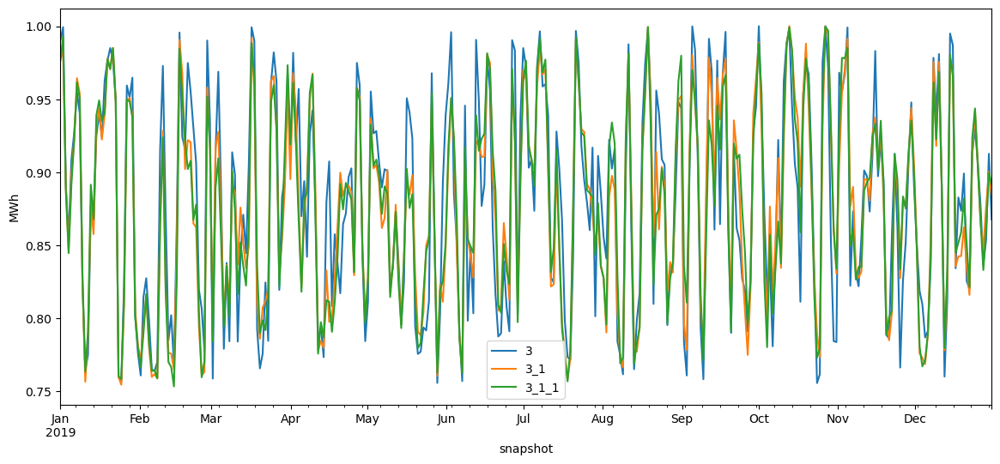

In [408]:
fig, ax = plt.subplots(figsize = (14,6))
i = 0
for net in [Scenario3_1_1_2050, Scenario3_1_2050, Scenario3_2050]:
    if 'EV battery' in net.stores.carrier.unique():
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        year_list = ['3', '3_1', '3_1_1']
        EV_stores_soc.plot(label =  year_list[i])
        i += 1
        plt.ylabel('MWh')
plt.legend()

In [413]:
#how are we supposed to know if the amount change in curtailment is due to the change in the system or the increase in the amount used to charge BEVs??
objective_list = []
for net in Scenario3_list:
    objective_list.append(f"{net.objective:e}")
objective_list

['5.416206e+11', '4.438620e+11', '5.637692e+11', '6.979901e+10']

### July 11

Right now trying to identify hydrogen minimums, I have one hydrogen unlimited scneario, and then one where I doubled the price (or quadrupled, point is -- raised significantly) of the hydrogen assets to see how minimized they could be in a no-carbon sequestion system (still had to use FT)

In [11]:
#Hydrogen unlimited, new config file [July 9]
Scenario3_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_unlimited/networks/base_s_39___2020.nc')
Scenario3_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_unlimited/networks/base_s_39___2030.nc')
Scenario3_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_unlimited/networks/base_s_39___2040.nc')
Scenario3_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_unlimited/networks/base_s_39___2050.nc')
Scenario3_list = [Scenario3_2020, Scenario3_2030, Scenario3_2040, Scenario3_2050]


FileNotFoundError: [Errno 2] No such file or directory: '/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_unlimited/networks/base_s_39___2020.nc'

In [ ]:
Scenario3_highprice_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_high_pricepoint/networks/base_s_39___2020.nc')
Scenario3_highprice_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_high_pricepoint/networks/base_s_39___2030.nc')
Scenario3_highprice_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_high_pricepoint/networks/base_s_39___2040.nc')
Scenario3_highprice_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/Result_files/Hydrogen_July9/Hydrogen_high_pricepoint/networks/base_s_39___2050.nc')
Scenario3_highprice_list = [Scenario3_highprice_2020, Scenario3_highprice_2030, Scenario3_highprice_2040, Scenario3_highprice_2050]

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [ ]:
Scenario3_ultrahighprice_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_ultrahighprice_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_ultrahighprice_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_ultrahighprice_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')
Scenario3_ulrahighprice_list = [Scenario3_ultrahighprice_2020, Scenario3_ultrahighprice_2030, Scenario3_ultrahighprice_2040, Scenario3_ultrahighprice_2050]

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [ ]:
  for i, tech in enumerate(hydrogen_tech_tuple_list):
        carrier_type, technology = tech
        mean_value = []
        mean_value_optimal = []
        for net in networks1:
            if technology in net.statistics().loc[carrier_type].index:
                stats = net.statistics().loc[carrier_type, technology]
                mean_value.append(stats['Installed Capacity'])
                mean_value_optimal.append(stats['Optimal Capacity'])
            else:
                mean_value.append(0)
                mean_value_optimal.append(0)
    
        ax = axes[i]
        ax.scatter([2020, 2030, 2040, 2050], mean_value, label='Installed Capacity', alpha=0.5)
        ax.scatter([2020, 2030, 2040, 2050], mean_value_optimal, label='Optimal Capacity', alpha=0.5)
        ax.set_title(f'{technology}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Capacity, MW')
        ax.legend()

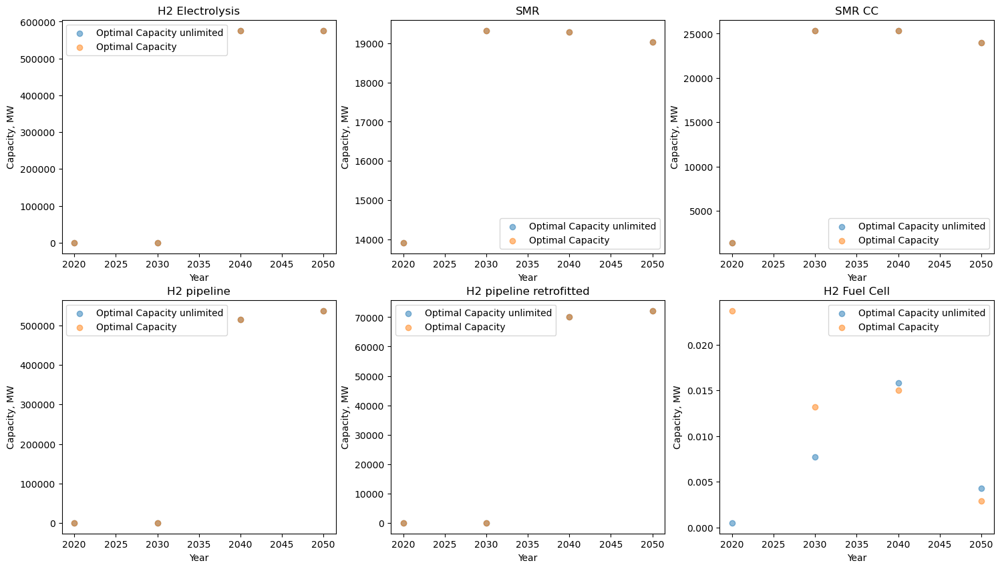

In [ ]:
hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
hydrogen_tech_tuple_list = [('Link', tech) for tech in hydrogen_tech_list]


fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns
axes = axes.flatten()  # make it easier to iterate


for i, tech in enumerate(hydrogen_tech_tuple_list):
    carrier_type, technology = tech
    mean_value_unlimited = []
    mean_value_optimal_unlimited = []
    installed_value_highprice = []
    optimal_value_highprice = []
    for net in Scenario3_list:
        if technology in net.statistics().loc[carrier_type].index:
            stats = net.statistics().loc[carrier_type, technology]
            mean_value_unlimited.append(stats['Installed Capacity'])
            mean_value_optimal_unlimited.append(stats['Optimal Capacity'])
        else:
            mean_value.append(0)
            mean_value_optimal.append(0)

    stats = []
    for net in Scenario3_highprice_list:
            stats = net.statistics().loc[carrier_type, technology]
            installed_value_highprice.append(stats['Installed Capacity'])
            optimal_value_highprice.append(stats['Optimal Capacity'])

    ax = axes[i]
    ax.scatter([2020, 2030, 2040, 2050], mean_value_optimal_unlimited, label='Optimal Capacity unlimited', alpha=0.5)
    ax.scatter([2020, 2030, 2040, 2050], optimal_value_highprice, label='Optimal Capacity', alpha=0.5)
    ax.set_title(f'{technology}')
    ax.set_xlabel('Year')
    ax.set_ylabel('Capacity, MW')
    ax.legend()
    

In [ ]:
optimal_value_highprice

[0.02169, 0.01224, 576229.46427, 576229.41649]

In [ ]:
mean_value_optimal_unlimited

[0.00037, 0.00587, 576216.88352, 576216.81494]

In [ ]:
Scenario3_2030.statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity              0.005870
Installed Capacity            0.000000
Supply                       14.175490
Withdrawal                   20.997880
Energy Balance               -6.822390
Transmission                  0.000000
Capacity Factor               0.408859
Curtailment                   0.000000
Capital Expenditure        1107.323710
Operational Expenditure       0.208920
Revenue                      -1.929600
Market Value                 -0.135802
Name: (Link, H2 Electrolysis), dtype: float64

In [ ]:
Scenario3_highprice_2050.statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.762097e+05
Installed Capacity         5.762097e+05
Supply                     2.278567e+09
Withdrawal                 3.256032e+09
Energy Balance            -9.774644e+08
Transmission               0.000000e+00
Capacity Factor            6.450657e-01
Curtailment                0.000000e+00
Capital Expenditure        8.699189e+10
Operational Expenditure    6.711472e+07
Revenue                    9.541805e+09
Market Value               4.187634e+00
Name: (Link, H2 Electrolysis), dtype: float64

In [ ]:
Scenario3_ultrahighprice_2030.statistics().loc[('Link', 'H2 Electrolysis')] #it's actually used more? what?

Optimal Capacity              0.012240
Installed Capacity            0.000000
Supply                       33.866470
Withdrawal                   50.155270
Energy Balance              -16.288790
Transmission                  0.000000
Capacity Factor               0.468137
Curtailment                   0.000000
Capital Expenditure        2309.244790
Operational Expenditure       0.494680
Revenue                       3.653900
Market Value                  0.108527
Name: (Link, H2 Electrolysis), dtype: float64

In [ ]:
#in fact it was built earlier?? 

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1264: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/miniconda3/envs/pypsa-eur/lib/python3.12/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



(<matplotlib.collections.PatchCollection at 0x3ae116120>,
 <matplotlib.collections.LineCollection at 0x3ae149e80>)

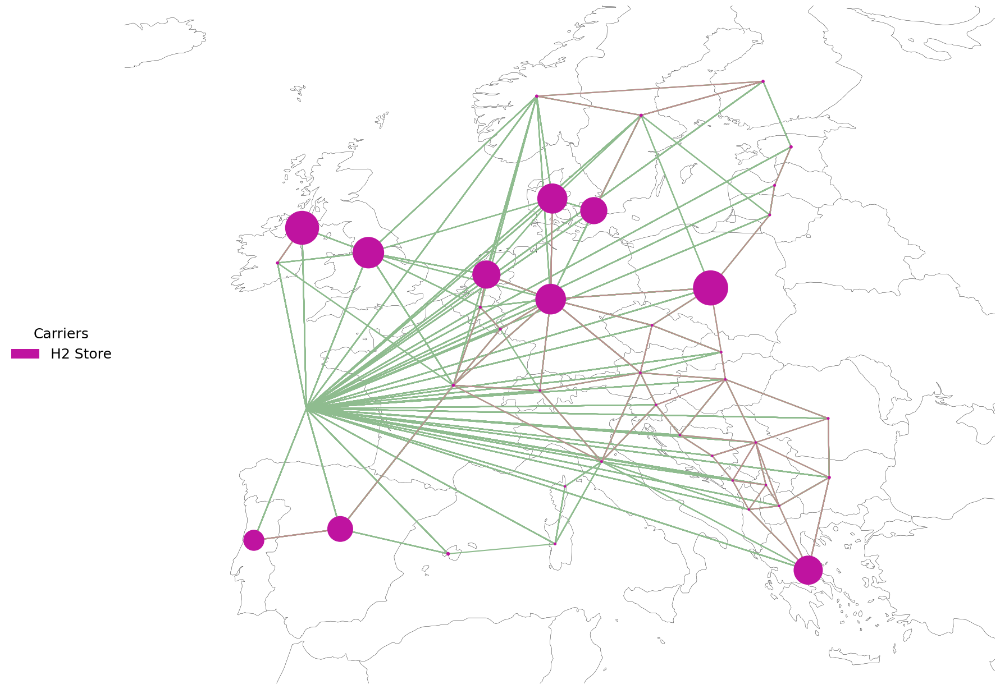

In [ ]:
af.plot_network_test(Scenario3_2030, 'H2')

In [ ]:
print(f"{Scenario3_2050.objective:e}")
print(f"{Scenario3_highprice_2050.objective:e}")
print(f"{Scenario3_ultrahighprice_2050.objective:e}")
#how in the world are they all the same if they also have the same amount of hydrogen? is this thing broken?

7.318688e+10
7.319004e+10
7.319006e+10


In [ ]:
Scenario3_trial_2020.statistics().loc['Link']

,Optimal Capacity,Installed Capacity,Supply,Withdrawal,Energy Balance,Transmission,Capacity Factor,Curtailment,Capital Expenditure,Operational Expenditure,Revenue,Market Value
Combined-Cycle Gas,368944.97981,367959.13840,2.383611e+06,3.144606e+06,-7.609946e+05,0.000000e+00,0.000973,0.0,2.291610e+10,8.228208e+06,8.227439e+06,3.451670
DAC,0.00033,0.00000,2.552400e+00,7.529590e+00,-4.977190e+00,0.000000e+00,0.484848,0.0,5.982748e+02,1.413000e-02,-5.184852e+01,-20.413793
DC,106366.66773,54040.00000,2.847957e+08,2.942445e+08,-9.448782e+06,2.942445e+08,0.315790,0.0,2.902058e+09,2.929598e+06,1.489966e+09,5.231701
Fischer-Tropsch,0.00352,0.00000,1.899599e+01,2.754996e+01,-8.553970e+00,0.000000e+00,0.741477,0.0,2.868172e+02,1.031515e+02,-4.821900e+01,-2.534562
H2 Electrolysis,0.00141,0.00000,3.568910e+00,5.643160e+00,-2.074250e+00,0.000000e+00,0.453901,0.0,3.538377e+02,5.677000e-02,-2.679373e+01,-7.463415
...,...,...,...,...,...,...,...,...,...,...,...,...
urban central solid biomass CHP,62915.78183,43146.06909,4.748588e+08,4.472508e+08,2.760799e+07,0.000000e+00,0.811498,0.0,7.256269e+09,2.182326e+09,6.656362e+09,14.017562
urban central solid biomass CHP CC,0.00142,0.00000,1.174100e+01,1.134249e+01,3.985000e-01,0.000000e+00,0.683099,0.0,4.524831e+02,4.161173e+01,2.004127e+02,17.074627
urban central water tanks charger,3685.13250,0.00000,1.286665e+06,1.429627e+06,-1.429627e+05,0.000000e+00,0.044286,0.0,0.000000e+00,1.457191e+04,1.444883e+04,0.011230
urban central water tanks discharger,3881.27557,0.00000,1.140083e+06,1.266758e+06,-1.266758e+05,0.000000e+00,0.037258,0.0,0.000000e+00,1.269450e+04,1.256383e+04,0.011020


In [ ]:
Scenario3_trial_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')
Scenario3_trial_list = [Scenario3_trial_2020, Scenario3_trial_2030, Scenario3_trial_2040, Scenario3_trial_2020]

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [ ]:
co2_constraint_satisfaction(Scenario3_trial_list)

The CO2 constraint remains satisfied. The value of the CO2 constraint is 3.314820e+09, and the value of the CO2 store at the last snapshot is 3.314820e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.071763e+09, and the value of the CO2 store at the last snapshot is 2.071763e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 4.603917e+08, and the value of the CO2 store at the last snapshot is 4.603917e+08 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 3.314820e+09, and the value of the CO2 store at the last snapshot is 3.314820e+09 tons of CO2


/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1264: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/miniconda3/envs/pypsa-eur/lib/python3.12/site-packages/cartopy/mpl/feature_artist.py:144: UserWarning:

facecolor will have no effect as it has been defined as "never".



(<matplotlib.collections.PatchCollection at 0x3adccb980>,
 <matplotlib.collections.LineCollection at 0x3c0f45430>)

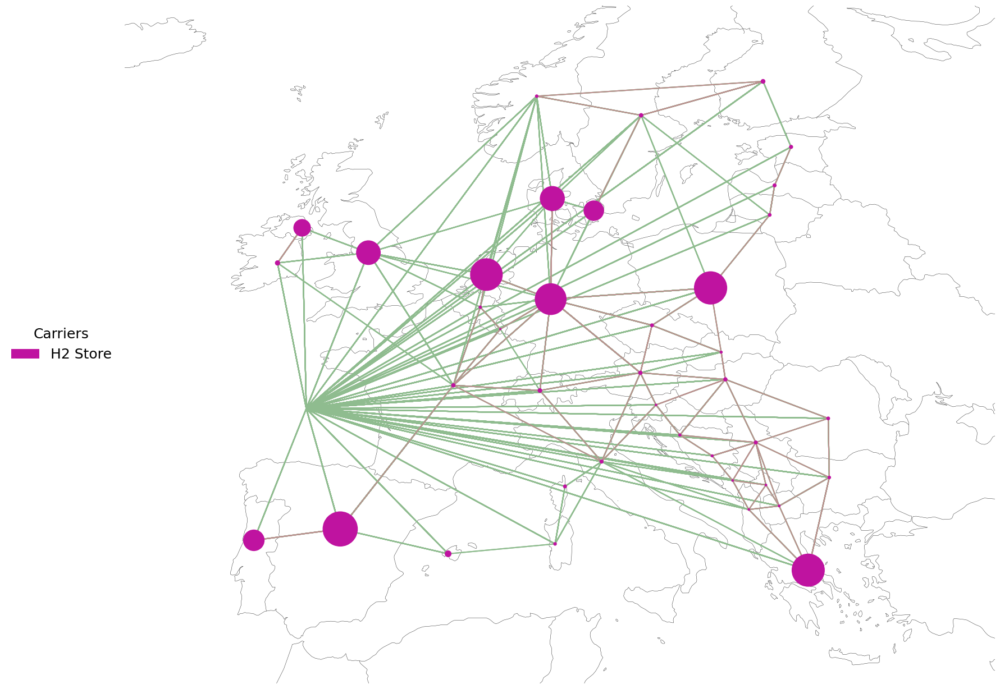

In [ ]:
af.plot_network_test(Scenario3_trial_2030, 'H2')

In [ ]:
#is it possible thatit was just producing hydrogen a different way? 

AC
DC
nuclear
geothermal
offwind-dc
solar
solar-hsat
hydro
offwind-float
onwind
offwind-ac
PHS
ror

lignite
coal
oil
uranium
none
co2
co2 stored
co2 sequestered
gas
H2
battery
EV battery
urban central heat
urban central water tanks
urban central solar thermal
biogas
solid biomass
methanol
home battery
rural heat
rural solar thermal
rural water tanks
urban decentral heat
urban decentral solar thermal
urban decentral water tanks
industry methanol
gas for industry
kerosene for aviation
process emissions
solid biomass for industry
shipping methanol
agriculture machinery oil
low voltage
oil primary
naphtha for industry
electricity
H2 for industry
agriculture electricity
low-temperature heat for industry
land transport EV
industry electricity
agriculture heat
H2 Store
gas pipeline new
urban decentral biomass boiler
urban central gas boiler
methanolisation
Fischer-Tropsch
H2 turbine
biomass-to-methanol
rural gas boiler
rural ground heat pump
SMR
process emissions CC
biogas to gas
urban centra

In [ ]:
Scenario3_trial_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')
Scenario3_trial_list = [Scenario3_trial_2020, Scenario3_trial_2030, Scenario3_trial_2040, Scenario3_trial_2050]

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [ ]:
Scenario3_trial_list[3].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.780426e+05
Installed Capacity         5.780426e+05
Supply                     2.284907e+09
Withdrawal                 3.265448e+09
Energy Balance            -9.805413e+08
Transmission               0.000000e+00
Capacity Factor            6.448799e-01
Curtailment                0.000000e+00
Capital Expenditure        8.726861e+10
Operational Expenditure    6.714734e+07
Revenue                    1.007079e+10
Market Value               4.407526e+00
Name: (Link, H2 Electrolysis), dtype: float64

Found the work results from last week again. Had to copy a configuration file from July 3rd (sector_europe_constraint one -- one that what from early july, and copy the entire pypsa folder from the "PyPSA with constraints[June 13]") folder: 
 

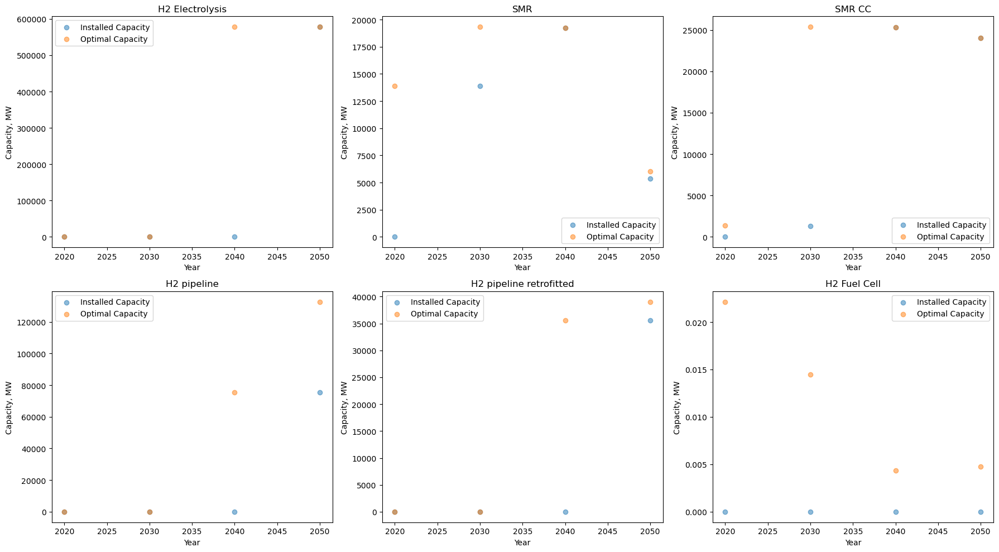

In [ ]:
hydrogen_capacity_graphs(Scenario3_trial_list)

Going to purge the pypsa-eur folder and reload this exact document to see if the change was caused by and update to the pypsa framework, before I systematically reintegrate all the changes to the configuration file that was made last week (spatial resolution of biomass, co2, and oil demand, changing some of the confiuration flags to looks like Lukas's and Bobby's (see spreadsheet on google drive and/or personal notebook)).

In [ ]:
Scenario3_trial_2020_2 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_2 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_2 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_2 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')
Scenario3_trial_list_2 = [Scenario3_trial_2020_2, Scenario3_trial_2030_2, Scenario3_trial_2040_2, Scenario3_trial_2050_2]

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [20]:
Scenario3_trial_list_2 = [Scenario3_trial_2020_2, Scenario3_trial_2030_2, Scenario3_trial_2040_2, Scenario3_trial_2050_2]

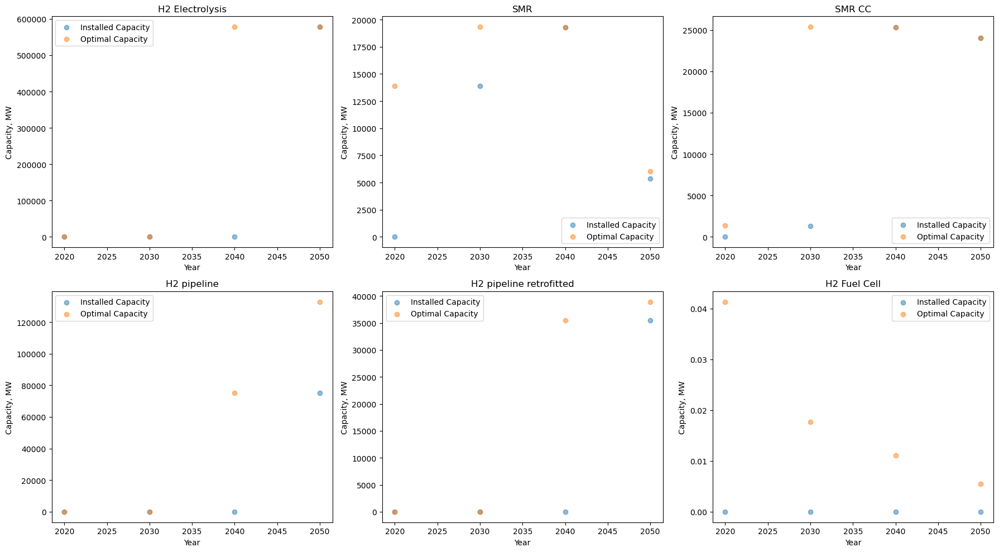

In [21]:
hydrogen_capacity_graphs(Scenario3_trial_list_2)

OK fantastic, looks like it is not about the update, but now I need to change one thing at a time until I get back to the hydrogen scenario

(1) just changed the groupings to go past 2019 in grouping_years_power. I included  2020, 2022, 2025, 2027, 2030] to the end of the default list (that went until 2019)

In [ ]:
Scenario3_trial_2020_3 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_3 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_3 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_3 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [22]:
Scenario3_trial_list_3 = [Scenario3_trial_2020_3, Scenario3_trial_2030_3, Scenario3_trial_2040_3, Scenario3_trial_2050_3]

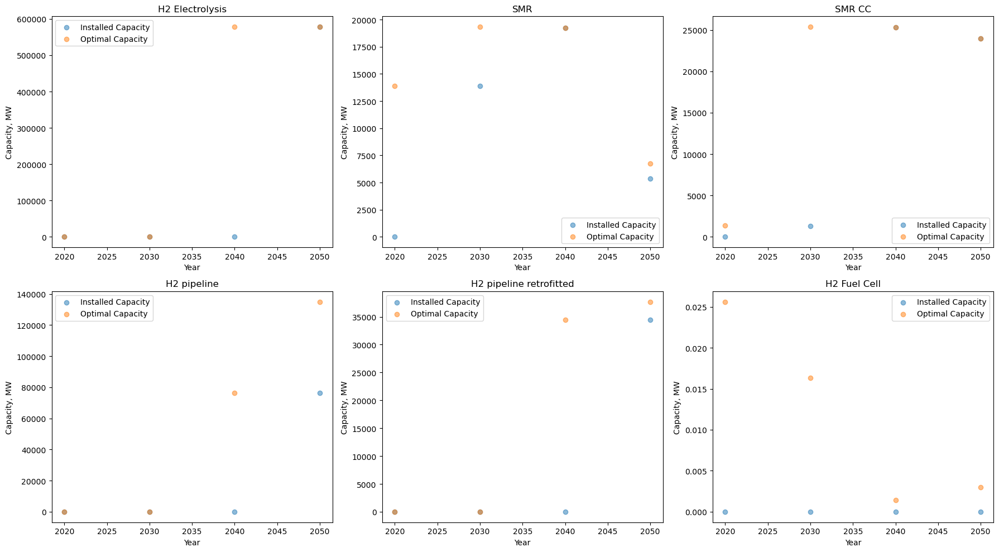

In [23]:
hydrogen_capacity_graphs(Scenario3_trial_list_3)

In [19]:
Sankey_biomass_hydrogen(Scenario3_trial_2050_3)

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:25: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:70: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



Now I'm going to add in co2 spatial, biomass spatial, and regional oil demand (setting them all to true)

In [24]:
Scenario3_trial_2020_4 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_4 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_4 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_4 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [25]:
Scenario3_trial_list_4 = [Scenario3_trial_2020_4, Scenario3_trial_2030_4, Scenario3_trial_2040_4, Scenario3_trial_2050_4]

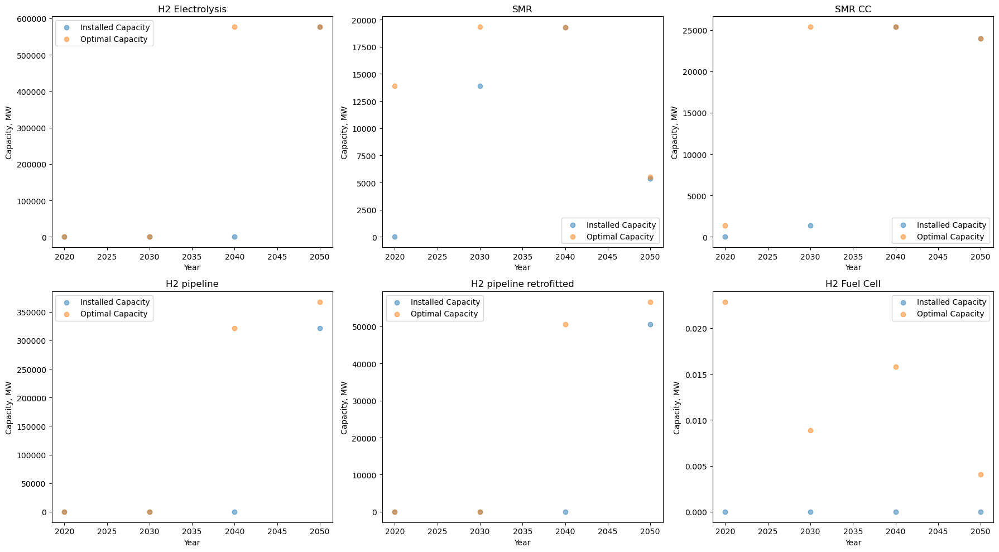

In [26]:
hydrogen_capacity_graphs(Scenario3_trial_list_4)

Great this didn't cause any problems, now I'm going to instill the other changes that I had made to the hydrogen file in the sector section one by one, to see which (if anything) had caused my probelms across monday and yesterday where no hydrogen was produced at all. 

These changes were motivated by looking at Bobby's co2 and hydrogen paper, as well as the CO2 and hyddrogen networks paper realesed by T. Brown et al. 

First, I am going to turn on biomass_to_methanol and biomass_to_methanol_cc

When biomass_to_methanol is turned on, co2_spatial needs to be set to false?? In bobby's work biomass to methanol is set to false. What is below is that, but in future I am going to keep the co2_spatial flag and remove biomass_to_methanol because that is more comparable to both Bobby's and T/Brown's paper (might want to change later though)

In [27]:
Scenario3_trial_2020_5 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_5 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_5 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_5 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [28]:
Scenario3_trial_list_5 = [Scenario3_trial_2020_5, Scenario3_trial_2030_5, Scenario3_trial_2040_5, Scenario3_trial_2050_5]

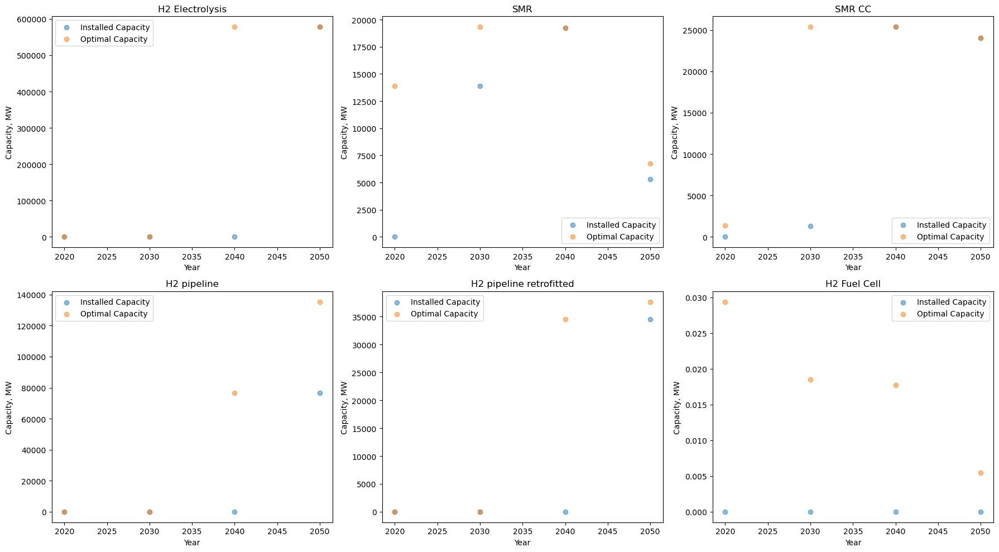

In [29]:
hydrogen_capacity_graphs(Scenario3_trial_list_5)

Now I'm turning back on CO2 spatial, turning off biomass_to_methanol, and turning on methanation. Direct air capture is still turned off, as it co2 networks

In [30]:
Scenario3_trial_2020_6 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_6 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_6= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_6 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [31]:
Scenario3_trial_list_6 = [Scenario3_trial_2020_6, Scenario3_trial_2030_6, Scenario3_trial_2040_6, Scenario3_trial_2050_6]

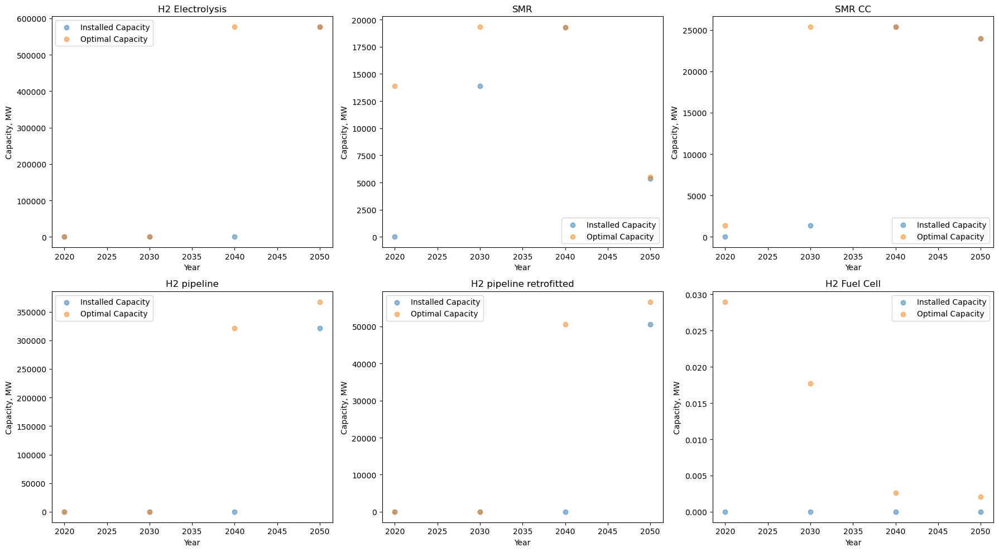

In [32]:
hydrogen_capacity_graphs(Scenario3_trial_list_6)

So now the spatial aspect (biomass spatial, co2 spatiall, and regionally resolved oil demand) is turned on, and methanation is also turned on
Now I am also going to turn on direct air capture. 
Also turned hydrogen turbine to be false 

In [33]:
Scenario3_trial_2020_7 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_7 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_7= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_7 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [34]:
Scenario3_trial_list_7 = [Scenario3_trial_2020_7, Scenario3_trial_2030_7, Scenario3_trial_2040_7, Scenario3_trial_2050_7]

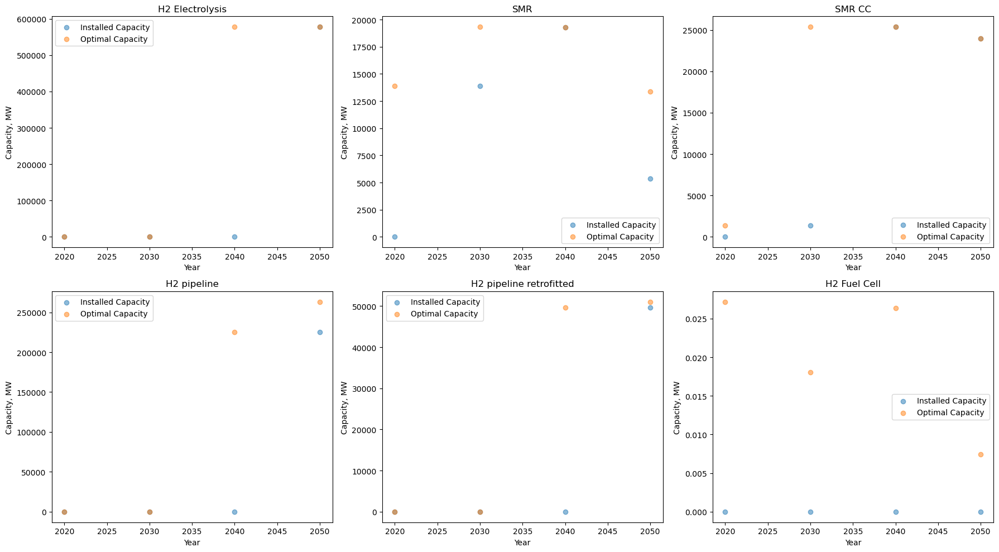

In [35]:
hydrogen_capacity_graphs(Scenario3_trial_list_7)

In [37]:
Sankey_biomass_hydrogen(Scenario3_trial_2040_7)

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:25: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:70: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1264: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1277: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1278: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Deskto

(<matplotlib.collections.PatchCollection at 0x3a58c1fd0>,
 <matplotlib.collections.LineCollection at 0x3acdab6e0>)

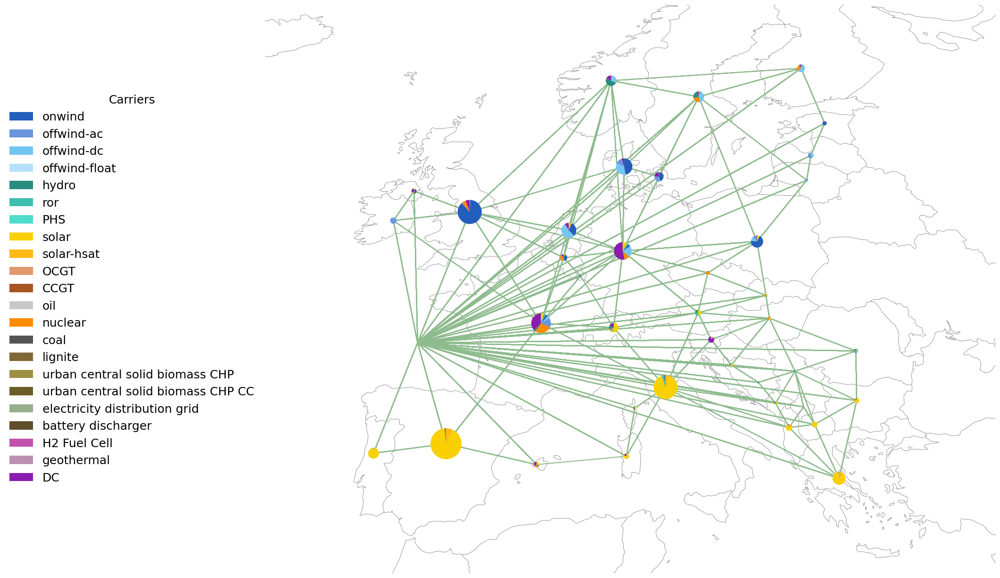

In [43]:
af.plot_network_test(Scenario3_trial_2050_7, 'electric')

Do I enable regional co2 sequestration potential? I mean shouldn't matter right now because nothing is sequestered, but it might be relevant later. 

For the eigth version, specificaly including a lot of BEV and biomass details (as in, under biomass, and like bev_avail_mean

In [44]:
Scenario3_trial_2020_8 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_8 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_8= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_8 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [45]:
Scenario3_trial_list_8 = [Scenario3_trial_2020_8, Scenario3_trial_2030_8, Scenario3_trial_2040_8, Scenario3_trial_2050_8]


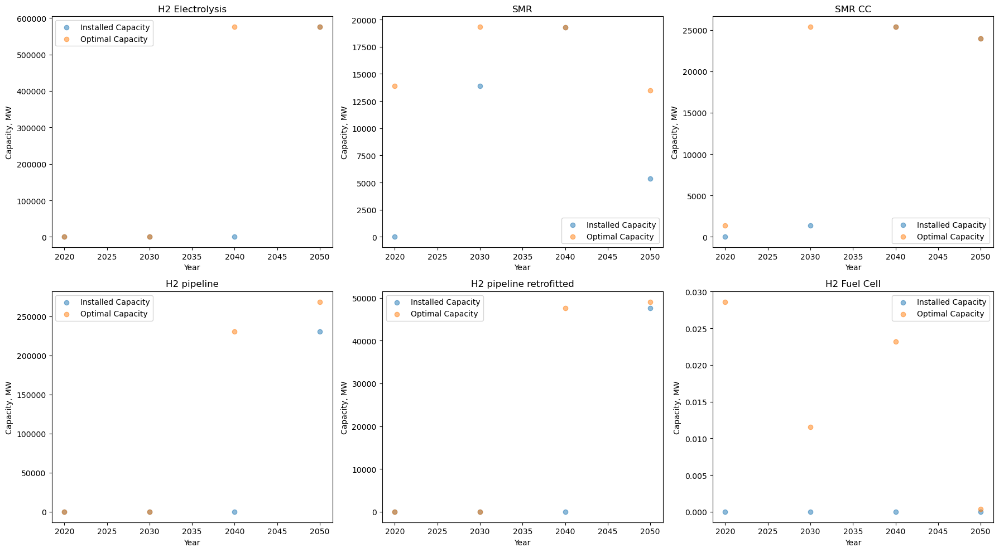

In [46]:
hydrogen_capacity_graphs(Scenario3_trial_list_8)

Why do some of the dots not match up perfectly? For the pipeline, SMR, pipeline retrofitted, and the fuel cell.... why is that? 

In [49]:
co2_constraint_satisfaction(Scenario3_trial_list_8)

The CO2 constraint remains satisfied. The value of the CO2 constraint is 3.314820e+09, and the value of the CO2 store at the last snapshot is 3.314820e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.071763e+09, and the value of the CO2 store at the last snapshot is 2.071763e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 4.603917e+08, and the value of the CO2 store at the last snapshot is 4.603917e+08 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.301959e+08, and the value of the CO2 store at the last snapshot is 2.301959e+08 tons of CO2


In [50]:
Scenario3_trial_2020_9 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_9 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_9= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_9 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [51]:
Scenario3_trial_list_9 = [Scenario3_trial_2020_9, Scenario3_trial_2030_9, Scenario3_trial_2040_9, Scenario3_trial_2050_9]


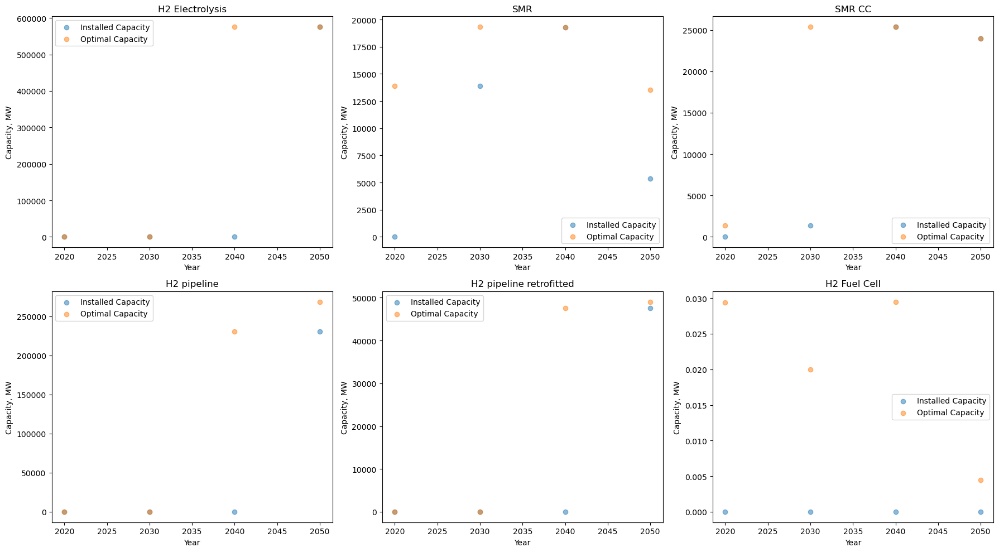

In [52]:
hydrogen_capacity_graphs(Scenario3_trial_list_9)

OK great, sofar I think it's working, now I want to find the minimums for each time period -- preferably by doing it the clever way by making hydrogen very expensive. First I will do one run where I just reduce the availability of these things to below the levels I see here (simillar to last week's "reduction of 75% and reduction of 80%) 

/Users/katherine.shaw/miniconda3/envs/pypsa-eur/lib/python3.12/site-packages/pandas/plotting/_matplotlib/core.py:1800: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.



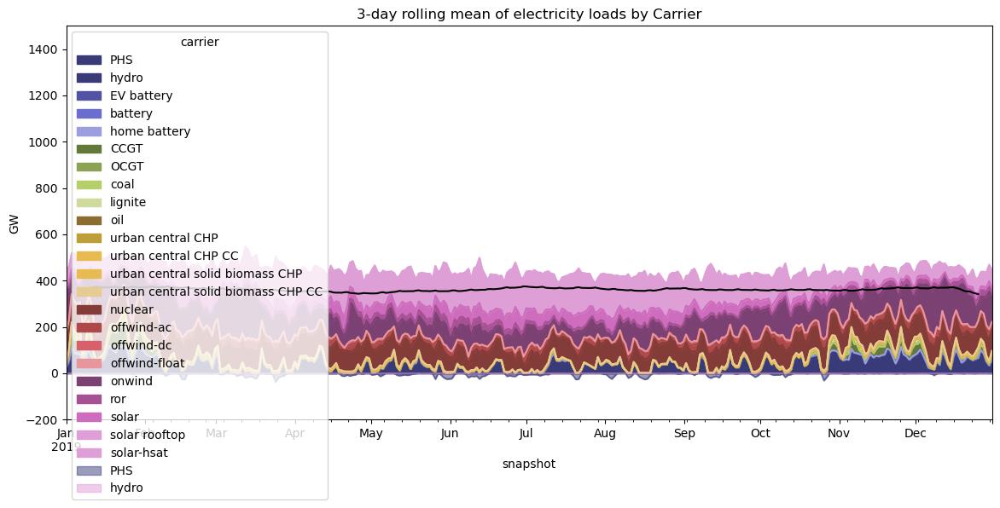

In [58]:
af.all_dispatch_plus_load_electric(Scenario3_trial_list_9[1])

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1264: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1277: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:1278: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Deskto

(<matplotlib.collections.PatchCollection at 0x3c8d71730>,
 <matplotlib.collections.LineCollection at 0x3c8e3cb00>)

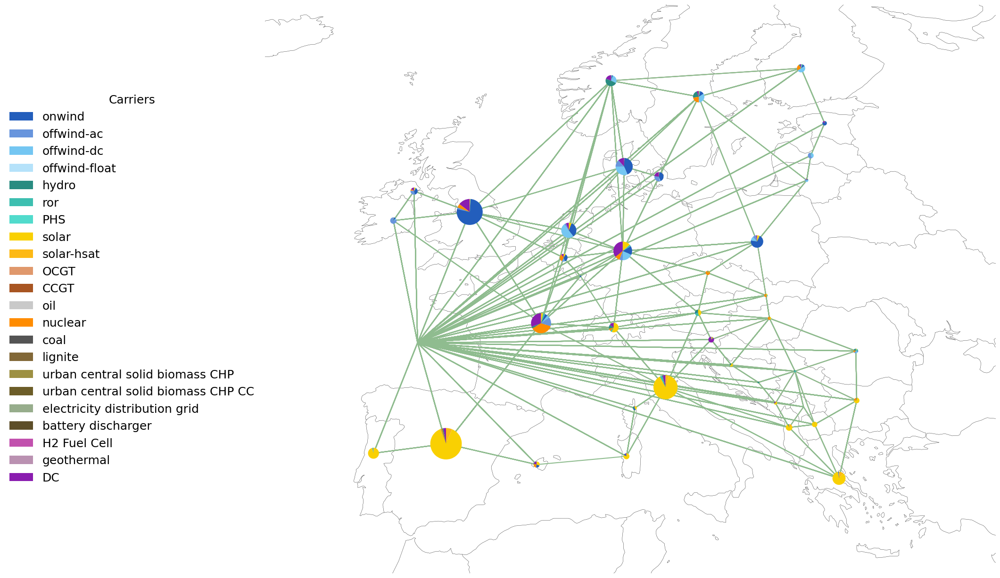

In [67]:
af.plot_network_test(Scenario3_trial_list_9[2], 'electric')

This is the limitations I put on Hydrogen electrolysis compared to the last model 


limit_capacity_by_country : false #false means that the limits applied to all of Europe, true means the structure has to mimic pypsa DE and apply to the whole country
## CUSTOM CONSTRAINT of Carrier Specific Capcity Growth (Modelled AFTER FUNCTION IN PYPSA DE)
limits_capacity_max: #if this config flag is here, it triggers the capacity limits (sense = maximum)
  Link:
    H2 pipeline: # in GW
      2020: 250 
      2030: 250
      2040: 250 
      2050: 250
    H2 Electrolysis: # in GW
      2020: 500
      2030: 500
      2040: 500
      2050: 500
#    H2 Fuel Cell: # in GW
#      2020: 5
#      2030: 5
#      2040: 5
#      2050: 5 
#    H2 turbine: # in GW 
#      2030: 5 
#      2020: 5
#      2040: 5
#      2050: 5 
    SMR: # in GW 
      2020: 150 
      2030: 150
      2040: 150
      2050: 150
    SMR_cc: # in GW 
      2020: 150 
      2030: 150 
      2040: 150
      2050: 150

In [68]:
Scenario3_trial_2020_10 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_10 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_10= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_10 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [69]:
Scenario3_trial_list_10 = [Scenario3_trial_2020_10, Scenario3_trial_2030_10, Scenario3_trial_2040_10, Scenario3_trial_2050_10 ]

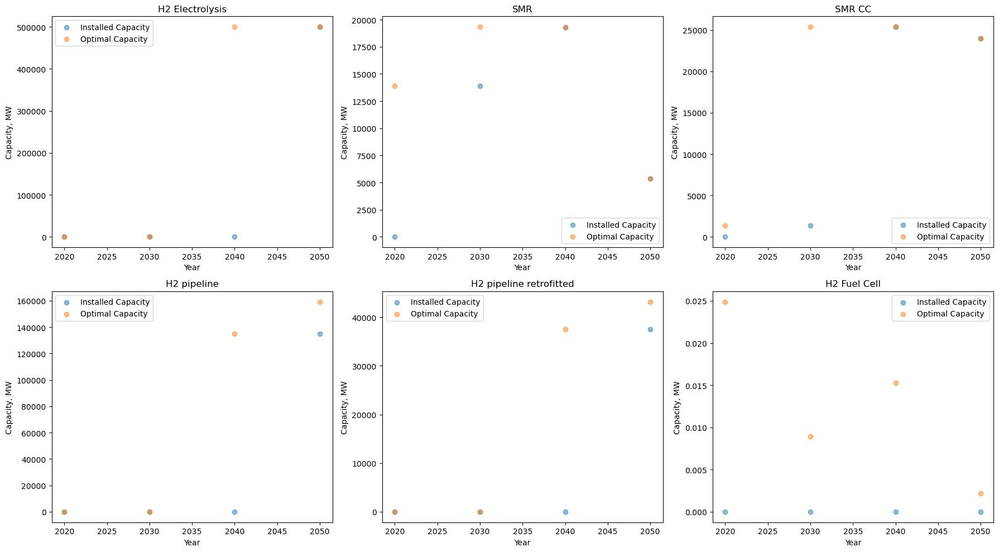

In [70]:
hydrogen_capacity_graphs(Scenario3_trial_list_10)

In [ ]:
#Great, we're back to where we were

NOW I'm going make the cost of hydrogen electrolysis incredibly expensive. And SMR is going to be limited to 20 GW and SMR cc to 25, to see how the model reacts (and hopefully give me some minimums for electrolysis)

going to change capital costs in the configruation file like I did for geothermal

capital_cost: ##AHHHH THESE PROBABLY SHOULD BE PER MW NOT JUST THE TOTALS

 #added because there was geothermal produced in Italy even though there was a capital cost that should have been included. 

 
    geothermal: 6983145.710599946  #added because there was geothermal 
    
    produced in Italy even though there was a capital cost that should have been included. 

    
    H2: 1000000.00 #added to try and push down electrolysis usage

In [71]:
Scenario3_trial_2020_11 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_11 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_11= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_11 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [72]:
Scenario3_trial_list_11 = [Scenario3_trial_2020_11, Scenario3_trial_2030_11, Scenario3_trial_2040_11, Scenario3_trial_2050_11 ]

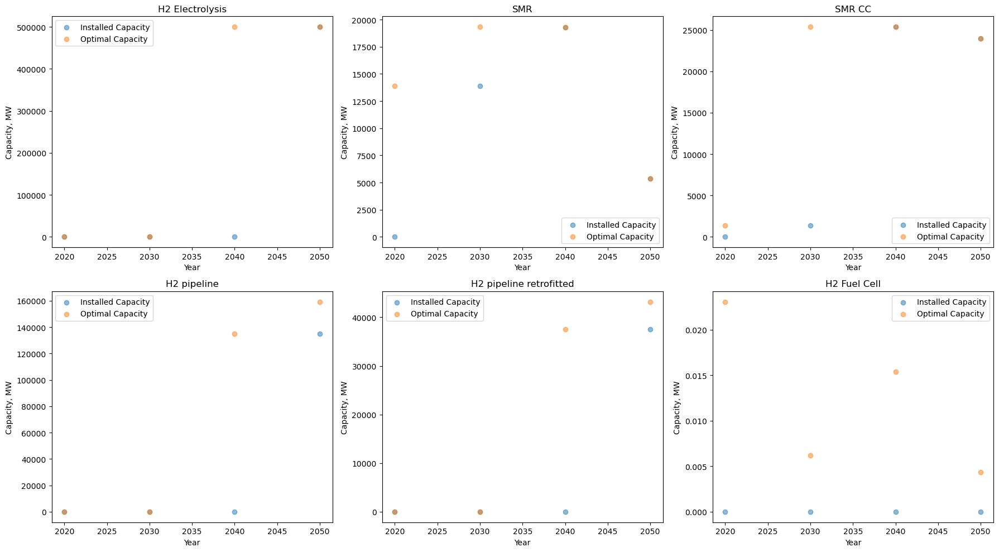

In [73]:
hydrogen_capacity_graphs(Scenario3_trial_list_11)

well that's odd, let's compare against the previous set of scenarios 10 to see why there was not less electrolysis

In [ ]:
Sankey_biomass_hydrogen(Scenario3_trial_2050_10)
Sankey_biomass_hydrogen(Scenario3_trial_2050_11)
#not significant change in flows between the two runs 


/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:25: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:70: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:25: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:70: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



In [ ]:
#print(f"{Scenario3_trial_2020_10.objective:e}")
#print(f"{Scenario3_trial_2020_11.objective:e}")

two_runs_list = [Scenario3_trial_list_10, Scenario3_trial_list_11]
for i in two_runs_list:
    net_list = i
    total_cost = 0
    for net in net_list: 
        objective = net.objective 
        total_cost_years = objective * 10 
        total_cost += total_cost_years
    print(f"{total_cost:e}")
  

#I guess the hydrogen one is TECHNICALLY more expensive over the whole time frame
# BUT the difference is like 0.0003 percent, why is it not getting rid of hydrogen more? 


1.598276e+13
1.598281e+13


In [104]:
Scenario3_trial_list_10[2].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.000000e+05
Installed Capacity         0.000000e+00
Supply                     2.804812e+09
Withdrawal                 4.008133e+09
Energy Balance            -1.203320e+09
Transmission               0.000000e+00
Capacity Factor            9.150988e-01
Curtailment                0.000000e+00
Capital Expenditure        7.548631e+10
Operational Expenditure    4.108039e+07
Revenue                    2.791065e+11
Market Value               9.950988e+01
Name: (Link, H2 Electrolysis), dtype: float64

In [105]:
Scenario3_trial_list_11[2].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.000000e+05
Installed Capacity         0.000000e+00
Supply                     2.804823e+09
Withdrawal                 4.008148e+09
Energy Balance            -1.203325e+09
Transmission               0.000000e+00
Capacity Factor            9.151022e-01
Curtailment                0.000000e+00
Capital Expenditure        7.548631e+10
Operational Expenditure    3.961563e+07
Revenue                    2.790910e+11
Market Value               9.950396e+01
Name: (Link, H2 Electrolysis), dtype: float64

Going to try to do it again but with H2 having the capcity limit, see if that changes anything 

.... 
   "discount rate": 0.07

  overwrites: {} 

  capital_cost: ##AHHHH THESE PROBABLY SHOULD BE PER MW NOT JUST THE TOTALS
   #added because there was geothermal produced in Italy even though there 
   was a capital cost that should have been included. 


    geothermal: 6983145.710599946  #added because there was geothermal 
    
    produced in Italy even though there was a capital cost that should have been included. 


    H2: 1000000.00 #added to try and push down electrolysis usage

    
  marginal_cost:
  ... 

If this doesn't work I'm going to try to change marginal cost again, and if THAT doesn't work, then it's back to spagetti at the wall I suppose? 

In [106]:
Scenario3_trial_2020_12 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_12 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_12= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_12 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [107]:
Scenario3_trial_list_12 = [Scenario3_trial_2020_12, Scenario3_trial_2030_12, Scenario3_trial_2040_12, Scenario3_trial_2050_12 ]

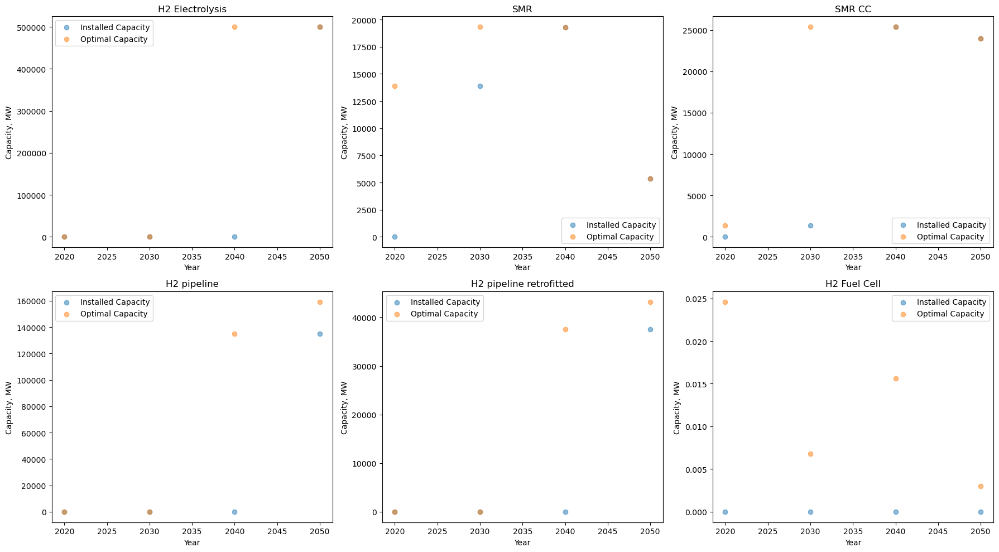

In [108]:
hydrogen_capacity_graphs(Scenario3_trial_list_12)

Scenario 13: Changing the marginal costs to be high 

I have eliminated all hydrogen related changed in costs: capital_costs: and instead am going to try to change the marginal costs (added 1000 to H2 and electrolysis from 0)

.... 
 marginal_cost:

    solar: 0.01

    onwind: 0.015

    offwind: 0.015

    hydro: 0.

    H2: 1000.

    electrolysis: 1000.

    fuel cell: 0.

    battery: 0.

    battery inverter: 0.

  emission_prices:
  .....

In [114]:
Scenario3_trial_2020_13 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_13 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_13= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_13 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [115]:
Scenario3_trial_list_13 = [Scenario3_trial_2020_13, Scenario3_trial_2030_13, Scenario3_trial_2040_13, Scenario3_trial_2050_13 ]

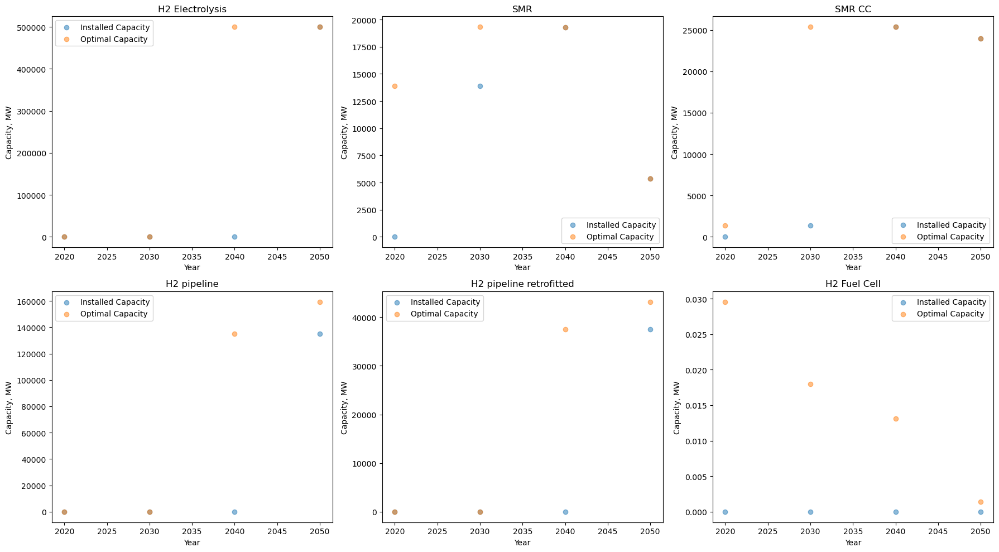

In [116]:
hydrogen_capacity_graphs(Scenario3_trial_list_13)

In [120]:
print(f"{Scenario3_trial_2050_10.objective:e}")
print(f"{Scenario3_trial_2050_12.objective:e}")


6.473903e+10
6.473851e+10


In [123]:
Scenario3_trial_2020_14 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_14 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_14= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_14 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [122]:
def hydrogen_capacity_graphs(network_list): 
    hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
    hydrogen_tech_tuple_list = [('Link', tech) for tech in hydrogen_tech_list]
    networks1 = network_list
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns
    axes = axes.flatten()  # make it easier to iterate

    for i, tech in enumerate(hydrogen_tech_tuple_list):
        carrier_type, technology = tech
        mean_value = []
        mean_value_optimal = []
        for net in networks1:
            if technology in net.statistics().loc[carrier_type].index:
                stats = net.statistics().loc[carrier_type, technology]
                mean_value.append(stats['Installed Capacity'])
                mean_value_optimal.append(stats['Optimal Capacity'])
            else:
                mean_value.append(0)
                mean_value_optimal.append(0)
    
        ax = axes[i]
        ax.scatter([2020, 2030, 2040, 2050], mean_value, label='Installed Capacity', alpha=0.5)
        ax.scatter([2020, 2030, 2040, 2050], mean_value_optimal, label='Optimal Capacity', alpha=0.5)
        ax.set_title(f'{technology}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Capacity, MW')
        ax.legend()

    plt.tight_layout()
    plt.show()

In [124]:
Scenario3_trial_list_14 = [Scenario3_trial_2020_14, Scenario3_trial_2030_14, Scenario3_trial_2040_14, Scenario3_trial_2050_14 ]

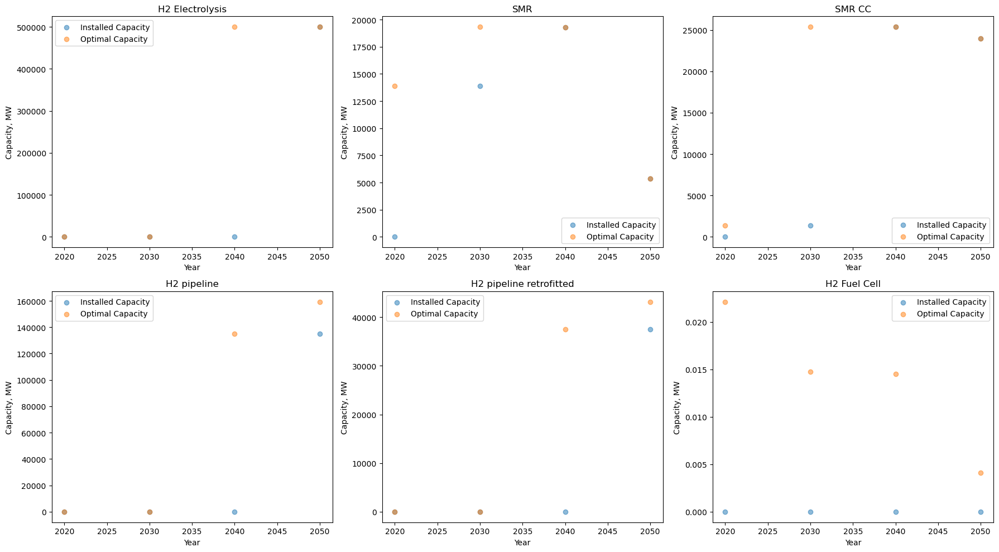

In [125]:
hydrogen_capacity_graphs(Scenario3_trial_list_14)

In [130]:
#print(f"{Scenario3_trial_2020_10.objective:e}")
#print(f"{Scenario3_trial_2020_11.objective:e}")

two_runs_list = [Scenario3_trial_list_14, Scenario3_trial_list_13]
for i in two_runs_list:
    net_list = i
    total_cost = 0
    for net in net_list: 
        objective = net.objective 
        total_cost_years = objective * 10 
        total_cost += total_cost_years
    print(f"{total_cost:e}")
  

#I guess the hydrogen one is TECHNICALLY more expensive over the whole time frame
# BUT the difference is like 0.0003 percent, why is it not getting rid of hydrogen more? 


1.598271e+13
1.598286e+13


In [135]:
Scenario3_trial_list_13[2].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.000000e+05
Installed Capacity         0.000000e+00
Supply                     2.804828e+09
Withdrawal                 4.008154e+09
Energy Balance            -1.203327e+09
Transmission               0.000000e+00
Capacity Factor            9.151037e-01
Curtailment                0.000000e+00
Capital Expenditure        7.548631e+10
Operational Expenditure    4.021015e+07
Revenue                    2.791048e+11
Market Value               9.950873e+01
Name: (Link, H2 Electrolysis), dtype: float64

In [136]:
Scenario3_trial_list_14[2].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.000000e+05
Installed Capacity         0.000000e+00
Supply                     2.804844e+09
Withdrawal                 4.008177e+09
Energy Balance            -1.203334e+09
Transmission               0.000000e+00
Capacity Factor            9.151090e-01
Curtailment                0.000000e+00
Capital Expenditure        7.548631e+10
Operational Expenditure    4.021044e+07
Revenue                    2.791094e+11
Market Value               9.950978e+01
Name: (Link, H2 Electrolysis), dtype: float64

has pypsa diverted all electrolysis to electrolysis small to maintain roughly the same cost and electrolysis -- because marginal costs has to have a key that's technology, and in the technology index there is both electrolysis and electrolysis small

In [ ]:
network_test = Scenario3_trial_list_13[3]
network_test.links[network_test.links.carrier == 'H2 Electrolysis']
network_test.links.carrier.unique() 

array(['DC', 'oil refining', 'co2 sequestered', 'OCGT', 'lignite', 'coal',
       'CCGT', 'H2 Electrolysis', 'H2 Fuel Cell', 'gas pipeline',
       'gas pipeline new', 'H2 pipeline retrofitted', 'H2 pipeline',
       'battery charger', 'battery discharger', 'Sabatier', 'SMR CC',
       'SMR', 'BEV charger', 'V2G', 'urban central air heat pump',
       'urban central water tanks charger',
       'urban central water tanks discharger',
       'urban central resistive heater', 'urban central gas boiler',
       'urban central CHP', 'urban central CHP CC', 'biogas to gas',
       'urban central solid biomass CHP',
       'urban central solid biomass CHP CC', 'solid biomass for industry',
       'solid biomass for industry CC', 'gas for industry',
       'gas for industry CC', 'industry methanol', 'methanolisation',
       'shipping methanol', 'Fischer-Tropsch', 'naphtha for industry',
       'kerosene for aviation', 'process emissions',
       'process emissions CC', 'agriculture machinery

added price to electrolysis small as well for Scenario 15 in marginal cost, also 100000


In [141]:
Scenario3_trial_2020_15 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_15 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_15= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_15 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [142]:
Scenario3_trial_list_15 = [Scenario3_trial_2020_15,Scenario3_trial_2030_15, Scenario3_trial_2040_15, Scenario3_trial_2050_15 ]

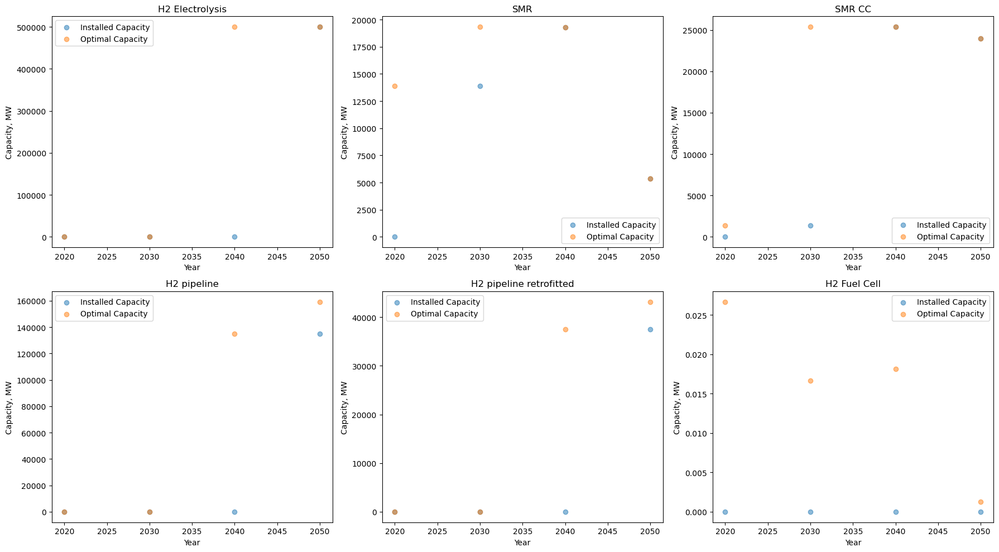

In [143]:
hydrogen_capacity_graphs(Scenario3_trial_list_15)

In [144]:
#print(f"{Scenario3_trial_2020_10.objective:e}")
#print(f"{Scenario3_trial_2020_11.objective:e}")

two_runs_list = [Scenario3_trial_list_14, Scenario3_trial_list_15]
for i in two_runs_list:
    net_list = i
    total_cost = 0
    for net in net_list: 
        objective = net.objective 
        total_cost_years = objective * 10 
        total_cost += total_cost_years
    print(f"{total_cost:e}")
  

#I guess the hydrogen one is TECHNICALLY more expensive over the whole time frame
# BUT the difference is like 0.0003 percent, why is it not getting rid of hydrogen more? 


1.598271e+13
1.598274e+13


In [152]:
f"{Scenario3_trial_list_14[3].objective:e}" #.statistics().loc[('Link', 'H2 Electrolysis')]

'6.473500e+10'

In [153]:
f"{Scenario3_trial_list_15[3].objective:e}" 
#Scenario3_trial_list_15[2].statistics().loc[('Link', 'H2 Electrolysis')]

'6.473851e+10'

In [154]:
Scenario3_trial_2020_16 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_16 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_16= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_16 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [155]:
Scenario3_trial_list_16 = [Scenario3_trial_2020_16,Scenario3_trial_2030_16, Scenario3_trial_2040_16, Scenario3_trial_2050_16 ]

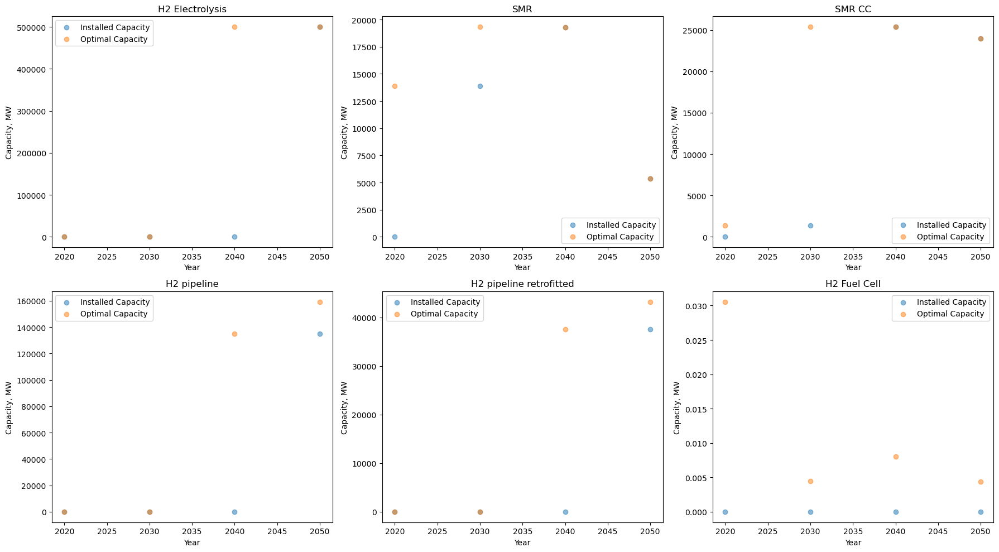

In [156]:
hydrogen_capacity_graphs(Scenario3_trial_list_16)

In [158]:
#print(f"{Scenario3_trial_2020_10.objective:e}")
#print(f"{Scenario3_trial_2020_11.objective:e}")

two_runs_list = [Scenario3_trial_list_14, Scenario3_trial_list_15, Scenario3_trial_list_16] #no small electrolysis marginal cost and yes electrolysis marginal cost
for i in two_runs_list:
    net_list = i
    total_cost = 0
    for net in net_list: 
        objective = net.objective 
        total_cost_years = objective * 10 
        total_cost += total_cost_years
    print(f"{total_cost:e}")
  

#I guess the hydrogen one is TECHNICALLY more expensive over the whole time frame
# BUT the difference is like 0.0003 percent, why is it not getting rid of hydrogen more? 


1.598271e+13
1.598274e+13
1.598261e+13


In [167]:
f"{Scenario3_trial_list_15[3].objective:e}" #.statistics().loc[('Link', 'H2 Electrolysis')]

'6.473851e+10'

In [ ]:
f"{Scenario3_trial_list_16[3].objective:e}" #.statistics().loc[('Link', 'H2 Electrolysis')]) #.statistics().loc[('Link', 'H2 Electrolysis')]

'6.473851e+10'

Reloaded the whole thing just in case... (aka, snakemake purge but the same scenario as in 16)

In [168]:
Scenario3_trial_2020_17 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_17 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_17= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_17 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [169]:
Scenario3_trial_list_17 = [Scenario3_trial_2020_17,Scenario3_trial_2030_17, Scenario3_trial_2040_17, Scenario3_trial_2050_17 ]

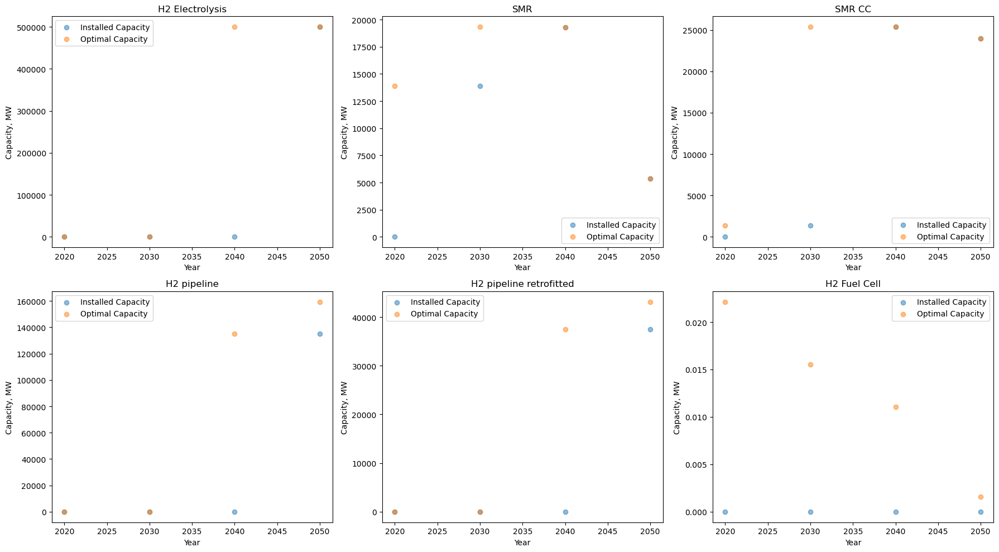

In [170]:
hydrogen_capacity_graphs(Scenario3_trial_list_17)

In [171]:
costs_2020 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv')


In [190]:
#changing the cost values of electrolysis directly (to see if)

#
electrolysis_index = costs_2020[costs_2020.technology == 'electrolysis'][costs_2020.parameter == 'investment']['value'].index
costs_2020.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2020.loc[electrolysis_index]

electrolysis_index = costs_2020[costs_2020.technology == 'electrolysis small'][costs_2020.parameter == 'investment']['value'].index
costs_2020.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2020.loc[electrolysis_index]

costs_2020.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv', index = False)


#2030
costs_2030 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv')

electrolysis_index = costs_2030[costs_2030.technology == 'electrolysis'][costs_2030.parameter == 'investment']['value'].index
costs_2030.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2030.loc[electrolysis_index]

electrolysis_index = costs_2030[costs_2030.technology == 'electrolysis small'][costs_2030.parameter == 'investment']['value'].index
costs_2030.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2030.loc[electrolysis_index]

costs_2030.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv', index = False)

#2030
costs_2040 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv')

electrolysis_index = costs_2040[costs_2040.technology == 'electrolysis'][costs_2040.parameter == 'investment']['value'].index
costs_2040.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2040.loc[electrolysis_index]

electrolysis_index = costs_2040[costs_2040.technology == 'electrolysis small'][costs_2040.parameter == 'investment']['value'].index
costs_2040.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2040.loc[electrolysis_index]

costs_2040.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv', index = False)

#2050
costs_2050 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv')

electrolysis_index = costs_2050[costs_2050.technology == 'electrolysis'][costs_2050.parameter == 'investment']['value'].index
costs_2050.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2050.loc[electrolysis_index]

electrolysis_index = costs_2050[costs_2050.technology == 'electrolysis small'][costs_2050.parameter == 'investment']['value'].index
costs_2050.loc[electrolysis_index, 'value'] = 10000.0 #need to use location based indexing
costs_2050.loc[electrolysis_index]

costs_2050.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv', index = False)


/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3285813517.py:4: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3285813517.py:8: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3285813517.py:18: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3285813517.py:22: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3285813517.py:31: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3285813517.py:35: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r00

In [191]:
Scenario3_trial_2020_18 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_18 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_18= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_18 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [192]:
Scenario3_trial_list_18 = [Scenario3_trial_2020_18, Scenario3_trial_2030_18,Scenario3_trial_2040_18,Scenario3_trial_2050_18 ]

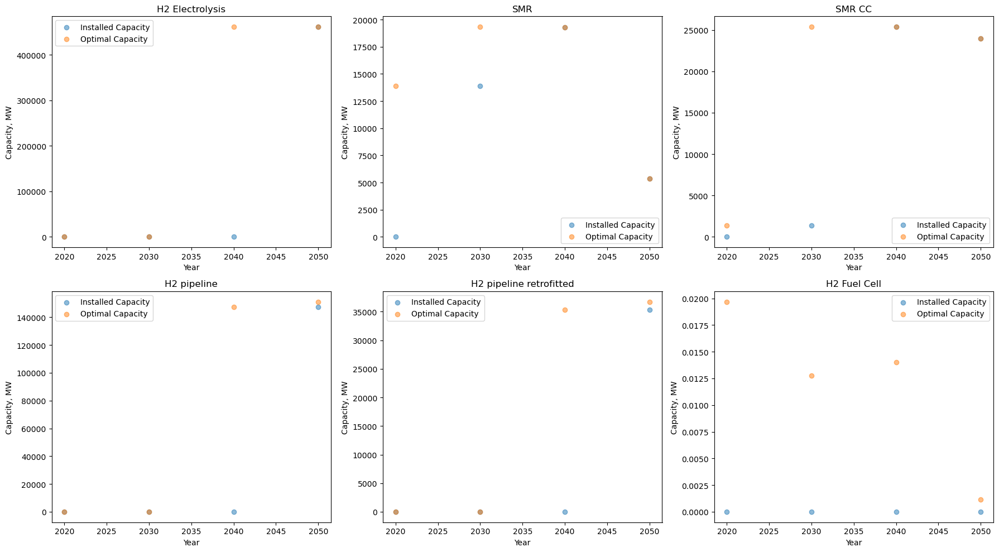

In [193]:
hydrogen_capacity_graphs(Scenario3_trial_list_18)

In [194]:
#print(f"{Scenario3_trial_2020_10.objective:e}")
#print(f"{Scenario3_trial_2020_11.objective:e}")

two_runs_list = [Scenario3_trial_list_14, Scenario3_trial_list_15, Scenario3_trial_list_16, Scenario3_trial_list_17, Scenario3_trial_list_18 ] #no small electrolysis marginal cost and yes electrolysis marginal cost
for i in two_runs_list:
    net_list = i
    total_cost = 0
    for net in net_list: 
        objective = net.objective 
        total_cost_years = objective * 10 
        total_cost += total_cost_years
    print(f"{total_cost:e}")
  

#I guess the hydrogen one is TECHNICALLY more expensive over the whole time frame
# BUT the difference is like 0.0003 percent, why is it not getting rid of hydrogen more? 


1.598271e+13
1.598274e+13
1.598261e+13
1.598279e+13
2.130746e+13


I think 18 worked? Electrolysis is down! It's down without more force! OMG!

In [205]:
Scenario3_trial_list_18[3].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           4.617112e+05
Installed Capacity         4.617112e+05
Supply                     2.322304e+09
Withdrawal                 3.318834e+09
Energy Balance            -9.965300e+08
Transmission               0.000000e+00
Capacity Factor            8.205613e-01
Curtailment                0.000000e+00
Capital Expenditure        5.808813e+11
Operational Expenditure    6.679850e+07
Revenue                    1.343153e+10
Market Value               5.783707e+00
Name: (Link, H2 Electrolysis), dtype: float64

In [206]:
Scenario3_trial_list_17[3].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           4.999999e+05
Installed Capacity         4.999999e+05
Supply                     2.311514e+09
Withdrawal                 3.303190e+09
Energy Balance            -9.916766e+08
Transmission               0.000000e+00
Capacity Factor            7.541531e-01
Curtailment                0.000000e+00
Capital Expenditure        7.548630e+10
Operational Expenditure    6.623172e+07
Revenue                    1.108871e+10
Market Value               4.797164e+00
Name: (Link, H2 Electrolysis), dtype: float64

In [207]:
Scenario3_trial_list_16[3].statistics().loc[('Link', 'H2 Electrolysis')]

Optimal Capacity           5.000000e+05
Installed Capacity         5.000000e+05
Supply                     2.311517e+09
Withdrawal                 3.303195e+09
Energy Balance            -9.916784e+08
Transmission               0.000000e+00
Capacity Factor            7.541542e-01
Curtailment                0.000000e+00
Capital Expenditure        7.548630e+10
Operational Expenditure    6.547672e+07
Revenue                    1.108749e+10
Market Value               4.796628e+00
Name: (Link, H2 Electrolysis), dtype: float64

In [209]:
print(f"{Scenario3_trial_list_16[2].objective:e}" )
print(f"{Scenario3_trial_list_17[2].objective:e}" ) 
print(f"{Scenario3_trial_list_18[2].objective:e}" )

5.638824e+11
5.638946e+11
1.100483e+12


Make sure you snakemake purge to get the original cost files back Katherine, then change the prices to be 15 times more expensive than you thought  

### Changing the costs CSVs

In [ ]:
#to Check, what is everything connected to an H2 bus? 

In [233]:
#loading costs files 
#costs_2020 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv')
#costs_2030 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv')
#costs_2040 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv')
#costs_2050 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv')

#Electrolysis 
cost_file = costs_2020.copy()
electrolysis_index = cost_file[cost_file.technology == 'electrolysis'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value

#Electrlysis Small 
electrolysis_index = cost_file[cost_file.technology == 'electrolysis small'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMR 
electrolysis_index = cost_file[cost_file.technology == 'SMR'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#the second steam methane reforming 
electrolysis_index = cost_file[cost_file.technology == 'Steam methane reforming'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMRCC
electrolysis_index = cost_file[cost_file.technology == 'SMR CC'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines
electrolysis_index = cost_file[cost_file.technology == 'H2 pipeline'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines retrofitted 
#didn't find

#H2 fuel cell
#not necesary to minimize, I'm trying to find what is the least amoung of hydrogen 

cost_file.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv', index = False)



/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3180652777.py:9: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3180652777.py:16: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3180652777.py:24: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3180652777.py:31: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3180652777.py:38: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3180652777.py:46: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [234]:
#2030 
#loading costs files 
#costs_2020 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv')
#costs_2030 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv')
#costs_2040 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv')
#costs_2050 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv')

#Electrolysis 
cost_file = costs_2030.copy()
electrolysis_index = cost_file[cost_file.technology == 'electrolysis'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value

#Electrlysis Small 
electrolysis_index = cost_file[cost_file.technology == 'electrolysis small'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMR 
electrolysis_index = cost_file[cost_file.technology == 'SMR'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#the second steam methane reforming 
electrolysis_index = cost_file[cost_file.technology == 'Steam methane reforming'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMRCC
electrolysis_index = cost_file[cost_file.technology == 'SMR CC'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines
electrolysis_index = cost_file[cost_file.technology == 'H2 pipeline'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines retrofitted 
#didn't find

#H2 fuel cell
#not necesary to minimize, I'm trying to find what is the least amoung of hydrogen 

cost_file.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv', index = False)



/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3593245672.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3593245672.py:17: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3593245672.py:25: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3593245672.py:32: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3593245672.py:39: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3593245672.py:47: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [235]:
##2040 
#loading costs files 
#costs_2020 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv')
#costs_2030 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv')
#costs_2040 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv')
#costs_2050 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv')

#Electrolysis 
cost_file = costs_2040.copy()
electrolysis_index = cost_file[cost_file.technology == 'electrolysis'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value

#Electrlysis Small 
electrolysis_index = cost_file[cost_file.technology == 'electrolysis small'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMR 
electrolysis_index = cost_file[cost_file.technology == 'SMR'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#the second steam methane reforming 
electrolysis_index = cost_file[cost_file.technology == 'Steam methane reforming'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMRCC
electrolysis_index = cost_file[cost_file.technology == 'SMR CC'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines
electrolysis_index = cost_file[cost_file.technology == 'H2 pipeline'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines retrofitted 
#didn't find

#H2 fuel cell
#not necesary to minimize, I'm trying to find what is the least amoung of hydrogen 

cost_file.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv', index = False)



/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3673042299.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3673042299.py:17: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3673042299.py:25: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3673042299.py:32: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3673042299.py:39: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/3673042299.py:47: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [236]:
## 2050
#loading costs files 
#costs_2020 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2020.csv')
#costs_2030 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2030.csv')
#costs_2040 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2040.csv')
#costs_2050 = pd.read_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv')

#Electrolysis 
cost_file = costs_2050.copy()
electrolysis_index = cost_file[cost_file.technology == 'electrolysis'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value

#Electrlysis Small 
electrolysis_index = cost_file[cost_file.technology == 'electrolysis small'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
new_value
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMR 
electrolysis_index = cost_file[cost_file.technology == 'SMR'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#the second steam methane reforming 
electrolysis_index = cost_file[cost_file.technology == 'Steam methane reforming'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']

#SMRCC
electrolysis_index = cost_file[cost_file.technology == 'SMR CC'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines
electrolysis_index = cost_file[cost_file.technology == 'H2 pipeline'][cost_file.parameter == 'investment']['value'].index
old_value = cost_file.loc[electrolysis_index, 'value'].item() #= 10000.0 #need to use location based indexing
new_value = old_value * 15 
cost_file.loc[electrolysis_index, 'value'] = new_value
cost_file.loc[electrolysis_index, 'value']


#H2 Pipelines retrofitted 
#didn't find

#H2 fuel cell
#not necesary to minimize, I'm trying to find what is the least amoung of hydrogen 

cost_file.to_csv('/Users/katherine.shaw/Desktop/pypsa-eur/resources/costs_2050.csv', index = False)



/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/215727356.py:10: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/215727356.py:17: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/215727356.py:25: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/215727356.py:32: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/215727356.py:39: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/215727356.py:47: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



Results for changing the costs files directy: 

In [ ]:
Scenario3_trial_2020_19 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_19 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_19= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_19 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [238]:
Scenario3_list_19 = [Scenario3_trial_2020_19, Scenario3_trial_2030_19, Scenario3_trial_2040_19, Scenario3_trial_2050_19]

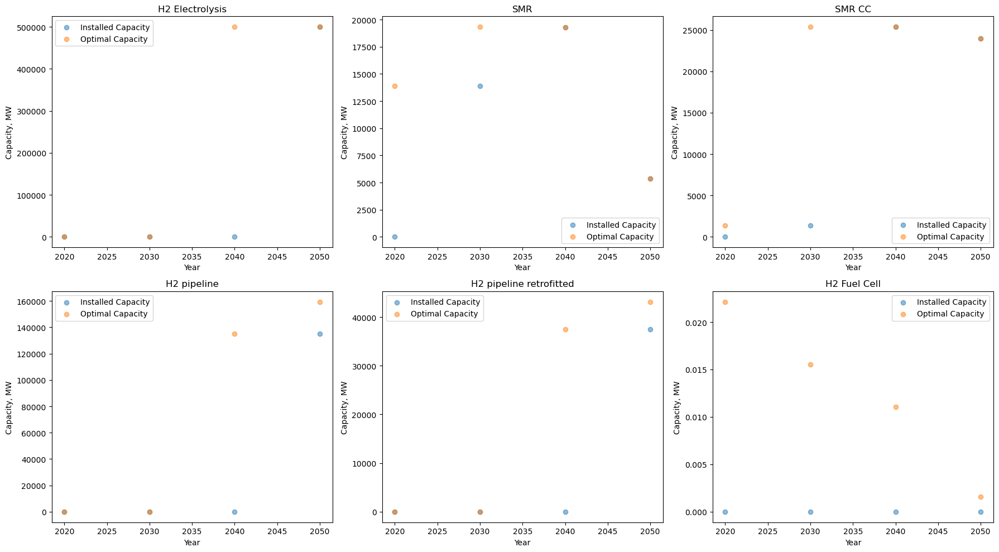

In [241]:
hydrogen_capacity_graphs(Scenario3_trial_list_17)

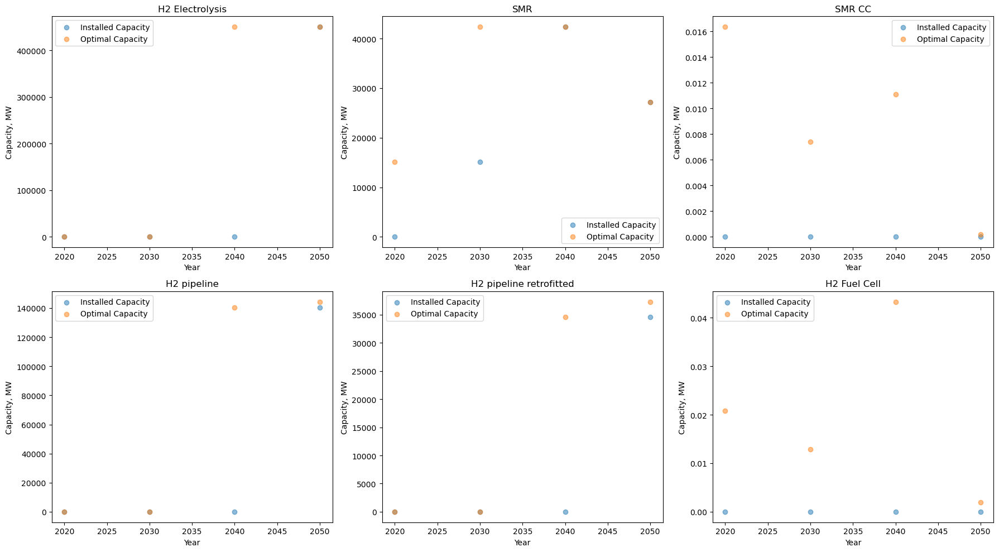

In [239]:
hydrogen_capacity_graphs(Scenario3_list_19)

Ahhhhhh it worked

In [242]:
co2_constraint_satisfaction(Scenario3_list_19)

The CO2 constraint remains satisfied. The value of the CO2 constraint is 3.314820e+09, and the value of the CO2 store at the last snapshot is 3.314820e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.071763e+09, and the value of the CO2 store at the last snapshot is 2.071763e+09 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 4.603917e+08, and the value of the CO2 store at the last snapshot is 4.603917e+08 tons of CO2
The CO2 constraint remains satisfied. The value of the CO2 constraint is 2.301959e+08, and the value of the CO2 store at the last snapshot is 2.299357e+08 tons of CO2


and all the constraints remain satisfied, this is great! I guess then it's up to use if we want to distribute some of the SMR capacity into SMR CC -- assuming SMR and SMR CCs are just as efficient, we can distribute the minimum across anything.  

In [ ]:
#2040 buildout across four scenarios 
the_scenarios_trials = [Scenario3_trial_list_10, Scenario3_trial_list_14, Scenario3_trial_list_17, Scenario3_list_19]
for net_list in the_scenarios_trials:
    year_2040_values = net_list[2]
    optimal_built = year_2040_values.statistics

In [ ]:
def hydrogen_capacity_graphs(network_list): 
    hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
    hydrogen_tech_tuple_list = [('Link', tech) for tech in hydrogen_tech_list]
    networks1 = network_list
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))  # 2 rows, 3 columns
    axes = axes.flatten()  # make it easier to iterate

    for i, tech in enumerate(hydrogen_tech_tuple_list):
        carrier_type, technology = tech
        mean_value = []
        mean_value_optimal = []
        for net in networks1:
            if technology in net.statistics().loc[carrier_type].index:
                stats = net.statistics().loc[carrier_type, technology]
                mean_value.append(stats['Installed Capacity'])
                mean_value_optimal.append(stats['Optimal Capacity'])
            else:
                mean_value.append(0)
                mean_value_optimal.append(0)
    
        ax = axes[i]
        ax.scatter([2020, 2030, 2040, 2050], mean_value, label='Installed Capacity', alpha=0.5)
        ax.scatter([2020, 2030, 2040, 2050], mean_value_optimal, label='Optimal Capacity', alpha=0.5)
        ax.set_title(f'{technology}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Capacity, MW')
        ax.legend()

    plt.tight_layout()
    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# List of hydrogen technologies you're interested in
hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
hydrogen_tech_tuple_list = [('Link', tech) for tech in hydrogen_tech_list]
# Assuming network_list contains four lists, each of them containing PyPSA networks
# We need to gather the installed and optimal values across all networks for each technology

installed_values = {tech: [] for tech in hydrogen_tech_list}
optimal_values = {tech: [] for tech in hydrogen_tech_list}
network_list = [Scenario3_trial_list_10, Scenario3_trial_list_14, Scenario3_trial_list_17, Scenario3_list_19]
# Iterate over the lists and extract the third network from each (index 2)
for network_set in network_list:
    network = network_set[2]  # Get the third network
    carrier_type = 'Link'
    # For each technology, extract the installed and optimal values across the networks
    for tech in hydrogen_tech_list:
        installed_value = 0
        optimal_value = 0
        if tech in network.statistics().loc[carrier_type].index:
            stats = network.statistics().loc[carrier_type, tech]
            installed_value = stats['Installed Capacity']
            optimal_value = stats['Optimal Capacity']
        
        # Append the values for this technology across the networks
        installed_values[tech].append(installed_value)
        optimal_values[tech].append(optimal_value)

# Now create the bar plot for each technology
#n_networks = len(network_list)  # Number of networks to compare (4 networks)

#bar_width = 0.35  # Width of the bars
# Create a bar chart for all technologies
#fig, ax = plt.subplots(figsize=(12, 8))

# Define the positions for the bars
#index = np.arange(len(hydrogen_tech_list))

# Plot installed and optimal values for each network
#for i, tech in enumerate(hydrogen_tech_list):
#    ax.bar(index[i] - bar_width/2, installed_values[tech], bar_width, label=f'{tech} Installed', color='blue')
#    ax.bar(index[i] + bar_width/2, optimal_values[tech], bar_width, label=f'{tech} Optimal', color='green')

#ax.set_xlabel('Hydrogen Technology')
#ax.set_ylabel('Value (MW or relevant unit)')
#ax.set_title('Installed vs Optimal Values for Hydrogen Technologies across Networks')
#ax.set_xticks(index)
#ax.set_xticklabels(hydrogen_tech_list, rotation=45)
#ax.legend()

#plt.tight_layout()
#plt.show()


In [254]:
installed_values

{'H2 Electrolysis': [0.0, 0.0, 0.0, 0.0],
 'SMR': [19287.00214, 19286.95246, 19287.05291, 42319.43741],
 'SMR CC': [25361.10175, 25360.96327, 25361.0902, 0.0],
 'H2 pipeline': [38.76891, 38.78032, 38.76763, 0.0],
 'H2 pipeline retrofitted': [0.0, 0.0, 0.0, 0.0],
 'H2 Fuel Cell': [0.0, 0.0, 0.0, 0.0]}

In [255]:
optimal_values

{'H2 Electrolysis': [499999.99943, 499999.99968, 499999.99981, 450341.65304],
 'SMR': [19287.06065, 19286.99115, 19287.08388, 42319.44953],
 'SMR CC': [25361.15311, 25360.99741, 25361.11716, 0.01111],
 'H2 pipeline': [135159.23472, 135170.50153, 135167.93108, 140403.13812],
 'H2 pipeline retrofitted': [37513.05832,
  37501.61318,
  37495.61531,
  34619.51778],
 'H2 Fuel Cell': [0.01525, 0.0145, 0.01106, 0.04329]}

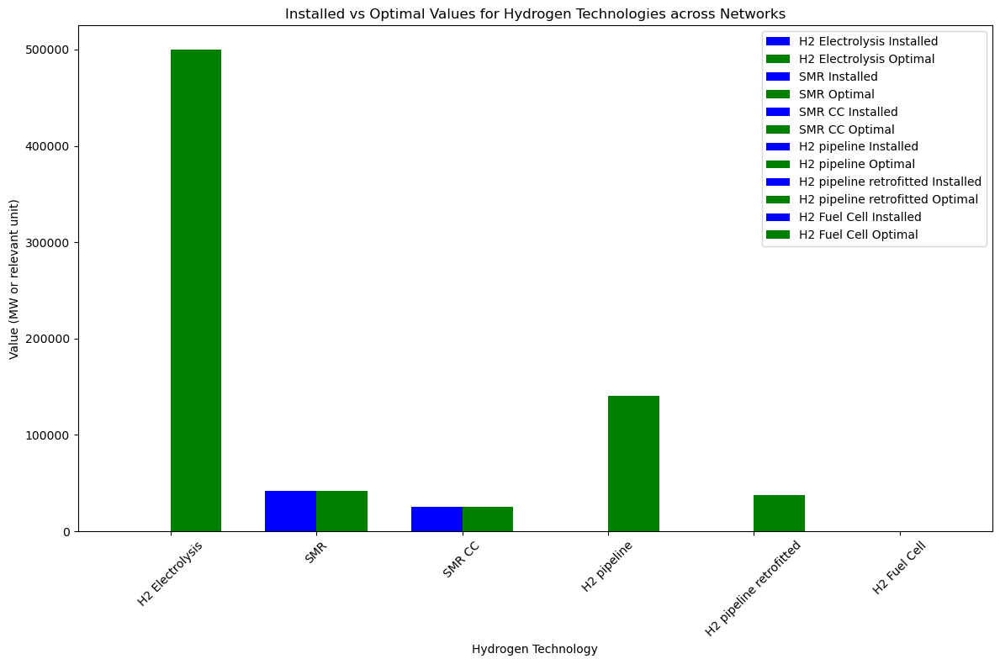

In [256]:
# Now create the bar plot for each technology
n_networks = len(network_list)  # Number of networks to compare (4 networks)

bar_width = 0.35  # Width of the bars
# Create a bar chart for all technologies
fig, ax = plt.subplots(figsize=(12, 8))

# Define the positions for the bars
index = np.arange(len(hydrogen_tech_list))

# Plot installed and optimal values for each network
for i, tech in enumerate(hydrogen_tech_list):
    ax.bar(index[i] - bar_width/2, installed_values[tech], bar_width, label=f'{tech} Installed', color='blue')
    ax.bar(index[i] + bar_width/2, optimal_values[tech], bar_width, label=f'{tech} Optimal', color='green')

ax.set_xlabel('Hydrogen Technology')
ax.set_ylabel('Value (MW or relevant unit)')
ax.set_title('Installed vs Optimal Values for Hydrogen Technologies across Networks')
ax.set_xticks(index)
ax.set_xticklabels(hydrogen_tech_list, rotation=45)
ax.legend()

plt.tight_layout()
plt.show()

In [261]:
test_df = pd.DataFrame(optimal_values)
test_df_installed = pd.DataFrame(installed_values)
test_df_installed

,H2 Electrolysis,SMR,SMR CC,H2 pipeline,H2 pipeline retrofitted,H2 Fuel Cell
0,0.0,19287.00214,25361.10175,38.76891,0.0,0.0
1,0.0,19286.95246,25360.96327,38.78032,0.0,0.0
2,0.0,19287.05291,25361.09020,38.76763,0.0,0.0
3,0.0,42319.43741,0.00000,0.00000,0.0,0.0


In [264]:
# --- Plotting Function ---
def plot_technology_values(data_df, value_type):
    """
    Generates bar graphs for each technology showing its values across networks.

    Args:
        data_df (pd.DataFrame): DataFrame containing technology values,
                                 indexed by network labels.
        value_type (str): 'Optimal' or 'Installed' for plot titles and labels.
    """
    num_technologies = len(hydrogen_tech_list)
    # Create a figure and a set of subplots
    # Adjust figsize based on the number of technologies for better readability
    fig, axes = plt.subplots(num_technologies, 1, figsize=(10, 3 * num_technologies), sharex=True)
    fig.suptitle(f'Hydrogen Technology {value_type.capitalize()} Values Across Networks', fontsize=16, y=1.02)

    # Ensure axes is an iterable even if there's only one subplot
    if num_technologies == 1:
        axes = [axes]

    for i, tech in enumerate(hydrogen_tech_list):
        ax = axes[i]
        # Plot a bar graph for the current technology
        data_df[tech].plot(kind='bar', ax=ax, color='skyblue', edgecolor='black')
        ax.set_title(f'{tech} {value_type.capitalize()} Values', fontsize=12)
        ax.set_ylabel(f'Capacity (MW)', fontsize=10) # Generic units, adjust if known
        ax.tick_params(axis='x', rotation=45) # Rotate labels for readability
        ax.grid(axis='y', linestyle='--', alpha=0.7) # Add a horizontal grid for easier reading

        # Add value labels on top of bars
        for container in ax.containers:
            ax.bar_label(container, fmt='%.1f', label_type='edge', padding=3)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98]) # Adjust layout to prevent title/label overlap
    plt.show() # Display the plots

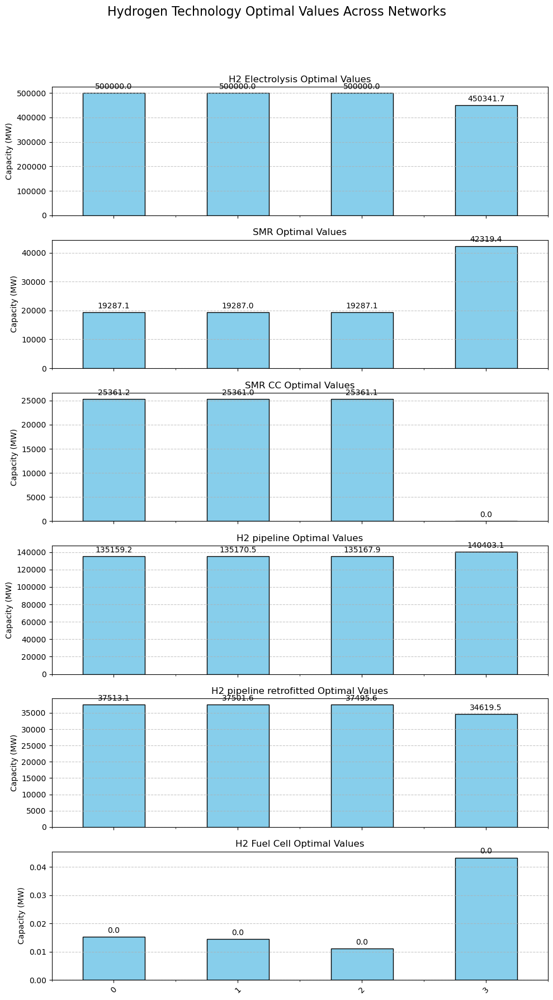

In [265]:
plot_technology_values(test_df, 'Optimal')

In [306]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_grouped_technology_values(data_df, network_sets, years, hydrogen_tech_list, value_type):
    """
    Plots grouped bar charts of technology values across network sets for each year.

    Args:
        data_df (pd.DataFrame): DataFrame with technology values, indexed by network names.
        network_sets (list of list): Each inner list is a set of 4 ordered networks (by year).
        years (list of str): List of years corresponding to the networks within each network set.
        hydrogen_tech_list (list): Technologies to be plotted.
        value_type (str): Either "Optimal" or "Installed".
    """
    num_techs = len(hydrogen_tech_list)
    num_sets = len(network_sets)
    num_years = len(years)

    # Color palette for the network sets
    colors = plt.cm.viridis(np.linspace(0.2, 0.9, num_sets))

    # Setup subplots
    fig, axes = plt.subplots(num_techs, 1, figsize=(10, 3 * num_techs), sharex=True)
    if num_techs == 1:
        axes = [axes]

    fig.suptitle(f'Hydrogen Technology {value_type} Values Grouped by Year', fontsize=16, y=1.02)

    bar_width = 0.8 / num_sets  # Divide bar space within each year group

    for i, tech in enumerate(hydrogen_tech_list):
        ax = axes[i]

        for set_idx, net_set in enumerate(network_sets):
            tech_values = []
            for net in net_set:
                if tech in net.statistics().index.get_level_values(1).to_list():
                    value = net.statistics().loc['Link', tech]['Optimal Capacity']
                    tech_values.append(value)
                else:
                    tech_values.append(0.0)
                    print('technology not found')


            # X positions for this group's bars
            x = np.arange(num_years) + set_idx * bar_width
            ax.bar(x, tech_values, width=bar_width, color=colors[set_idx], label=f'Network Set {set_idx + 1}', edgecolor='black')

        # Format plot
        ax.set_title(f'{tech} {value_type} Values', fontsize=12)
        ax.set_ylabel('Capacity (Units)', fontsize=10)
        ax.set_xticks(np.arange(num_years) + bar_width * (num_sets - 1) / 2)
        ax.set_xticklabels(years)
        ax.grid(axis='y', linestyle='--', alpha=0.7)
        ax.legend(fontsize=8)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()


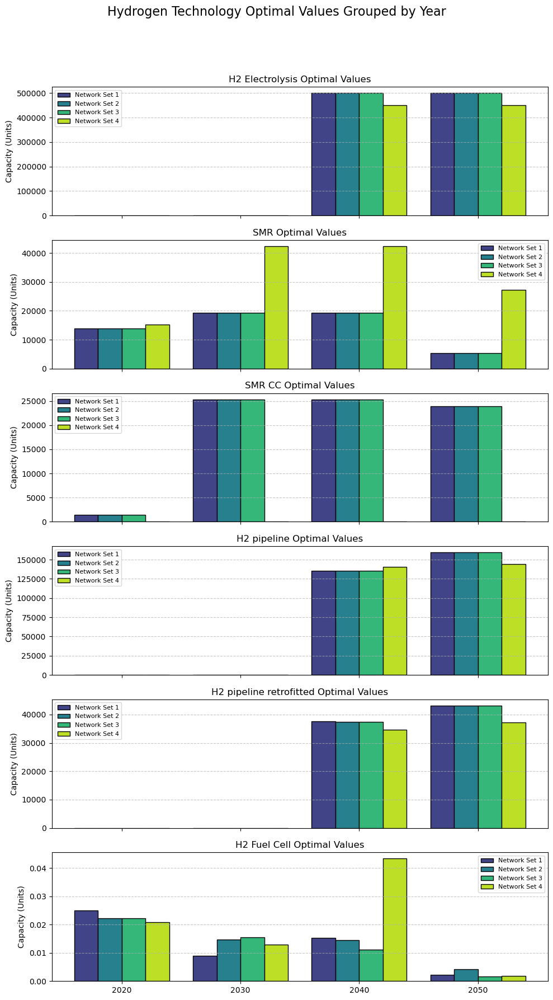

In [307]:
hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
plot_grouped_technology_values(test_df, network_list, [2020, 2030, 2040, 2050], hydrogen_tech_list, 'Optimal')

Trying to run the configuration that had maximimization limits below that given by the price hike simulation led to an optimization failure (handle free variables)

Tried with 430 GW across all years, now trying with 450. 

In [ ]:

def plot_grouped_technology_values(data_df, network_sets, years, hydrogen_tech_list, value_type):
    import matplotlib.pyplot as plt
    import pandas as pd
    import numpy as np

    """
    Plots grouped bar charts of technology values across network sets for each year,
    with connecting lines across bars for each network set.

    Args:
        data_df (pd.DataFrame): DataFrame with technology values, indexed by network names.
        network_sets (list of list): Each inner list is a set of 4 ordered networks (by year).
        years (list of str): List of years corresponding to the networks within each network set.
        hydrogen_tech_list (list): Technologies to be plotted.
        value_type (str): Either "Optimal" or "Installed".
    """
    num_techs = len(hydrogen_tech_list)
    num_sets = len(network_sets)
    num_years = len(years)

    colors = plt.cm.viridis(np.linspace(0.2, 0.9, num_sets))

    fig, axes = plt.subplots(num_techs, 1, figsize=(10, 3 * num_techs), sharex=True)
    if num_techs == 1:
        axes = [axes]

    fig.suptitle(f'Hydrogen Technology {value_type} Values Grouped by Year', fontsize=16, y=1.02)

    bar_width = 0.8 / num_sets

    for i, tech in enumerate(hydrogen_tech_list):
        ax = axes[i]

        for set_idx, net_set in enumerate(network_sets):
            tech_values = []
            x_centers = []

            for year_idx, net in enumerate(net_set):
                if tech in net.statistics().index.get_level_values(1).to_list():
                    value = net.statistics().loc['Link', tech]['Optimal Capacity']
                    tech_values.append(value)
                else:
                    tech_values.append(0.0)
                    print('technology not found')

                # Calculate bar center position
                x_center = year_idx + set_idx * bar_width + bar_width / 2
                x_centers.append(x_center)

            # Draw bars
            ax.bar(x_centers, tech_values, width=bar_width, color=colors[set_idx],
                   label=f'Network Set {set_idx + 1}', edgecolor='black')

            # Draw line connecting bar tops
            ax.plot(x_centers, tech_values, color=colors[set_idx], marker='o', linestyle='-')

        ax.set_title(f'{tech} {value_type} Values', fontsize=12)
        ax.set_ylabel('Capacity (Units)', fontsize=10)
        ax.set_xticks(np.arange(num_years) + bar_width * (num_sets - 1) / 2)
        ax.set_xticklabels(years)
        ax.grid(axis='y', linestyle='--', alpha=0.7)
        ax.legend(fontsize=8)

    plt.tight_layout(rect=[0, 0.03, 1, 0.98])
    plt.show()


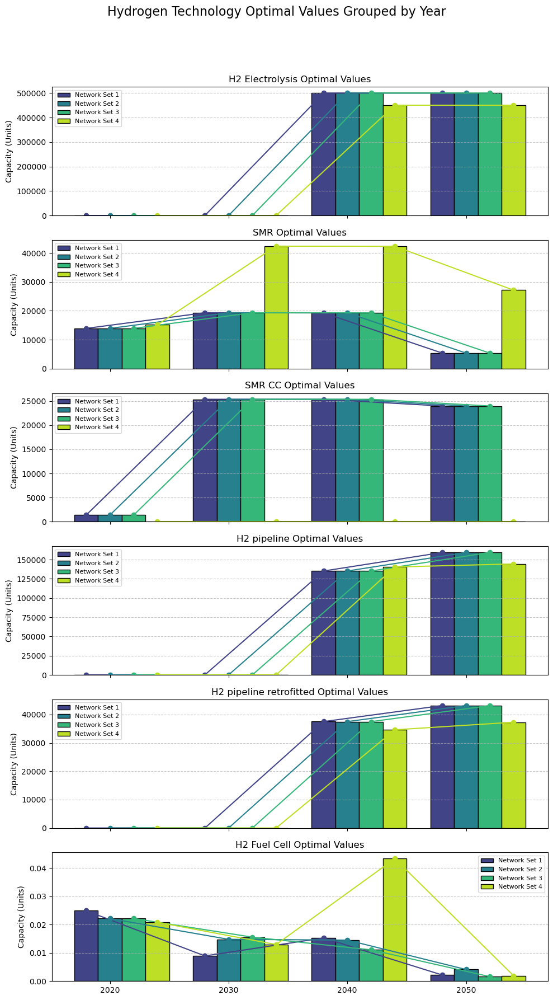

In [312]:
plot_grouped_technology_values(test_df, network_list, [2020, 2030, 2040, 2050], hydrogen_tech_list, 'Optimal')

In [ ]:
# If I switch to plotly, I can do the same, and be ablee to hover to the bars so that I can see the values of the bar.
#  Kept below, but I didn't love the way it looked. 

import plotly.graph_objects as go 
import numpy as np

def plot_interactive_grouped_technology_values(network_sets, years, hydrogen_tech_list, value_type):
    """
    Creates interactive bar + line plots for hydrogen tech values using Plotly.

    Args:
        network_sets (list of list): Each inner list is a set of 4 ordered networks (by year).
        years (list of str/int): Years corresponding to the networks in each set.
        hydrogen_tech_list (list): Technologies to plot.
        value_type (str): 'Optimal' or 'Installed'.
    """
    num_sets = len(network_sets)
    num_years = len(years)

    for tech in hydrogen_tech_list:
        fig = go.Figure()
        x_offsets = np.linspace(-0.3, 0.3, num_sets)  # bar separation

        # Collect line data for each network set
        for set_idx, net_set in enumerate(network_sets):
            tech_values = []
            x_positions = []

            for year_idx, net in enumerate(net_set):
                if tech in net.statistics().index.get_level_values(1).to_list():
                    value = net.statistics().loc['Link', tech]['Optimal Capacity']
                else:
                    value = 0.0

                tech_values.append(value)
                x_positions.append(years[year_idx] + x_offsets[set_idx])  # numeric x + offset

            # Add bars
            fig.add_trace(go.Bar(
                x=[years[year_idx] for year_idx in range(num_years)],
                y=tech_values,
                name=f'Network Set {set_idx + 1}',
                offsetgroup=str(set_idx),
                text=[f'{value:.2f}' for value in tech_values],
                hoverinfo='text+y',
            ))

            # Add lines connecting bar tops -- did not like the way this looked 
            #fig.add_trace(go.Scatter(
            #    x=[years[year_idx] for year_idx in range(num_years)],
            #    y=tech_values,
            #    mode='lines+markers',
            #    name=f'Set {set_idx + 1} Trend',
            #    line=dict(dash='solid'),
            #    showlegend=False,
            #))

        fig.update_layout(
            title=f'{tech} {value_type} Values Across Years',
            xaxis=dict(title='Year', tickvals=years),
            yaxis_title='Capacity (Units)',
            barmode='group',
            hovermode='x unified',
            legend_title='Network Sets',
            template='plotly_white'
        )
        fig.show()


In [334]:
Sankey_biomass_hydrogen(network_list[3][3])

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:25: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:28: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/var/folders/_w/ry357l9n0vjg8jgfczvkpk3r0000gn/T/ipykernel_1354/4180994803.py:70: FutureWarning:

unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.



In [330]:
Scenario3_trial_2040_19.statistics().loc[('Link', 'SMR')]['Optimal Capacity']

42319.44953

In [ ]:
Scenario3_trial_2020_20 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_20 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_20= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_20 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [332]:
Scenario3_trial_list_20 = [Scenario3_trial_2020_20,Scenario3_trial_2030_20,Scenario3_trial_2040_20, Scenario3_trial_2050_20]

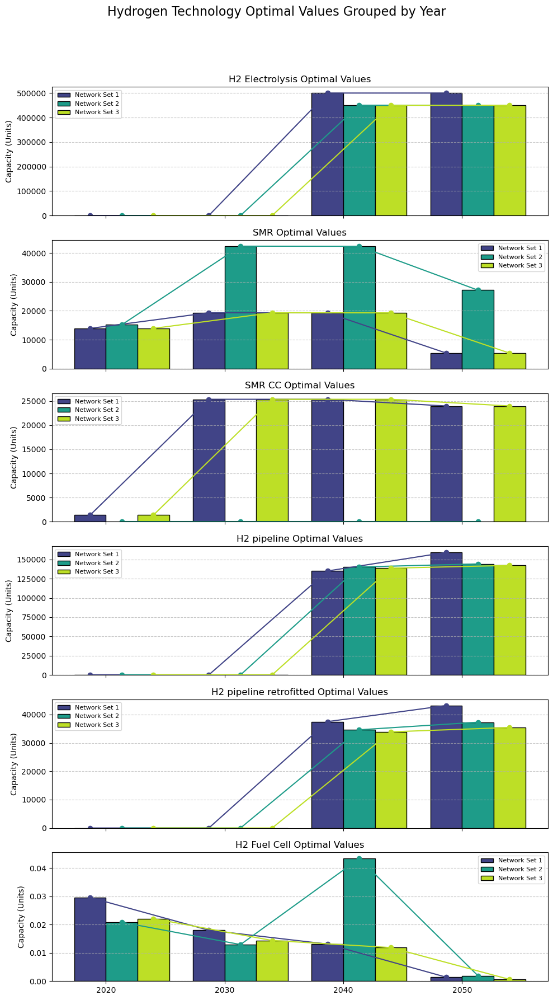

In [337]:
network_list = [Scenario3_trial_list_13, Scenario3_list_19, Scenario3_trial_list_20]
plot_grouped_technology_values(test_df, network_list, [2020, 2030, 2040, 2050], hydrogen_tech_list, 'Optimal')

In [363]:
value = Scenario3_trial_list_21[2].statistics().loc[('Link','SMR CC')]['Optimal Capacity']
print(f'{(value/1e3):e}')

1.387532e+00


For overlapping technologies, it more has to be that the sum of the overlapping technologies cannot be more than a certain GW amount right (like SMR and SMR cc, or pipeline and pipeline retroffitted), but that's a custom constraint (or a rather I should just alter the function such that x+y < z) 

In [342]:
Scenario3_trial_2020_21 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Scenario3_trial_2030_21 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Scenario3_trial_2040_21= pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Scenario3_trial_2050_21 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [344]:
Scenario3_trial_list_21 = [Scenario3_trial_2020_21, Scenario3_trial_2030_21, Scenario3_trial_2040_21,  Scenario3_trial_2050_21]

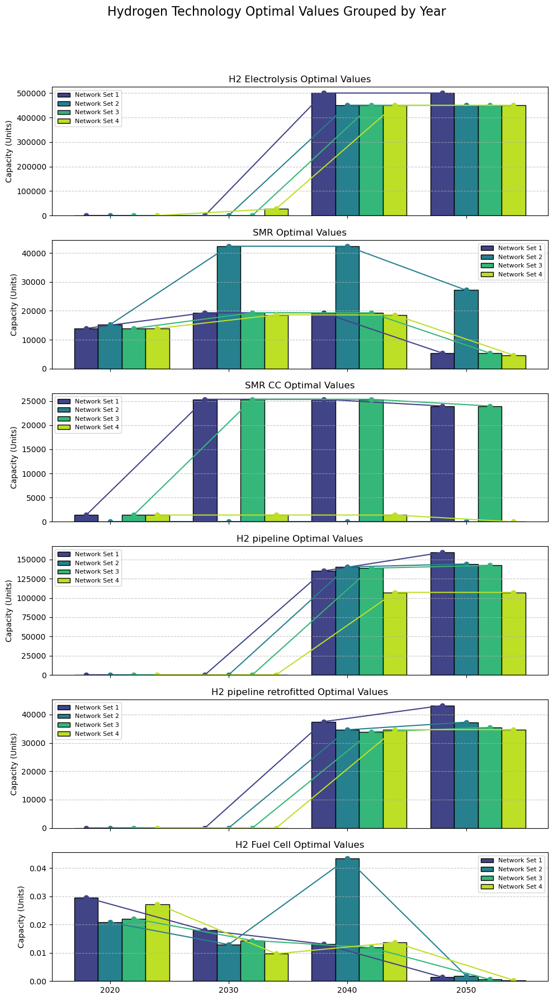

In [345]:
network_list = [Scenario3_trial_list_13, Scenario3_list_19, Scenario3_trial_list_20, Scenario3_trial_list_21 ]
plot_grouped_technology_values(test_df, network_list, [2020, 2030, 2040, 2050], hydrogen_tech_list, 'Optimal')

In [ ]:
value = Scenario3_trial_list_21[3].statistics().loc[('Link','H2 ')]['Optimal Capacity']
print(f'{(value/1e3):e}')

KeyError: 'H2 turbine'

In [396]:
for i in Scenario3_trial_list_21[3].statistics().loc['Link'].index:
    print(i)


BEV charger
Combined-Cycle Gas
DAC
DC
Fischer-Tropsch
H2 Electrolysis
H2 Fuel Cell
H2 pipeline
H2 pipeline retrofitted
Open-Cycle Gas
SMR
SMR CC
Sabatier
V2G
agriculture machinery oil
battery charger
battery discharger
biogas to gas
coal
electricity distribution grid
gas for industry
gas for industry CC
gas pipeline
gas pipeline new
home battery charger
home battery discharger
industry methanol
kerosene for aviation
lignite
methanolisation
naphtha for industry
nuclear
oil
oil refining
process emissions
process emissions CC
rural air heat pump
rural biomass boiler
rural gas boiler
rural ground heat pump
rural resistive heater
rural water tanks charger
rural water tanks discharger
shipping methanol
solid biomass for industry
solid biomass for industry CC
urban central CHP
urban central CHP CC
urban central air heat pump
urban central gas boiler
urban central resistive heater
urban central solid biomass CHP
urban central solid biomass CHP CC
urban central water tanks charger
urban central

## loading Scenario3, Scenario3.1, and Scenerio 3.3

In [397]:
#minimums
Scenario_min_hydrogen_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/min_scenario/networks/base_s_39___2020.nc')
Scenario_min_hydrogen_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/min_scenario/networks/base_s_39___2030.nc')
Scenario_min_hydrogen_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/min_scenario/networks/base_s_39___2040.nc')
Scenario_min_hydrogen_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/min_scenario/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [ ]:
#10 percent above the minimum
Scenario3_10pct_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/10%/networks/base_s_39___2020.nc')
Scenario3_10pct_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/10%/networks/base_s_39___2030.nc')
Scenario3_10pct_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/10%/networks/base_s_39___2040.nc')
Scenario3_10pct_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/10%/networks/base_s_39___2050.nc')

INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [399]:
#10 pct above the minimum delayed by two periods 
Scenario3_10pct_delay_2020 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results_10%_delay_two_period/networks/base_s_39___2020.nc')
Scenario3_10pct_delay_2030 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results_10%_delay_two_period/networks/base_s_39___2030.nc')
Scenario3_10pct_delay_2040 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results_10%_delay_two_period/networks/base_s_39___2040.nc')
Scenario3_10pct_delay_2050 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results_10%_delay_two_period/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [400]:
#collating these into lists
Minimum_list = [Scenario_min_hydrogen_2020, Scenario_min_hydrogen_2030, Scenario_min_hydrogen_2040, Scenario_min_hydrogen_2050]
tenpct_list = [Scenario3_10pct_2020, Scenario3_10pct_2030, Scenario3_10pct_2040, Scenario3_10pct_2050]
tenpct_delay_list = [Scenario3_10pct_delay_2020, Scenario3_10pct_delay_2030, Scenario3_10pct_delay_2040, Scenario3_10pct_delay_2050]

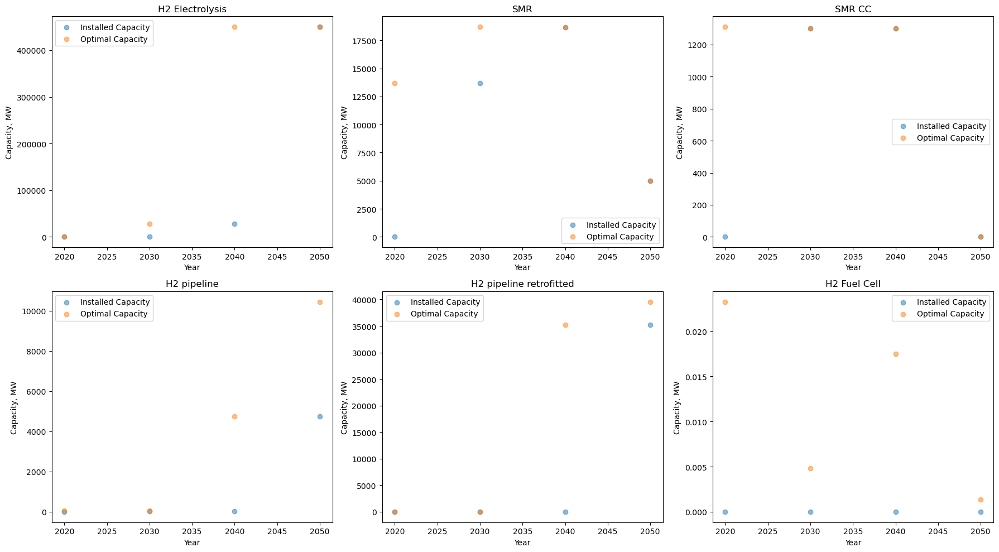

In [419]:
#
hydrogen_capacity_graphs([Scenario_min_hydrogen_2020, Scenario_min_hydrogen_2030, Scenario_min_hydrogen_2040, Scenario_min_hydrogen_2050])

In [431]:
for net in Minimum_list:
    tech = 'SMR'
    print(net.statistics().loc['Link', tech]['Optimal Capacity']/1000)


13.68993275
18.69888617
18.66574827
4.97592803


In [427]:
for net in Minimum_list:
    tech = 'H2 pipeline retrofitted'
    print(net.statistics().loc['Link', tech]['Installed Capacity'])


0.0
0.0
0.0
35258.6209


In [401]:
import matplotlib.pyplot as plt
import numpy as np
network_list = [Minimum_list, tenpct_list, tenpct_delay_list]
# List of hydrogen technologies you're interested in
hydrogen_tech_list = ['H2 Electrolysis', 'SMR', 'SMR CC', 'H2 pipeline', 'H2 pipeline retrofitted', 'H2 Fuel Cell'] #H2 turbine (apparently doesn't exist in Scenario 3)
hydrogen_tech_tuple_list = [('Link', tech) for tech in hydrogen_tech_list]
# Assuming network_list contains four lists, each of them containing PyPSA networks
# We need to gather the installed and optimal values across all networks for each technology

installed_values = {tech: [] for tech in hydrogen_tech_list}
optimal_values = {tech: [] for tech in hydrogen_tech_list}
# Iterate over the lists and extract the third network from each (index 2)
for network_set in network_list:
    network = network_set[2]  # Get the third network
    carrier_type = 'Link'
    # For each technology, extract the installed and optimal values across the networks
    for tech in hydrogen_tech_list:
        installed_value = 0
        optimal_value = 0
        if tech in network.statistics().loc[carrier_type].index:
            stats = network.statistics().loc[carrier_type, tech]
            installed_value = stats['Installed Capacity']
            optimal_value = stats['Optimal Capacity']
        
        # Append the values for this technology across the networks
        installed_values[tech].append(installed_value)
        optimal_values[tech].append(optimal_value)


In [403]:
new_df = pd.DataFrame(optimal_values)

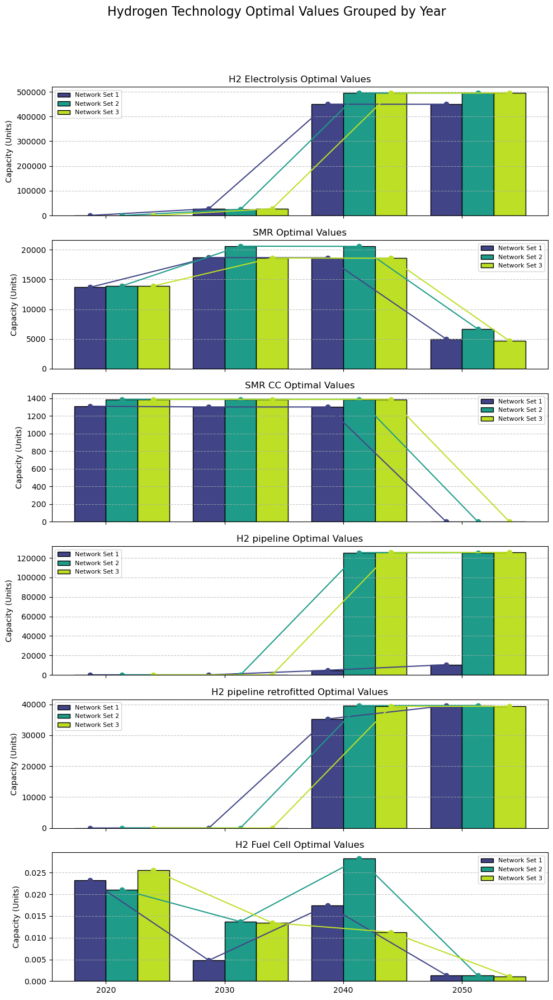

In [404]:
plot_grouped_technology_values(new_df, network_list, [2020, 2030, 2040, 2050], hydrogen_tech_list, 'Optimal')

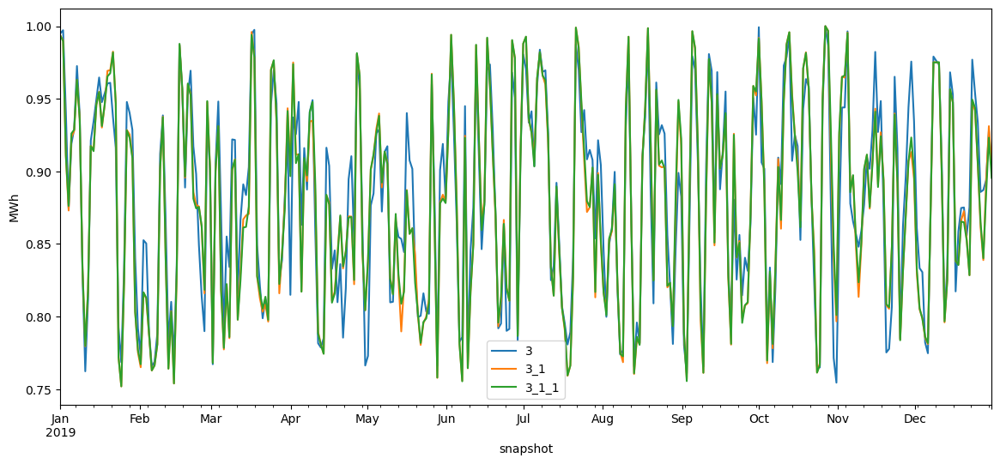

In [411]:
#2040
fig, ax = plt.subplots(figsize = (14,6))
i = 0
for net in [Minimum_list[3], tenpct_list[3], tenpct_delay_list[3]]:
    if 'EV battery' in net.stores.carrier.unique():
        #fig, ax = plt.subplots(figsize = (14,6))
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        year_list = ['3', '3_1', '3_1_1']
        EV_stores_soc.plot(label =  year_list[i])
        i += 1
        plt.ylabel('MWh')
plt.legend()


In [ ]:
fig, ax = plt.subplots(figsize = (14,6))
if 'EV battery' in net.stores.carrier.unique():
        #fig, ax = plt.subplots(figsize = (14,6))
        EV_stores = net.stores[net.stores.carrier == 'EV battery'].index
        EV_stores_soc = net.stores_t.e[EV_stores]
        EV_stores_e_nom = net.stores.loc[EV_stores]['e_nom'].sum()
        EV_stores_soc = EV_stores_soc.copy().sum(axis=1) / EV_stores_e_nom
        year_list = ['3', '3_1', '3_1_1']
        EV_stores_soc.plot(label =  year_list[i])
        i += 1
        plt.ylabel('MWh')
plt.legend()

conventional  geothermal    8.555389e+05
              nuclear       3.444108e+08
              CCGT          1.038761e+01
              OCGT          1.590574e+00
              coal          8.425681e-01
              lignite       8.068682e-01
dtype: float64
renewable  offwind-ac       7.597561e+08
           offwind-dc       1.243029e+09
           offwind-float    4.875274e+08
           onwind           2.074971e+09
           ror              1.543333e+08
           solar            2.705242e+09
           solar rooftop    9.889764e+08
           solar-hsat       2.120714e+08
dtype: float64


/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:379: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:390: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



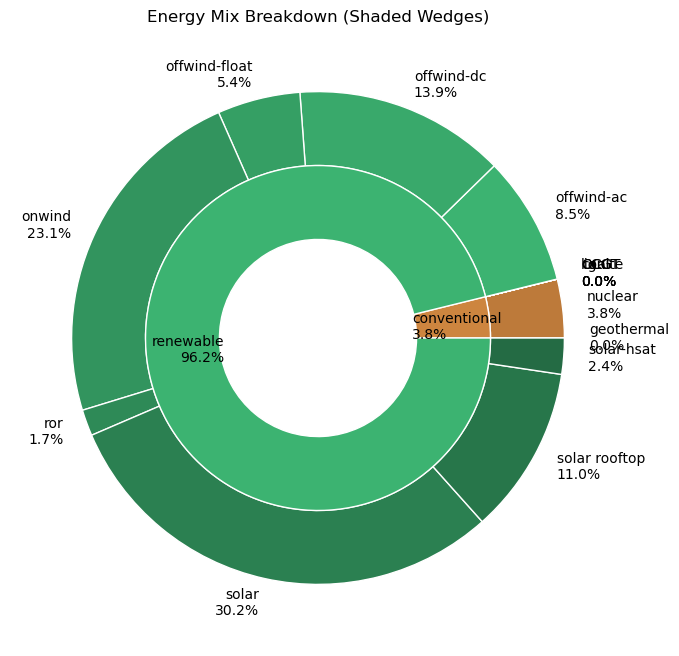

In [413]:
af.carrier_pie_chart(Minimum_list[2])

conventional  geothermal    8.574059e+05
              nuclear       5.051520e+08
              CCGT          2.655420e+06
              OCGT          8.391147e+00
              coal          4.140774e+00
              lignite       3.845128e+00
dtype: float64
renewable  offwind-ac       5.570461e+08
           offwind-dc       9.152995e+08
           offwind-float    2.768033e+02
           onwind           2.383582e+09
           ror              1.543280e+08
           solar            3.014591e+09
           solar rooftop    1.154499e+09
           solar-hsat       2.844826e+08
dtype: float64


/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:379: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:390: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



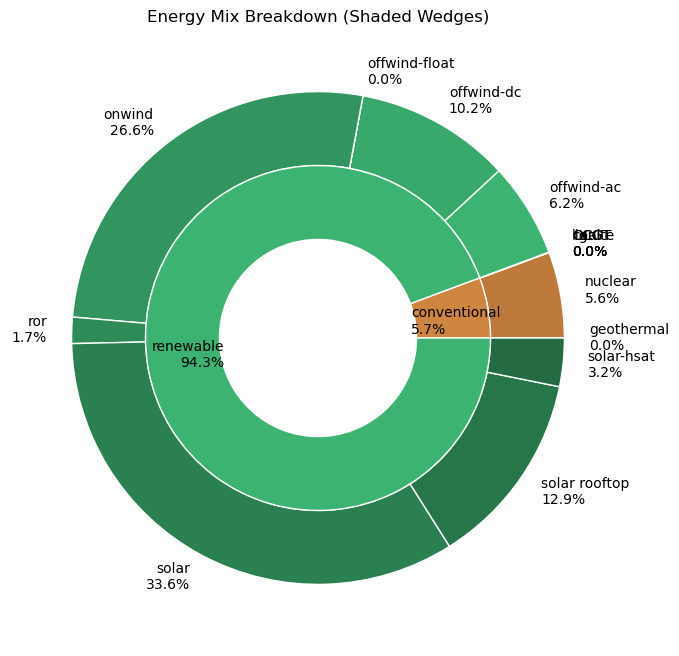

In [414]:
af.carrier_pie_chart(tenpct_list[2])

conventional  geothermal    8.573544e+05
              nuclear       5.049506e+08
              CCGT          2.651365e+06
              OCGT          2.958228e+00
              coal          1.429607e+00
              lignite       1.500348e+00
dtype: float64
renewable  offwind-ac       5.724548e+08
           offwind-dc       9.108677e+08
           offwind-float    1.035610e+02
           onwind           2.375042e+09
           ror              1.543274e+08
           solar            3.000477e+09
           solar rooftop    1.154591e+09
           solar-hsat       2.966303e+08
dtype: float64


/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:379: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/Users/katherine.shaw/Desktop/pypsa-eur/Evaluation Documents/Auxillary_Functions.py:390: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



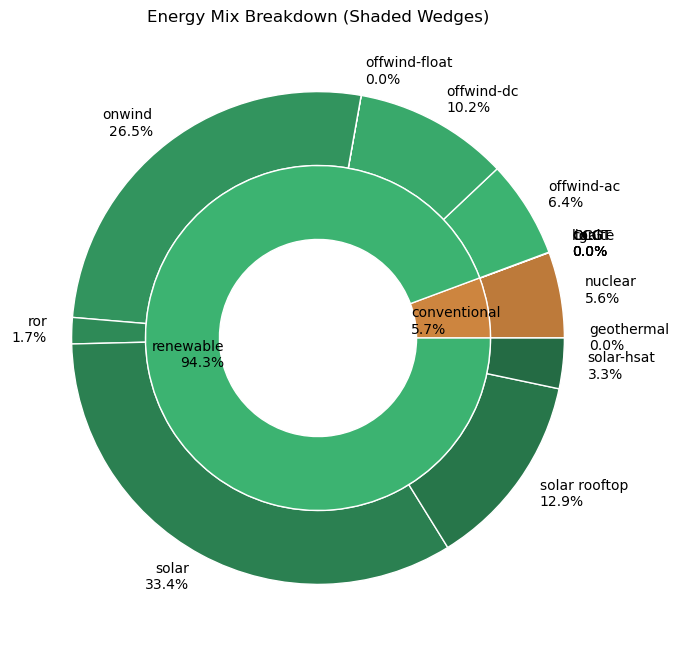

In [415]:
af.carrier_pie_chart(tenpct_delay_list[2])

In [418]:
Scenario3_trial_list_21[3].stores[Scenario3_trial_list_21[3].stores.carrier == 'battery']

,bus,type,carrier,e_nom,e_nom_mod,e_nom_extendable,e_nom_min,e_nom_max,e_min_pu,e_max_pu,...,marginal_cost,marginal_cost_quadratic,marginal_cost_storage,capital_cost,standing_loss,active,build_year,lifetime,e_nom_opt,location
Store,,,,,,,,,,,,,,,,,,,,,
AL0 0 battery-2050,AL0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009389,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000151,
AT0 0 battery-2050,AT0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010519,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000166,
BA0 0 battery-2050,BA0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010748,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000158,
BE0 0 battery-2050,BE0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009084,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000155,
BG0 0 battery-2050,BG0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009835,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000160,
CH0 0 battery-2050,CH0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009695,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000155,
CZ0 0 battery-2050,CZ0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009045,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000163,
DE0 0 battery-2050,DE0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010546,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000175,
DK0 0 battery-2050,DK0 0 battery,,battery,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010757,0.0,0.0,6395.868853,0.0,True,2050,30.0,0.000162,


Evaluating current thermal energy storage at the home level -- it says there is individual thermal energy storage becasue there is a time cosntant for it, but how much and how is ti used? 

In [444]:
network_choice = Scenario_min_hydrogen_2040
Scenario_min_hydrogen_2040.stores.carrier.unique() #urban decentral water tanks, rural water tanks?
network_choice.stores[network_choice.stores.carrier == 'urban decentral water tanks'] #both urban decentral water tanks and rural water tanks have a time of 5 years 
#what buses are these connected to? 
bus_connections(network_choice, 'DE0 0 urban decentral water tanks')

The stores connected to this bus are:   ['DE0 0 urban decentral water tanks-2040']
The incoming links to this bus are from the bus:  ['DE0 0 urban decentral heat']
The incoming links are:  Index(['DE0 0 urban decentral water tanks charger'], dtype='object', name='Link')
The outgoing links from this bus are to the bus:  ['DE0 0 urban decentral heat']


In [445]:
bus_connections(network_choice, 'DE0 0 urban decentral heat')

The generators connected to this bus are:    ['DE0 0 urban decentral solar thermal collector-2040']
The loads connected to this bus are:     ['DE0 0 urban decentral heat']
The incoming links to this bus are from the bus:  ['DE0 0' 'DE0 0 low voltage' 'EU solid biomass' 'DE0 0 gas'
 'DE0 0 low voltage' 'DE0 0 urban decentral water tanks'
 'DE0 0 low voltage' 'DE0 0 gas' 'DE0 0 low voltage']
The incoming links are:  Index(['DE0 0 urban decentral DAC-2040',
       'DE0 0 urban decentral air heat pump-2040',
       'DE0 0 urban decentral biomass boiler-2040',
       'DE0 0 urban decentral gas boiler-2040',
       'DE0 0 urban decentral resistive heater-2040',
       'DE0 0 urban decentral water tanks discharger',
       'DE0 0 urban decentral air heat pump-2030',
       'DE0 0 urban decentral gas boiler-2030',
       'DE0 0 urban decentral resistive heater-2030'],
      dtype='object', name='Link')
The outgoing links from this bus are to the bus:  ['DE0 0 urban decentral water tanks']


Text(0.5, 1.0, 'Use of urban decentral water tanks  e/e_nom')

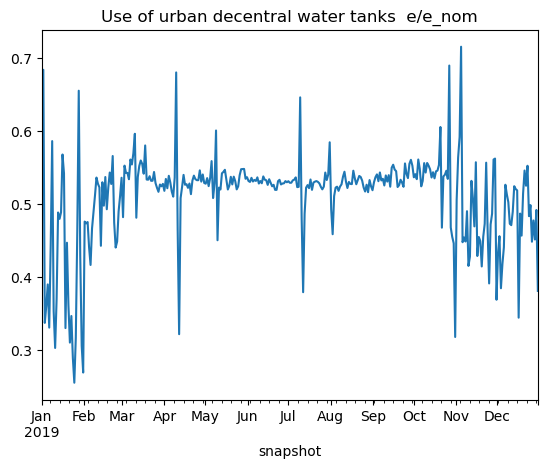

In [475]:
network_choice = Scenario_min_hydrogen_2040
urban_water_stores_index = network_choice.stores[network_choice.stores.carrier == 'urban decentral water tanks'].index

network_choice.stores.loc[urban_water_stores_index].e_nom_opt
#for entire countries, .1 MWh in 2050? Max 3 MWh in 2050
max_storage = network_choice.stores.loc[urban_water_stores_index].e_nom_opt
max_storage = max_storage.sum()
(network_choice.stores_t.e[urban_water_stores_index].sum(axis = 1)/max_storage).plot()
plt.title('Use of urban decentral water tanks  e/e_nom')

used more in the winter than in the summer it looks like (variation in storage == use), 

<Axes: xlabel='snapshot'>

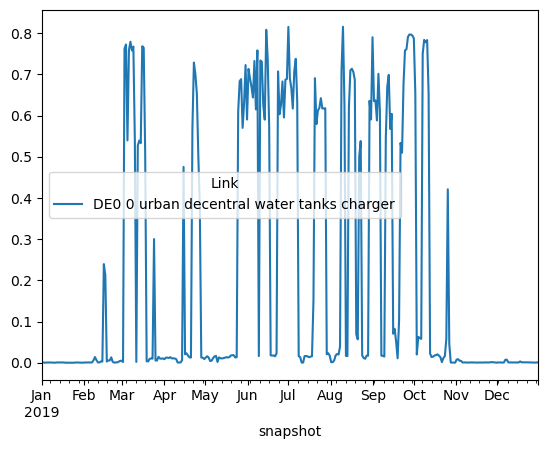

In [481]:
inbound_link_name = network_choice.links[network_choice.links.bus1 == 'DE0 0 urban decentral water tanks'].index #just choosing one country, Germany 
(network_choice.links_t.p1[inbound_link_name]*-1).plot()

<Axes: xlabel='snapshot'>

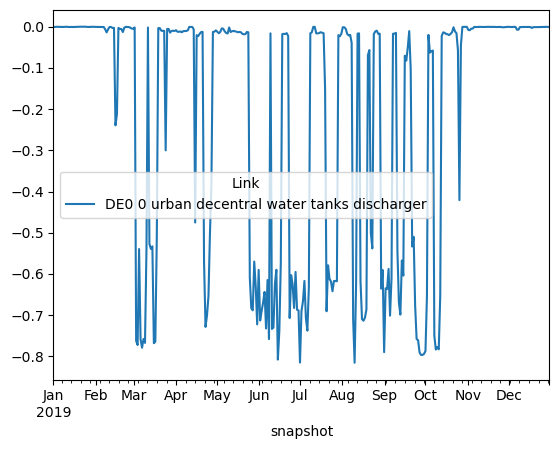

In [486]:
outbound_link_name = network_choice.links[network_choice.links.bus0 == 'DE0 0 urban decentral water tanks'].index #just choosing one country, Germany 
(network_choice.links_t.p0[outbound_link_name]*-1).plot()

<Axes: xlabel='snapshot'>

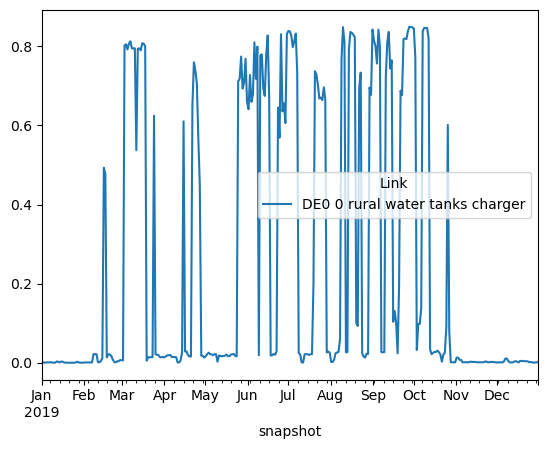

In [482]:
inbound_link_name = network_choice.links[network_choice.links.bus1 == 'DE0 0 rural water tanks'].index #just choosing one country, Germany 
(network_choice.links_t.p1[inbound_link_name]*-1).plot()

In [ ]:
#So we want additional thermal inertial, only from the country level low voltage sector though
#how much delay is typically happening between .... ahhh, Ineed this on a smaller timescale I think, how else would be operate on a 3 hour timescale correctly?  right now there is a two hour timespace between timesteps


In [493]:
water_charger_links_check = pd.DataFrame(network_choice.links_t.p1[inbound_link_name]*-1)
water_charger_links_check['outbound link'] = network_choice.links_t.p1[outbound_link_name]*-1
water_charger_links_check['more in than out?'] = (water_charger_links_check['DE0 0 rural water tanks charger'] > water_charger_links_check['outbound link'])
water_charger_links_check['more in than out?'].value_counts()

more in than out?
True     325
False     12
Name: count, dtype: int64

In [516]:
#what is satisfying the heat demand across all the sectors? 
network_choice.links.carrier.unique() #'urban central air heat pump', 'urban central water tanks charger',
       #'urban central water tanks discharger',
       #'urban central resistive heater', 'urban central gas boiler',
       #'urban central CHP', 'urban central CHP CC',
network_choice.loads.carrier.unique() #heat loads: 'low-temperature heat for industry', 'agriculture heat', 'urban central heat', 'urban decentral heat', 'rural heat'
heat_carriers = ['low-temperature heat for industry', 'agriculture heat', 'urban central heat', 'urban decentral heat', 'rural heat']
#for i in network_choice.buses[network_choice.buses.carrier.isin(heat_carriers)].index:
#    print(i)
#not seeing low temp heat for industry or agricultural heat buses 
network_choice.buses[network_choice.buses.carrier.isin(heat_carriers)]
urban_central_heat_buses = network_choice.buses[network_choice.buses.carrier == 'urban central heat']
urban_decentral_heat_buses = network_choice.buses[network_choice.buses.carrier == 'urban decentral heat']
rural_heat_buses = network_choice.buses[network_choice.buses.carrier == 'rural heat']

bus_connections(network_choice, rural_heat_buses.index[4]) #low temp heat for industry connected to urban central heat, agricultural heat connected to rural buses

The generators connected to this bus are:    ['BG0 0 rural solar thermal collector-2040']
The loads connected to this bus are:     ['BG0 0 agriculture heat' 'BG0 0 rural heat']
The incoming links to this bus are from the bus:  ['BG0 0 low voltage' 'EU solid biomass' 'BG0 0 gas' 'BG0 0 low voltage'
 'BG0 0 low voltage' 'BG0 0 rural water tanks' 'BG0 0 gas'
 'BG0 0 low voltage' 'BG0 0 low voltage']
The incoming links are:  Index(['BG0 0 rural air heat pump-2040', 'BG0 0 rural biomass boiler-2040',
       'BG0 0 rural gas boiler-2040', 'BG0 0 rural ground heat pump-2040',
       'BG0 0 rural resistive heater-2040',
       'BG0 0 rural water tanks discharger', 'BG0 0 rural gas boiler-2030',
       'BG0 0 rural ground heat pump-2030',
       'BG0 0 rural resistive heater-2030'],
      dtype='object', name='Link')
The outgoing links from this bus are to the bus:  ['BG0 0 rural water tanks']


In [ ]:
#so the heat buses are connected to the water tank buses, but they are seperate 

In [527]:
network_choice = Scenario_min_hydrogen_2050
network_choice.links.carrier.unique()

array(['DC', 'oil refining', 'co2 sequestered', 'OCGT', 'lignite', 'coal',
       'CCGT', 'H2 Electrolysis', 'H2 Fuel Cell', 'gas pipeline',
       'gas pipeline new', 'H2 pipeline retrofitted', 'H2 pipeline',
       'battery charger', 'battery discharger', 'Sabatier', 'SMR CC',
       'SMR', 'BEV charger', 'V2G', 'urban central air heat pump',
       'urban central water tanks charger',
       'urban central water tanks discharger',
       'urban central resistive heater', 'urban central gas boiler',
       'urban central CHP', 'urban central CHP CC', 'biogas to gas',
       'urban central solid biomass CHP',
       'urban central solid biomass CHP CC', 'solid biomass for industry',
       'solid biomass for industry CC', 'gas for industry',
       'gas for industry CC', 'industry methanol', 'methanolisation',
       'shipping methanol', 'Fischer-Tropsch', 'naphtha for industry',
       'kerosene for aviation', 'process emissions',
       'process emissions CC', 'agriculture machinery

In [528]:
network_choice = Scenario_min_hydrogen_2040
network_choice.links[network_choice.links.carrier == 'rural air heat pump']
#seems to be only air source heat pumps... 
#link goes from low volrage to rural heat 
bus_connections(network_choice, 'DE0 0 rural heat')

The generators connected to this bus are:    ['DE0 0 rural solar thermal collector-2040']
The loads connected to this bus are:     ['DE0 0 agriculture heat' 'DE0 0 rural heat']
The incoming links to this bus are from the bus:  ['DE0 0 low voltage' 'EU solid biomass' 'DE0 0 gas' 'DE0 0 low voltage'
 'DE0 0 low voltage' 'DE0 0 rural water tanks' 'DE0 0 gas'
 'DE0 0 low voltage' 'DE0 0 low voltage']
The incoming links are:  Index(['DE0 0 rural air heat pump-2040', 'DE0 0 rural biomass boiler-2040',
       'DE0 0 rural gas boiler-2040', 'DE0 0 rural ground heat pump-2040',
       'DE0 0 rural resistive heater-2040',
       'DE0 0 rural water tanks discharger', 'DE0 0 rural gas boiler-2030',
       'DE0 0 rural ground heat pump-2030',
       'DE0 0 rural resistive heater-2030'],
      dtype='object', name='Link')
The outgoing links from this bus are to the bus:  ['DE0 0 rural water tanks']


In [ ]:
#the heat pumps and resistive heaters are forumulated as a link between the low voltage network and a heat bus...
#the other types of boilers are also connected to the heat bus, 
#it is from the heat bus that there is then a link to  

In [529]:
network_choice.buses.loc['DE0 0 rural heat']

v_nom                    1.0
type                        
x                   9.203934
y                  51.117369
carrier           rural heat
unit                  MWh_th
v_mag_pu_set             1.0
v_mag_pu_min             0.0
v_mag_pu_max             inf
control                   PQ
generator                   
sub_network                 
substation_lv            NaN
substation_off           NaN
country                   DE
location               DE0 0
Name: DE0 0 rural heat, dtype: object

In [530]:
network_choice.links.loc['DE0 0 rural water tanks charger']

bus0                                DE0 0 rural heat
bus1                         DE0 0 rural water tanks
type                                                
carrier                    rural water tanks charger
efficiency                                       0.9
active                                          True
build_year                                         0
lifetime                                         inf
p_nom                                            0.0
p_nom_mod                                        0.0
p_nom_extendable                                True
p_nom_min                                        0.0
p_nom_max                                        inf
p_set                                            0.0
p_min_pu                                         0.0
p_max_pu                                         1.0
capital_cost                                     0.0
marginal_cost                               0.009476
marginal_cost_quadratic                       

In [ ]:
#shouldn't there be a rule such that the additional storage can only be paired with a heat pump? 
# I mean surely if the heat storage encourages further use of biomass boilers, that would not be a good idea 
# but how would it do that? those generators already operate on an 'as needed' basis right? that is the benefit of them 
#so there wouldn't be a price change to using the 

In [ ]:
network_choice = Scenario_min_hydrogen_2040
air_pump_links = network_choice.links[network_choice.links.carrier == 'rural air heat pump'].index
network_choice.links.loc[air_pump_links].marginal_cost
 #.loc['IT0 0 rural air heat pump-2040'] #[network_choice.links.carrier == 'rural air heat pump']
 #WHY ARE THESE NOT BASED ON ELECTRICITY PRICES?
 #I guess since it's only a link, the price comes from the price of the low voltage network, so it's ok?


Link
AL0 0 rural air heat pump-2040    0.009015
AT0 0 rural air heat pump-2040    0.010533
BA0 0 rural air heat pump-2040    0.010023
BE0 0 rural air heat pump-2040    0.009503
BG0 0 rural air heat pump-2040    0.009652
CH0 0 rural air heat pump-2040    0.010369
CZ0 0 rural air heat pump-2040    0.009652
DE0 0 rural air heat pump-2040    0.009685
DK0 0 rural air heat pump-2040    0.010419
DK1 0 rural air heat pump-2040    0.009636
EE0 0 rural air heat pump-2040    0.009709
ES0 0 rural air heat pump-2040    0.009597
ES6 0 rural air heat pump-2040    0.009971
FI1 0 rural air heat pump-2040    0.009901
FR0 0 rural air heat pump-2040    0.010539
FR5 0 rural air heat pump-2040    0.010638
GB2 0 rural air heat pump-2040    0.009649
GB3 0 rural air heat pump-2040    0.010936
GR0 0 rural air heat pump-2040    0.009515
HR0 0 rural air heat pump-2040    0.010757
HU0 0 rural air heat pump-2040    0.009627
IE3 0 rural air heat pump-2040    0.010925
IT0 0 rural air heat pump-2040    0.009866
IT4 0 

In [550]:
network_choice = Scenario_min_hydrogen_2040
network_choice.stores.carrier.unique() #'rural water tanks'
network_choice.stores[network_choice.stores.carrier == 'rural water tanks']

,bus,type,carrier,e_nom,e_nom_mod,e_nom_extendable,e_nom_min,e_nom_max,e_min_pu,e_max_pu,...,marginal_cost,marginal_cost_quadratic,marginal_cost_storage,capital_cost,standing_loss,active,build_year,lifetime,e_nom_opt,location
Store,,,,,,,,,,,,,,,,,,,,,
AL0 0 rural water tanks-2040,AL0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009493,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.002915,
AT0 0 rural water tanks-2040,AT0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010500,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.002999,
BA0 0 rural water tanks-2040,BA0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010040,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.002999,
BE0 0 rural water tanks-2040,BE0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009008,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.003081,
BG0 0 rural water tanks-2040,BG0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010419,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.002952,
CH0 0 rural water tanks-2040,CH0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009108,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.003077,
CZ0 0 rural water tanks-2040,CZ0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009760,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.003125,
DE0 0 rural water tanks-2040,DE0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.009312,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.003277,
DK0 0 rural water tanks-2040,DK0 0 rural water tanks,,rural water tanks,0.0,0.0,True,0.0,inf,0.0,1.0,...,0.010194,0.0,0.0,29429.506158,0.013793,True,2040,30.0,0.003240,


## Did the addition of storage units work? [Jul 22]

In [551]:
Heatflex_2020_1 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2020.nc')
Heatflex_2030_1 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2030.nc')
Heatflex_2040_1 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2040.nc')
Heatflex_2050_1 = pypsa.Network('/Users/katherine.shaw/Desktop/pypsa-eur/results/networks/base_s_39___2050.nc')


INFO:pypsa.io:Imported network base_s_39___2020.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2030.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2040.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores
INFO:pypsa.io:Imported network base_s_39___2050.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units, stores


In [552]:
Heatflex_2020_1.storage_units

,bus,control,type,p_nom,p_nom_mod,p_nom_extendable,p_nom_min,p_nom_max,p_min_pu,p_max_pu,...,state_of_charge_initial_per_period,state_of_charge_set,cyclic_state_of_charge,cyclic_state_of_charge_per_period,max_hours,efficiency_store,efficiency_dispatch,standing_loss,inflow,p_nom_opt
StorageUnit,,,,,,,,,,,,,,,,,,,,,
AT0 0 PHS,AT0 0,PQ,,5303.300000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,293.679662,0.866025,0.866025,0.0,0.0,5303.300000
BA0 0 PHS,BA0 0,PQ,,440.000000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,0.007907,0.866025,0.866025,0.0,0.0,440.000000
BE0 0 PHS,BE0 0,PQ,,1308.000000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,4.365443,0.866025,0.866025,0.0,0.0,1308.000000
BG0 0 PHS,BG0 0,PQ,,864.000000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,31.643519,0.866025,0.866025,0.0,0.0,864.000000
CH0 0 PHS,CH0 0,PQ,,5107.550000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,67.775005,0.866025,0.866025,0.0,0.0,5107.550000
CZ0 0 PHS,CZ0 0,PQ,,1175.009552,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,1.924807,0.866025,0.866025,0.0,0.0,1175.009552
DE0 0 PHS,DE0 0,PQ,,7241.806000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,4.947858,0.866025,0.866025,0.0,0.0,7241.806000
ES0 0 PHS,ES0 0,PQ,,7498.350000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,497.594360,0.866025,0.866025,0.0,0.0,7498.350000
ES6 0 PHS,ES6 0,PQ,,1372.400000,0.0,False,0.0,inf,-1.0,1.0,...,False,NaN,True,True,43.483247,0.866025,0.866025,0.0,0.0,1372.400000
